# Building Trust in AI Screening: Grad-CAM-Enabled Breast Cancer Detection on CBIS-DDSM

## Introduction

Early and accurate breast cancer detection saves lives, but screening workflows are constrained by reader workload and variability. This project builds an **explainable deep-learning pipeline** for classifying mammograms on the **CBIS-DDSM** dataset, emphasizing **clinical usability, transparency (Grad-CAM), and reproducibility** over black-box accuracy.

## What this codebase does
- **Data ingestion & preparation**: Merges CBIS-DDSM CSV metadata (including `dicom_info`) and constructs absolute file paths; standardizes labels and splits; validates integrity.
- **Robust `tf.data` pipelines**: Applies `preprocess_input`, **targeted augmentation** (multi-scale resize, subtle brightness/contrast, transpose-as-rotation, center-exclusion crop), and **class-imbalance mitigation via oversampling**; uses `shuffle → batch → prefetch → dataset.repeat`.
- **Model zoo for experiments**: 
  - `create_optimized_model(...)` with **VGG16**, **EfficientNet**, and lightweight baselines.  
  - `create_enhanced_model(...)` with **medical_vgg** and **dual_input_vgg** variants for domain-specific exploration.
- **Training orchestration & monitoring**: High-signal callbacks (**DetailedModelCheckpoint**, **PerformanceMonitor**, **MedicalMetricsCallback**), **Adam** optimizer with **cosine LR**, and CSV logs/checkpoints for exact reproducibility.
- **Evaluation you can trust**: `evaluate_model_performance(...)` collects predictions to compute **confusion matrix, sensitivity (recall), specificity, accuracy, and AUC**, enabling operating-point trade-offs (e.g., high-sensitivity triage vs balanced screening).
- **Explainability (Grad-CAM)**: `create_simple_gradcam`, `visualize_balanced_gradcam`, and ready-made runners to generate **lesion-aligned heatmaps** that support clinician trust and error analysis.
- **Single source of truth**: A global `global_data` registry tracks datasets, steps, models, metrics, and artifacts across runs for safer, resumable workflows (e.g., `recover_from_checkpoint`, `continue_training`).

## Design principles
- **Clinical orientation**: Prioritize sensitivity and interpretability; use Grad-CAM to inspect where the model looks—useful for surfacing dense-tissue failures and architectural distortions.
- **Reproducibility first**: Deterministic seeds, explicit splits, versioned checkpoints/logs, and minimal hidden state.
- **Operational realism**: Balanced metrics reporting, thresholded decisions, and callbacks that surface drift or instability early.

## How to run (at a glance)
1. **Verify environment**: Run `test_training_setup()` to check TensorFlow, data paths, and GPU/CPU availability.  
2. **Build datasets**: Execute the data-prep and dataset cells to populate `global_data` (train/val/test with oversampling).  
3. **Train**: Use `train_model_with_monitoring(...)` or `simple_train(...)` (VGG16/EfficientNet/medical_vgg options).  
4. **Evaluate & explain**: Run `evaluate_model_performance(...)`, then generate Grad-CAM via `run_gradcam_only(...)` or `visualize_balanced_gradcam(...)`.

> **Outcome**: A transparent, end-to-end mammography classifier with reproducible training, rigorous evaluation, and clinician-readable explanations—built to be extended, audited, and deployed thoughtfully.


In [42]:
# ================================================================================
# SECTION 1: IMPORTS AND SETUP
# ================================================================================

import os
import pandas as pd
import numpy as np
import tensorflow as tf
from tensorflow.keras import layers, models, optimizers, callbacks
from tensorflow.keras.applications import VGG16, EfficientNetB0
from tensorflow.keras.applications.vgg16 import preprocess_input
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score
from sklearn.utils.class_weight import compute_class_weight
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

# Set seeds for reproducibility
np.random.seed(42)
tf.random.set_seed(42)

# Configure TensorFlow for CPU optimization
tf.config.threading.set_inter_op_parallelism_threads(4)
tf.config.threading.set_intra_op_parallelism_threads(4)

print("TensorFlow version:", tf.__version__)
print("GPU Available:", len(tf.config.list_physical_devices('GPU')) > 0)
print("Using CPU optimization settings")


TensorFlow version: 2.18.0
GPU Available: False
Using CPU optimization settings


In [78]:
# ================================================================================
# SECTION 2: DATA LOADING AND PREPROCESSING
# ================================================================================

def load_and_prepare_data():
    print("\n" + "="*60)
    print("LOADING AND PREPARING DATA")
    print("="*60)
    
    # --- PATH SETUP ------------------------------------------------------------
    # Use the current working directory as the project root, so code works if moved.
    base_dir = os.getcwd()
    # Expect the CSVs to live under ./CBIS-DDSM/csv/
    csv_dir = os.path.join(base_dir, 'CBIS-DDSM', 'csv')
    
    # --- LOAD CSV FILES --------------------------------------------------------
    # Four official description files (calc vs mass) × (train vs test),
    # plus a dicom_info index that maps study/series UIDs to actual image paths.
    calc_train = pd.read_csv(os.path.join(csv_dir, 'calc_case_description_train_set.csv'))
    mass_train = pd.read_csv(os.path.join(csv_dir, 'mass_case_description_train_set.csv'))
    calc_test  = pd.read_csv(os.path.join(csv_dir, 'calc_case_description_test_set.csv'))
    mass_test  = pd.read_csv(os.path.join(csv_dir, 'mass_case_description_test_set.csv'))
    dicom_info = pd.read_csv(os.path.join(csv_dir, 'dicom_info.csv'))
    
    # --- SCHEMA NORMALIZATION --------------------------------------------------
    # Make headers predictable: lowercase, trim whitespace, replace spaces with underscores.
    # This avoids fragile code due to accidental header variations.
    for df in [calc_train, mass_train, calc_test, mass_test, dicom_info]:
        df.columns = (
            df.columns
              .str.strip()
              .str.lower()
              .str.replace(' ', '_')
        )
    
    # --- CONCAT PER SPLIT ------------------------------------------------------
    # Keep train and test strictly separate to prevent any inadvertent leakage.
    # (We only combine calc & mass within each split.)
    train_desc = pd.concat([calc_train, mass_train], ignore_index=True)
    test_desc  = pd.concat([calc_test,  mass_test ], ignore_index=True)
    
    # Basic visibility into dataset sizes (quick sanity check).
    print(f"Loaded - Train: {len(train_desc)}, Test: {len(test_desc)}")
    
    return train_desc, test_desc, dicom_info, base_dir


def merge_and_create_paths(desc_df, dicom_info, base_dir):
    # --- UID EXTRACTION --------------------------------------------------------
    # Split the original path string to recover UIDs.
    # If the dataset layout changes, these [-3], [-2] indices will need an update.
    parts = desc_df['image_file_path'].str.split('/')
    
    # Keep only columns we need and create a working subset to avoid mutating input.
    desc_sub = desc_df[['patient_id', 'pathology']].copy()
    # Pull out the stable radiology identifiers used to match DICOM metadata.
    desc_sub['studyinstanceuid']  = parts.str[-3]  # e.g., .../<study>/<series>/<file>
    desc_sub['seriesinstanceuid'] = parts.str[-2]
    
    # --- JOIN WITH DICOM INDEX -------------------------------------------------
    # Inner join: drop any rows we can't resolve to an image path.
    # If you want to audit what was dropped, consider doing a left-join and inspecting nulls first.
    df = desc_sub.merge(
        dicom_info[['studyinstanceuid', 'seriesinstanceuid', 'image_path']],
        on=['studyinstanceuid', 'seriesinstanceuid'],
        how='inner'
    )
    
    # --- ABSOLUTE PATHS & EXISTENCE FILTER ------------------------------------
    # Build absolute file paths rooted at base_dir and keep only those that exist.
    df['filepath'] = df['image_path'].apply(lambda p: os.path.join(base_dir, p))
    df = df[df['filepath'].apply(os.path.exists)].reset_index(drop=True)
    
    # Optional: ensure we didn't filter out everything due to a bad base_dir or missing files.
    # assert len(df) > 0, "No valid filepaths found. Check base_dir, downloads, and dicom_info paths."
    
    # --- BINARY LABELS ---------------------------------------------------------
    # Create 1/0 labels from textual pathology. Case-insensitive and robust to variants like 'MALIGNANT'.
    # If your data contains other categories (e.g., 'BENIGN_WITHOUT_CALLBACK'), normalize upstream.
    df['label'] = df['pathology'].str.lower().str.contains('malignant').astype(int)
    
    # Optional: quick label balance check (helpful for debugging severe skew).
    # print(df['label'].value_counts().rename({0: 'benign', 1: 'malignant'}))
    
    return df


In [77]:
# ================================================================================
# SECTION 3: DATASET CREATION WITH PROPER BATCHING (FIXES THE ERROR)
# ================================================================================

def create_robust_dataset(df, batch_size=16, training=False, image_size=(224, 224)):
    """Create a robust dataset that won't run out of data"""
    # Note:
    # - Returns a tf.data.Dataset that is .repeat()'d (infinite). You MUST pass
    #   steps_per_epoch when training/evaluating to avoid hanging.
    # - For training=True, performs simple oversampling to balance classes and
    #   applies targeted augmentations (nipple-adjacent misclassification fixes).

    def preprocess_image(filepath, label):
        """Preprocess single image"""
        # Read raw file bytes from disk (no caching here; rely on OS cache).
        img = tf.io.read_file(filepath)
        # Decode JPEG into an RGB tensor shape [H, W, 3]
        img = tf.image.decode_jpeg(img, channels=3)
        # Resize early to a fixed spatial size expected by the backbone
        img = tf.image.resize(img, image_size)
        
        # Enhance contrast for mammography
        # Slight global contrast boost can help microcalcifications visibility.
        img = tf.image.adjust_contrast(img, 1.2)
        
        # Convert to float32 and normalize to [0, 255] range (preprocess_input expects float)
        img = tf.cast(img, tf.float32)
        
        # Apply VGG preprocessing
        # For VGG16, this changes pixel scale/mean-centers per channel (BGR order).
        # Do NOT re-normalize after this; the model expects this convention.
        img = preprocess_input(img)
        
        return img, label
    
     # def augment_image(img, label):
     #    """Apply data augmentation (training only)"""
     #    # Random horizontal flip
     #    if tf.random.uniform([]) > 0.5:
     #        img = tf.image.flip_left_right(img)
     #    
     #    # Random brightness adjustment
     #    if tf.random.uniform([]) > 0.5:
     #        img = tf.image.adjust_brightness(img, 0.1)
     #    
     #    # Random contrast adjustment
     #    if tf.random.uniform([]) > 0.5:
     #        img = tf.image.adjust_contrast(img, 0.9)
     #        
     #    return img, label 
     # (Kept as reference; enhanced_augment_image below supersedes this.)

    def enhanced_augment_image(img, label):
        """Enhanced data augmentation to address nipple misclassification"""
        # Augmentations here target common mammography failure modes:
        # - Avoiding central nipple region (where spurious activations occur)
        # - Multi-scale resizing to improve scale robustness
        # - Light geometric jitter (transpose) as a cheap rotation proxy
        # - Gentle photometric jitter (contrast/brightness) for domain shift
        
        # Get image dimensions (dynamic shapes supported)
        height = tf.shape(img)[0]
        width = tf.shape(img)[1]
        
        # Center exclusion cropping (avoid nipple region)
        if tf.random.uniform([]) > 0.3:  # 70% chance
            # Define center exclusion zone (30% of image center) — not enforced explicitly;
            # we do a simple random crop then resize back to 224×224.
            center_h = height // 2
            center_w = width // 2
            exclude_h = tf.cast(tf.cast(height, tf.float32) * 0.15, tf.int32)
            exclude_w = tf.cast(tf.cast(width, tf.float32) * 0.15, tf.int32)
            
            # Random crop of fixed window (224×224); only if source is larger
            max_offset_h = height - 224
            max_offset_w = width - 224
            
            # Simple random crop (avoiding complex center-exclusion logic for now)
            if max_offset_h > 0 and max_offset_w > 0:
                offset_h = tf.random.uniform([], 0, max_offset_h, dtype=tf.int32)
                offset_w = tf.random.uniform([], 0, max_offset_w, dtype=tf.int32)
                img = tf.image.crop_to_bounding_box(img, offset_h, offset_w, 224, 224)
            
            # Ensure canonical size after crop
            img = tf.image.resize(img, [224, 224])
        
        # Multi-scale training (zoom in/out, then pad/crop back to 224)
        if tf.random.uniform([]) > 0.5:
            scale_factor = tf.random.uniform([], 0.8, 1.2)
            new_size = tf.cast(224.0 * scale_factor, tf.int32)
            img = tf.image.resize(img, [new_size, new_size])
            img = tf.image.resize_with_crop_or_pad(img, 224, 224)
        
        # Small rotation (simplified)
        if tf.random.uniform([]) > 0.6:
            # Use transpose instead of true rotation for computational simplicity
            if tf.random.uniform([]) > 0.5:
                img = tf.image.transpose(img)
                img = tf.image.resize(img, [224, 224])
        
        # Enhanced contrast for mammography (randomized)
        if tf.random.uniform([]) > 0.4:
            contrast_factor = tf.random.uniform([], 0.8, 1.3)
            img = tf.image.adjust_contrast(img, contrast_factor)
        
        # Random horizontal flip (mirror L/R views; mammos are often mirrored)
        if tf.random.uniform([]) > 0.5:
            img = tf.image.flip_left_right(img)
        
        # Subtle brightness adjustment (robustness to acquisition differences)
        if tf.random.uniform([]) > 0.5:
            brightness_delta = tf.random.uniform([], -0.05, 0.05)
            img = tf.image.adjust_brightness(img, brightness_delta)
        
        return img, label
    
    # Calculate steps per epoch
    # Integer division drops remainder; last partial batch is ignored.
    # This is fine since the dataset is repeated infinitely.
    steps_per_epoch = len(df) // batch_size
    
    # Create dataset
    # Start from numpy arrays (filepaths, labels). This materializes the metadata
    # but defers image I/O until map(preprocess_image).
    dataset = tf.data.Dataset.from_tensor_slices((
        df['filepath'].values,
        df['label'].values
    ))
    
    if training:
        # Calculate class weights for balancing
        # (Here used only for reporting; actual balancing is done by oversampling.)
        class_counts = df['label'].value_counts().sort_index()
        total = len(df)
        
        # Separate by class
        benign_data = df[df['label'] == 0]
        malignant_data = df[df['label'] == 1]
        
        # Oversample minority class (simple duplication).
        # Note: This is a naïve strategy and may increase overfitting risk on the minority class.
        # Alternatives: tf.data.rejection_resample, sample_from_datasets, or class weights.
        if len(benign_data) > len(malignant_data):
            # Repeat malignant samples
            malignant_data = pd.concat([malignant_data] * 2, ignore_index=True)
        else:
            # Repeat benign samples
            benign_data = pd.concat([benign_data] * 2, ignore_index=True)
        
        # Combine balanced data (order will be randomized by shuffle below)
        balanced_df = pd.concat([benign_data, malignant_data], ignore_index=True)
        
        # Create balanced dataset from the oversampled frame
        dataset = tf.data.Dataset.from_tensor_slices((
            balanced_df['filepath'].values,
            balanced_df['label'].values
        ))
        
        # Shuffle with a large buffer equal to dataset size (full shuffle each epoch).
        # Seed fixed for reproducibility; change/omit for more randomness across runs.
        dataset = dataset.shuffle(buffer_size=len(balanced_df), seed=42)
        
        # Apply preprocessing and augmentation in parallel where possible.
        dataset = dataset.map(preprocess_image, num_parallel_calls=tf.data.AUTOTUNE)
        dataset = dataset.map(enhanced_augment_image, num_parallel_calls=tf.data.AUTOTUNE)
        
        # IMPORTANT: Repeat dataset to ensure it doesn't run out
        # Because we repeat indefinitely, steps_per_epoch controls the epoch length.
        dataset = dataset.repeat()
        
        print(f"Training dataset created with oversampling")
        print(f"Original: Benign={class_counts[0]}, Malignant={class_counts[1]}")
        print(f"Balanced: Total={len(balanced_df)} samples")
        
        # Recalculate steps for the oversampled size (so one 'epoch' covers balanced_df once).
        steps_per_epoch = len(balanced_df) // batch_size
    else:
        # For validation/test, just preprocess without augmentation
        # Keep deterministic inputs for fair evaluation.
        dataset = dataset.map(preprocess_image, num_parallel_calls=tf.data.AUTOTUNE)
        
        # Also repeat for validation to avoid running out
        # (Common when evaluating with model.evaluate(..., steps=...)).
        dataset = dataset.repeat()
        
        print(f"Validation/Test dataset: {len(df)} samples")
        steps_per_epoch = len(df) // batch_size
    
    # Batch and prefetch
    # Batching after map ensures each batch contains fully preprocessed tensors.
    dataset = dataset.batch(batch_size)
    # Prefetch overlaps the producer (CPU) and consumer (GPU) to improve throughput.
    dataset = dataset.prefetch(tf.data.AUTOTUNE)
    
    return dataset, steps_per_epoch


In [79]:
# ================================================================================
# SECTION 4: OPTIMIZED MODEL ARCHITECTURE
# ================================================================================

def create_optimized_model(input_shape=(224, 224, 3), model_type='simple_vgg'):
    """Create an optimized model for CPU training"""
    # This factory builds three variants:
    #   - 'simple_vgg'     : Transfer learning with VGG16 (shallow fine-tuning).
    #   - 'efficient'      : EfficientNetB0 backbone (fewer params, good accuracy/latency trade-off).
    #   - 'lightweight'    : Small custom CNN (fastest on CPU, trained from scratch).
    # Notes:
    #   • include_top=False keeps only the convolutional feature extractor.
    #   • GlobalAveragePooling2D dramatically reduces parameter count vs Flatten.
    #   • BatchNormalization stabilizes training during fine-tuning.
    #   • Dropout mitigates overfitting on relatively small medical datasets.
    #   • Final Dense(1, sigmoid) is for binary classification (malignant vs benign).

    if model_type == 'simple_vgg':
        print("\nCreating Simple VGG16 Model (CPU-Optimized)")
        
        # Load pretrained VGG16
        # - ImageNet weights provide strong low-level features (edges, textures).
        # - include_top=False removes the ImageNet classifier head.
        base_model = VGG16(
            weights='imagenet',
            include_top=False,
            input_shape=input_shape
        )
        
        # Freeze most layers, unfreeze last 4
        # Strategy: fine-tune only deeper layers to adapt to mammography domain
        # while keeping earlier filters stable (reduces compute and risk of overfitting).
        base_model.trainable = True
        for layer in base_model.layers[:-4]:
            layer.trainable = False
        
        # Build model
        # Head: GAP -> BN -> Dense(256, ReLU) -> Dropout -> Dense(128, ReLU) -> Dropout -> Sigmoid
        # GAP keeps params low; BN+Dropout improve generalization.
        model = models.Sequential([
            base_model,
            layers.GlobalAveragePooling2D(),
            layers.BatchNormalization(),
            layers.Dense(256, activation='relu'),
            layers.Dropout(0.5),
            layers.Dense(128, activation='relu'),
            layers.Dropout(0.3),
            layers.Dense(1, activation='sigmoid')
        ], name='simple_vgg16')
        
    elif model_type == 'efficient':
        print("\nCreating EfficientNetB0 Model (Memory-Efficient)")
        
        # Use EfficientNetB0 for better efficiency
        # - Good accuracy/params ratio; suitable for CPU or limited VRAM.
        base_model = EfficientNetB0(
            weights='imagenet',
            include_top=False,
            input_shape=input_shape
        )
        
        # Freeze most layers
        # Keep only the top ~10 layers trainable to adapt features without large compute.
        base_model.trainable = True
        for layer in base_model.layers[:-10]:
            layer.trainable = False
        
        # Build model
        # Slightly smaller head than VGG variant to reflect already compact backbone.
        model = models.Sequential([
            base_model,
            layers.GlobalAveragePooling2D(),
            layers.BatchNormalization(),
            layers.Dense(128, activation='relu'),
            layers.Dropout(0.4),
            layers.Dense(64, activation='relu'),
            layers.Dropout(0.2),
            layers.Dense(1, activation='sigmoid')
        ], name='efficientnet_b0')
    
    else:  # lightweight
        print("\nCreating Lightweight Custom Model")
        
        # A compact, from-scratch CNN optimized for speed on CPU.
        # Suitable as a baseline or when transfer learning isn't desired/possible.
        model = models.Sequential([
            # Smaller custom architecture
            layers.Conv2D(32, 3, activation='relu', input_shape=input_shape),
            layers.MaxPooling2D(2),
            layers.BatchNormalization(),
            
            layers.Conv2D(64, 3, activation='relu'),
            layers.MaxPooling2D(2),
            layers.BatchNormalization(),
            
            layers.Conv2D(128, 3, activation='relu'),
            layers.MaxPooling2D(2),
            layers.BatchNormalization(),
            
            layers.GlobalAveragePooling2D(),   # replaces large Flatten to keep params low
            layers.Dense(128, activation='relu'),
            layers.Dropout(0.5),
            layers.Dense(1, activation='sigmoid')
        ], name='lightweight_model')
    
    # Helpful diagnostics for reproducibility and capacity tracking:
    print(f"Model created: {model.name}")
    print(f"Trainable parameters: {sum(tf.keras.backend.count_params(w) for w in model.trainable_weights):,}")
    
    return model


In [80]:
# ================================================================================
# SECTION 5: CUSTOM METRICS AND CALLBACKS
# ================================================================================

class DetailedModelCheckpoint(callbacks.Callback):
    """
    Custom callback for detailed checkpointing and monitoring.

    Purpose:
    - Tracks a target metric (e.g., 'val_auc') across epochs.
    - Saves the full model to `filepath` whenever that metric improves
      according to `mode` ('max' = higher is better, 'min' = lower is better).
    - Additionally attempts to save weights separately as a safety net.

    Notes:
    - `filepath` is expected to end with '.keras' (SavedModel in a single file) for TF 2.12+.
      The code also writes a parallel weights file with '.weights.h5' extension.
    - If saving the full model fails (e.g., permissions, disk full), it logs a warning
      and still attempts to save just weights with a fallback filename.
    - This is complementary to tf.keras.callbacks.ModelCheckpoint, but with explicit logging
      and dual save strategy (model + weights) to increase robustness.
    """
    
    def __init__(self, filepath, monitor='val_auc', mode='max'):
        super().__init__()
        self.filepath = filepath      # target path for full-model saves
        self.monitor = monitor        # metric key in `logs` (e.g., 'val_auc', 'val_loss')
        self.mode = mode              # 'max' or 'min'
        # Initialize the "best" value depending on optimization direction
        self.best = -np.inf if mode == 'max' else np.inf
        
    def on_epoch_end(self, epoch, logs=None):
        # Keras supplies `logs` dict with metric values for the epoch
        current = logs.get(self.monitor)
        if current is None:
            # If the monitored key isn't present (metric not computed), do nothing
            return
        
        # Check if improved (strict > / < to avoid saving on ties)
        if (self.mode == 'max' and current > self.best) or \
           (self.mode == 'min' and current < self.best):
            self.best = current  # update best tracker
            
            # Save model (full graph + weights + optimizer state depending on format)
            try:
                self.model.save(self.filepath)
                print(f"\nEpoch {epoch + 1}: {self.monitor} improved to {current:.4f}")
                print(f"Model saved to {self.filepath}")
            except Exception as e:
                # If full save fails (I/O, serialization), log and continue
                print(f"Warning: Could not save model: {e}")
            
            # Also save weights separately for safety with correct format
            try:
                # Mirror the .keras name with a parallel .weights.h5 file
                weights_path = self.filepath.replace('.keras', '.weights.h5')
                self.model.save_weights(weights_path)
                print(f"Weights also saved to {weights_path}")
            except Exception as e:
                # Try alternative weight saving
                try:
                    # Fallback to an epoch-stamped weights file in CWD
                    weights_path = f"checkpoint_weights_epoch_{epoch+1}.weights.h5"
                    self.model.save_weights(weights_path)
                    print(f"Weights saved to {weights_path}")
                except:
                    # If even fallback fails, surface the original exception message
                    print(f"Could not save weights: {e}")


class PerformanceMonitor(callbacks.Callback):
    """
    Monitor for class collapse and performance issues.

    Purpose:
    - Every 3 epochs, run a lightweight probe on the validation set to:
      * Detect "class collapse" (predicting only a single class).
      * Report the distribution of predicted classes on a small sample.
      * Compute a rough sample accuracy (sanity check only).

    Arguments:
    - validation_data: a tf.data.Dataset (usually repeated) yielding (x_batch, y_batch).
    - steps: nominal number of steps in validation; stored for potential future use.

    Caveats:
    - This probe uses a fixed threshold of 0.5 on sigmoid outputs.
    - It samples only up to 5 batches for speed; accuracy is indicative, not definitive.
    - If `validation_data` is repeated/infinite, iteration stops after 5 batches by design.
    - `steps` is not used in the current implementation but kept for extensibility.
    """
    
    def __init__(self, validation_data, steps):
        super().__init__()
        self.validation_data = validation_data  # dataset to draw probe batches from
        self.steps = steps                      # retained for potential future logic
        
    def on_epoch_end(self, epoch, logs=None):
        # Check predictions diversity every 3 epochs (i.e., epochs 0, 3, 6, ...)
        if epoch % 3 == 0:
            print(f"\n--- Epoch {epoch + 1} Performance Check ---")
            
            # Accumulate a small sample of predictions and labels
            predictions = []
            labels = []
            
            # Iterate at most 5 batches to keep the probe fast and non-blocking
            for i, (x_batch, y_batch) in enumerate(self.validation_data):
                if i >= 5:  # Check 5 batches
                    break
                # Use current model to infer probabilities for the batch
                preds = self.model.predict(x_batch, verbose=0)
                predictions.extend(preds.flatten())
                labels.extend(y_batch.numpy())
            
            # Convert to numpy for vectorized ops
            predictions = np.array(predictions)
            # Binarize using a fixed 0.5 threshold for the quick probe
            pred_binary = (predictions > 0.5).astype(int)
            
            # Check for class collapse (all predictions one class)
            unique_preds = np.unique(pred_binary)
            if len(unique_preds) == 1:
                print(f"⚠️  WARNING: Model predicting only class {unique_preds[0]}")
            else:
                # Report basic class counts in the sample
                pred_0 = np.sum(pred_binary == 0)
                pred_1 = np.sum(pred_binary == 1)
                print(f"✓ Predictions diverse: Class 0={pred_0}, Class 1={pred_1}")
                
                # Compute a rough sample accuracy (sanity check, not a formal metric)
                labels = np.array(labels[:len(predictions)])  # align lengths
                sample_acc = np.mean(pred_binary == labels.astype(int))
                print(f"  Sample accuracy: {sample_acc:.2%}")


In [82]:
# ================================================================================
# SECTION 6: TRAINING FUNCTION WITH AUTOMATIC SAVING
# ================================================================================

def train_model_with_monitoring(model, train_data, val_data, train_steps, val_steps, 
                                epochs=30, initial_lr=1e-4, model_name='model'):
    """Train model with comprehensive monitoring and automatic saving"""
    
    print("\n" + "="*60)
    print(f"TRAINING {model_name.upper()}")
    print("="*60)
    
    """ Compile model with appropriate optimizer and metrics
    # - Optimizer: Adam with a modest initial LR suitable for transfer learning/fine-tuning.
    # - Loss: binary_crossentropy for 2-class (benign vs malignant) with sigmoid head.
    # - Metrics:
    #     * accuracy: coarse summary metric (can be misleading under imbalance).
    #     * AUC (as 'auc'): threshold-independent performance view.
    #     * Recall (as 'sensitivity'): clinical priority to reduce false negatives.
    #     * Precision: complements recall; useful for threshold tuning.
    #     * TrueNegatives (tn), FalseNegatives (fn): raw counts for detailed monitoring.
    #       (These are stateful metrics aggregated across steps/epochs by Keras.) """
    model.compile(
        optimizer=optimizers.Adam(learning_rate=initial_lr),
        loss='binary_crossentropy',
        metrics=[
            'accuracy',
            tf.keras.metrics.AUC(name='auc'),
            tf.keras.metrics.Recall(name='sensitivity'),
            tf.keras.metrics.Precision(name='precision'),
            tf.keras.metrics.TrueNegatives(name='tn'),
            tf.keras.metrics.FalseNegatives(name='fn')
        ]
    )
    
    # Create callbacks
    callbacks_list = [
        # Custom detailed checkpoint
        # - Saves full model whenever 'val_auc' improves (mode='max').
        # - Also writes a parallel weights file for redundancy (see class impl).
        DetailedModelCheckpoint(
            filepath=f'best_{model_name}_model.keras',
            monitor='val_auc',
            mode='max'
        ),
        
        # Performance monitor
        # - Lightweight probe every 3 epochs to detect class collapse and report a quick sample accuracy.
        PerformanceMonitor(val_data, val_steps),
        
        # Early stopping
        # - Stops training if 'val_auc' has not improved for 'patience' epochs.
        # - restore_best_weights=True rewinds to the best epoch automatically.
        callbacks.EarlyStopping(
            monitor='val_auc',
            patience=8,
            restore_best_weights=True,
            verbose=1,
            mode='max'
        ),
        
        # Reduce learning rate
        # - Halves LR on 'val_loss' plateau to encourage finer convergence.
        # - Will not go below min_lr.
        callbacks.ReduceLROnPlateau(
            monitor='val_loss',
            factor=0.5,
            patience=4,
            min_lr=1e-7,
            verbose=1
        ),
        
        # Regular checkpoint - save every epoch (not just best) to enable rollbacks/diagnostics.
        # - Files are named with the epoch index for traceability.
        callbacks.ModelCheckpoint(
            filepath=f'checkpoint_{model_name}_epoch_{{epoch:02d}}.keras',
            save_freq='epoch',  # Save every epoch instead of every N steps
            save_best_only=False,
            verbose=0
        ),
        
        # CSV logger for history
        # - Appends to an existing log if present, so resumes/continuations are recorded.
        callbacks.CSVLogger(f'training_log_{model_name}.csv', append=True)
    ]
    
    # Train model
    # Notes:
    # - train_data/val_data are typically .repeat()'d tf.data pipelines.
    # - Therefore, steps_per_epoch and validation_steps MUST be provided (finite) or training won't terminate.
    print(f"\nStarting training for {epochs} epochs")
    print(f"Train steps per epoch: {train_steps}")
    print(f"Validation steps per epoch: {val_steps}")
    print(f"Models will be saved to: best_{model_name}_model.keras")
    print(f"Training log will be saved to: training_log_{model_name}.csv")
    print("-" * 60)
    
    try:
        # Main fit loop with callbacks controlling checkpointing, early-stop, LR scheduling, and logging.
        history = model.fit(
            train_data,
            validation_data=val_data,
            epochs=epochs,
            steps_per_epoch=train_steps,
            validation_steps=val_steps,
            callbacks=callbacks_list,
            verbose=1
        )
        
        print(f"\n✓ Training completed successfully!")
        
        # Save final model
        # - Even if early stopping restored weights, this captures the final state post-training.
        final_path = f'final_{model_name}_model.keras'
        try:
            model.save(final_path)
            print(f"Final model saved to {final_path}")
        except Exception as e:
            # Non-fatal: best-model checkpoint still exists from DetailedModelCheckpoint.
            print(f"Could not save final model: {e}")
        
        return history, model
        
    except KeyboardInterrupt:
        # Graceful user interrupt handling.
        print(f"\n⚠️  Training interrupted by user")
        print(f"Attempting to load best saved model...")
        
        # Try to load best saved model
        try:
            best_path = f'best_{model_name}_model.keras'
            if os.path.exists(best_path):
                model = tf.keras.models.load_model(best_path)
                print(f"✓ Loaded best model from {best_path}")
                return None, model
            else:
                # If no best checkpoint found, return current (partially trained) model.
                print(f"Using current model state")
                return None, model
        except Exception as e:
            print(f"Could not load saved model: {e}")
            return None, model
            
    except Exception as e:
        # Any other runtime error during training triggers a recovery attempt.
        print(f"\n⚠️  Training error: {e}")
        print(f"Attempting to recover...")
        
        # Try to load best saved model
        try:
            best_path = f'best_{model_name}_model.keras'
            if os.path.exists(best_path):
                model = tf.keras.models.load_model(best_path)
                print(f"✓ Loaded best model from {best_path}")
                return None, model
            else:
                print(f"Using current model state")
                return None, model
        except Exception as load_error:
            # Recovery failed; return the current model to allow manual inspection.
            print(f"Recovery failed: {load_error}")
            return None, model


In [83]:
# ================================================================================
# SECTION 7: MODEL EVALUATION
# ================================================================================

def evaluate_model_performance(model, test_data, test_steps, model_name='model'):
    """Comprehensive model evaluation"""
    # Expectations:
    # - `test_data` is typically a tf.data pipeline that may be .repeat()'d (infinite).
    #   Hence we MUST pass a finite `test_steps` so evaluate() and the manual loop terminate.
    # - The model outputs sigmoid probabilities in [0,1] for a binary task (malignant vs benign).

    print("\n" + "="*60)
    print(f"EVALUATING {model_name.upper()}")
    print("="*60)
    
    # Evaluate on test set
    # Keras will run exactly `test_steps` batches. Returned `test_metrics` aligns with `model.metrics_names`.
    print("\nRunning model evaluation...")
    test_metrics = model.evaluate(test_data, steps=test_steps, verbose=1)
    
    # Display metrics
    metric_names = model.metrics_names
    print("\nTest Set Metrics:")
    for name, value in zip(metric_names, test_metrics):
        # Prints each metric to 4 decimal places for readability
        print(f"  {name}: {value:.4f}")
    
    # Collect predictions for detailed analysis
    # We gather raw probabilities and true labels across `test_steps` to compute classical stats.
    print("\nCollecting predictions for detailed analysis...")
    all_predictions = []
    all_labels = []
    
    # IMPORTANT: Because `test_data` may be infinite, we stop after `test_steps`.
    for i, (x_batch, y_batch) in enumerate(test_data):
        if i >= test_steps:
            break
        # Disable progress bar for speed; returns shape [batch_size, 1]
        preds = model.predict(x_batch, verbose=0)
        all_predictions.extend(preds.flatten())   # flatten to 1D list of probs
        all_labels.extend(y_batch.numpy())        # collect ground-truth labels
    
    # Convert to numpy arrays for vectorized metric computations
    all_predictions = np.array(all_predictions)
    all_labels = np.array(all_labels).astype(int)
    # Default operating point used here is 0.5 (can be tuned separately)
    pred_binary = (all_predictions > 0.5).astype(int)
    
    # Calculate detailed metrics
    print("\n" + "-"*50)
    print("DETAILED ANALYSIS")
    print("-"*50)
    
    # Confusion matrix
    # sklearn returns [[tn, fp], [fn, tp]] for binary classification (label order 0,1).
    cm = confusion_matrix(all_labels, pred_binary)
    tn, fp, fn, tp = cm.ravel()
    
    print(f"\nConfusion Matrix:")
    print(f"              Predicted")
    print(f"              Benign  Malignant")
    print(f"Actual Benign    {tn:4d}    {fp:4d}")
    print(f"      Malignant  {fn:4d}    {tp:4d}")
    
    # Calculate metrics
    # Guard against division by zero in degenerate cases.
    sensitivity = tp / (tp + fn) if (tp + fn) > 0 else 0     # Recall for malignant class (positive class = 1)
    specificity = tn / (tn + fp) if (tn + fp) > 0 else 0     # True negative rate for benign class
    accuracy = (tp + tn) / (tp + tn + fp + fn)               # Overall correctness at threshold 0.5
    
    # Calculate AUC
    # AUC is threshold-independent; computed from continuous probabilities.
    try:
        auc_score = roc_auc_score(all_labels, all_predictions)
    except:
        # Fallback in rare cases (e.g., only one class present in labels).
        auc_score = 0.5
    
    print(f"\nPerformance Metrics:")
    print(f"  Accuracy:    {accuracy:.2%}")
    print(f"  Sensitivity: {sensitivity:.2%} (ability to detect malignant)")
    print(f"  Specificity: {specificity:.2%} (ability to detect benign)")
    print(f"  AUC Score:   {auc_score:.4f}")
    
    # Error analysis highlights the rate of FP/FN relative to their class totals.
    # Useful for picking operating thresholds for different clinical workflows.
    print(f"\nError Analysis:")
    print(f"  False Positives: {fp} ({fp/(fp+tn)*100:.1f}% of benign cases)")
    print(f"  False Negatives: {fn} ({fn/(fn+tp)*100:.1f}% of malignant cases)")
    
    # Classification report
    # Provides precision/recall/F1 per class using the binarized predictions.
    print(f"\nDetailed Classification Report:")
    print(classification_report(all_labels, pred_binary, 
                              target_names=['Benign', 'Malignant']))
    
    # Save results
    # Return a dictionary of key metrics and raw arrays for downstream analysis
    # (e.g., ROC plotting, threshold tuning, Grad-CAM error review).
    results = {
        'accuracy': accuracy,
        'sensitivity': sensitivity,
        'specificity': specificity,
        'auc': auc_score,
        'confusion_matrix': cm,
        'predictions': all_predictions,
        'labels': all_labels
    }
    
    return results


In [84]:
# ================================================================================
# SECTION 8: GRAD-CAM IMPLEMENTATION
# ================================================================================

# Replace the entire SECTION 8 with this working version

def create_simple_gradcam(img_array, model):
    """Ultra-simple Grad-CAM that actually works - uses input gradients with better resolution"""
    # NOTE:
    # - This implementation computes gradients w.r.t. the INPUT image (saliency-style),
    #   not classic Grad-CAM over a conv feature map. It's lightweight and model-agnostic.
    # - `img_array` must be a 4D tensor [1, H, W, 3] already preprocessed for the model.
    # - The model is assumed to output a single sigmoid logit at [:, 0].

    with tf.GradientTape() as tape:
        tape.watch(img_array)                 # ensure gradients flow to the input tensor
        predictions = model(img_array)        # forward pass
        class_channel = predictions[:, 0]     # focus gradient on the malignant logit (index 0)

    # Get gradients with respect to input image
    grads = tape.gradient(class_channel, img_array)  # shape: [1, H, W, 3]
    
    if grads is None:
        # If the tape can't compute gradients (e.g., non-differentiable ops),
        # return a dummy heatmap to avoid crashing visualisation pipelines.
        print("Could not compute gradients")
        return np.random.rand(14, 14)  # Return random heatmap as fallback
    
    # Process gradients to create heatmap
    grads = tf.abs(grads[0])  # drop batch dim and take absolute value for saliency magnitude
    
    # Weight channels differently for better visualization
    # Use standard RGB→grayscale luma weights to aggregate across channels.
    channel_weights = tf.constant([0.299, 0.587, 0.114])  # RGB to grayscale weights
    heatmap = tf.reduce_sum(grads * channel_weights, axis=-1)  # shape: [H, W]
    
    # Normalize
    # Add small epsilon in denominator to avoid division by zero on flat maps.
    heatmap_min = tf.reduce_min(heatmap)
    heatmap_max = tf.reduce_max(heatmap)
    heatmap = (heatmap - heatmap_min) / (heatmap_max - heatmap_min + 1e-8)
    
    # Apply Gaussian blur for smoother appearance
    # Approximate blur with 2D avg pooling on a singleton-batched, singleton-chan tensor.
    heatmap = tf.expand_dims(tf.expand_dims(heatmap, 0), -1)  # [1, H, W, 1]
    heatmap = tf.nn.avg_pool2d(heatmap, ksize=3, strides=1, padding='SAME')
    heatmap = tf.squeeze(heatmap)  # back to [H, W]
    
    # Resize to reasonable resolution
    # Down/upsample to a compact, display-friendly size; overlay will later resize to 224×224.
    heatmap = tf.image.resize(tf.expand_dims(heatmap, -1), (28, 28))
    heatmap = tf.squeeze(heatmap)
    
    return heatmap.numpy()


def visualize_balanced_gradcam(model, test_data, num_samples=8, save_path='gradcam_results'):
    """Visualize Grad-CAM with equal numbers of benign and malignant cases"""
    # Goal:
    # - Sample a balanced subset (num_samples/2 benign, num_samples/2 malignant).
    # - For each image: predict, compute heatmap, visualize original/heatmap/overlay, and save PNGs.

    print("\n" + "="*60)
    print("GENERATING BALANCED GRAD-CAM VISUALIZATIONS")
    print("="*60)
    
    os.makedirs(save_path, exist_ok=True)  # ensure output directory exists
    
    # Collect samples by class
    benign_samples = []
    malignant_samples = []
    samples_per_class = num_samples // 2
    
    print(f"Looking for {samples_per_class} benign and {samples_per_class} malignant samples...")
    
    # Collect samples from test data
    # Assumes `test_data` yields batches of (images, labels) where labels are {0,1}
    for batch_idx, (images, labels) in enumerate(test_data):
        # Stop once both class buckets are filled
        if len(benign_samples) >= samples_per_class and len(malignant_samples) >= samples_per_class:
            break
            
        for i in range(images.shape[0]):
            img = images[i:i+1]                 # keep batch dimension for model.predict
            true_label = int(labels[i])         # scalar label
            
            if true_label == 0 and len(benign_samples) < samples_per_class:
                benign_samples.append((img, true_label))
            elif true_label == 1 and len(malignant_samples) < samples_per_class:
                malignant_samples.append((img, true_label))
    
    print(f"Collected {len(benign_samples)} benign and {len(malignant_samples)} malignant samples")
    
    # Combine and process samples
    all_samples = benign_samples + malignant_samples
    
    for sample_idx, (img, true_label) in enumerate(all_samples):
        print(f"\nProcessing image {sample_idx + 1}/{len(all_samples)}...")
        
        # Get prediction with more details
        pred_raw = model.predict(img, verbose=0)[0][0]  # sigmoid probability
        pred_label = 1 if pred_raw > 0.5 else 0
        
        # Calculate confidence properly
        # Confidence relative to the 0.5 decision boundary:
        # - malignant: p
        # - benign   : 1 - p
        if pred_raw > 0.5:
            confidence = pred_raw  # Confidence in malignant prediction
            pred_text = f"Malignant ({confidence:.1%})"
        else:
            confidence = 1 - pred_raw  # Confidence in benign prediction  
            pred_text = f"Benign ({confidence:.1%})"
        
        # Generate simple heatmap
        # Uses input-gradient saliency defined above (fast, model-agnostic).
        heatmap = create_simple_gradcam(img, model)
        
        # Prepare image for display
        display_img = img[0].numpy()
        # Reverse VGG preprocessing
        # NOTE: This assumes VGG-style mean subtraction in BGR order.
        # If your backbone/preprocessing differs, adjust reversal accordingly.
        display_img = display_img + np.array([103.939, 116.779, 123.68])
        display_img = np.clip(display_img, 0, 255) / 255.0
        
        # Create visualization (three-panel figure)
        fig, axes = plt.subplots(1, 3, figsize=(15, 5))
        
        # Original image
        axes[0].imshow(display_img)
        axes[0].set_title(f'Original\nTrue: {"Malignant" if true_label else "Benign"}', fontsize=12)
        axes[0].axis('off')
        
        # Heatmap with better colormap
        im = axes[1].imshow(heatmap, cmap='hot', interpolation='bilinear')
        axes[1].set_title(f'Attention Heatmap\nPred: {pred_text}', fontsize=12)
        axes[1].axis('off')
        
        # Overlay
        # Resize heatmap to the model input resolution and overlay with alpha.
        heatmap_resized = tf.image.resize(heatmap[..., tf.newaxis], (224, 224))
        heatmap_resized = tf.squeeze(heatmap_resized).numpy()
        
        axes[2].imshow(display_img)
        axes[2].imshow(heatmap_resized, cmap='hot', alpha=0.4, interpolation='bilinear')
        
        # Better accuracy indication (quick visual feedback)
        is_correct = pred_label == true_label
        accuracy_text = "✓ Correct" if is_correct else "✗ Wrong"
        accuracy_color = "green" if is_correct else "red"
        
        axes[2].set_title(f'Overlay\n{accuracy_text}', fontsize=12, color=accuracy_color)
        axes[2].axis('off')
        
        # Save figure
        class_name = "malignant" if true_label else "benign"
        save_file = os.path.join(save_path, f'gradcam_{sample_idx + 1:02d}_{class_name}.png')
        plt.tight_layout()
        plt.savefig(save_file, dpi=150, bbox_inches='tight')
        plt.show()
        
        # Print detailed info for the record (useful in logs)
        print(f"  True: {'Malignant' if true_label else 'Benign'}")
        print(f"  Prediction: {pred_text}")
        print(f"  Raw output: {pred_raw:.4f}")
        print(f"  Result: {accuracy_text}")
        print(f"  Saved to: {save_file}")
    
    print(f"\n✅ Generated {len(all_samples)} balanced Grad-CAM visualizations")
    print(f"Results saved in: {save_path}/")


# Updated function to use the working version
def run_working_gradcam(model_path='simple_best_model.keras', num_samples=8):
    """Run Grad-CAM that actually works"""
    # Entrypoint convenience wrapper:
    # - Loads a saved Keras model.
    # - Ensures test dataset exists in `global_data`.
    # - Generates a small, balanced gallery of Grad-CAM visuals.

    print("\n" + "="*70)
    print("GENERATING WORKING GRAD-CAM VISUALIZATIONS")
    print("="*70)
    
    # Load model
    print(f"Loading model from: {model_path}")
    try:
        model = tf.keras.models.load_model(model_path)
        print("✅ Model loaded successfully")
    except Exception as e:
        # Exit early if the model cannot be loaded.
        print(f"❌ Could not load model: {e}")
        return
    
    # Get test data
    # Expectation: `prepare_data_only()` populates `global_data['test_dataset']`.
    if 'test_dataset' not in global_data:
        print("Preparing test data...")
        prepare_data_only()
    
    test_dataset = global_data['test_dataset']
    
    # Generate visualizations
    visualize_balanced_gradcam(
        model,
        test_dataset,
        num_samples=num_samples,
        save_path='working_gradcam_visualizations'
    )


In [85]:
# ================================================================================
# SECTION 9: MAIN EXECUTION PIPELINE
# ================================================================================

def main_pipeline():
    """Main execution pipeline"""
    # Orchestrates the full workflow:
    #  1) Load and merge CBIS-DDSM metadata → filepaths/labels
    #  2) Split into train/val/test
    #  3) Build tf.data pipelines with repeat/shuffle/augment/batch/prefetch
    #  4) Create model (transfer learning or lightweight)
    #  5) Train with checkpoints, early stopping, LR scheduling, CSV logs
    #  6) Evaluate on held-out test set with detailed metrics
    #  7) Generate Grad-CAM visuals for qualitative inspection
    #
    # Notes:
    #  - Datasets produced by create_robust_dataset() are .repeat()'d (infinite),
    #    so we must pass finite steps_per_epoch/validation_steps/test_steps.
    #  - Printed paths reflect where checkpoints/logs/figures are stored.

    print("\n" + "="*70)
    print("BREAST CANCER CLASSIFICATION WITH GRAD-CAM")
    print("Optimized for CPU Training with Automatic Saving")
    print("="*70)
    
    # Step 1: Load data
    # Reads CSVs, normalizes schema, returns train/test description tables + dicom_info + base_dir.
    print("\nStep 1: Loading data...")
    train_desc, test_desc, dicom_info, base_dir = load_and_prepare_data()
    
    # Step 2: Merge and create datasets
    # Resolves study/series UIDs → absolute filepaths; filters to files that exist; creates binary labels.
    print("\nStep 2: Creating datasets...")
    train_df = merge_and_create_paths(train_desc, dicom_info, base_dir)
    test_df = merge_and_create_paths(test_desc, dicom_info, base_dir)
    
    print(f"Training samples: {len(train_df)}")
    print(f"Test samples: {len(test_df)}")
    
    # Display class distribution
    # Quick sanity check for imbalance; informs oversampling strategy later.
    train_dist = train_df['label'].value_counts().sort_index()
    test_dist = test_df['label'].value_counts().sort_index()
    print(f"\nTraining distribution:")
    print(f"  Benign: {train_dist[0]} ({train_dist[0]/len(train_df):.1%})")
    print(f"  Malignant: {train_dist[1]} ({train_dist[1]/len(train_df):.1%})")
    print(f"\nTest distribution:")
    print(f"  Benign: {test_dist[0]} ({test_dist[0]/len(test_df):.1%})")
    print(f"  Malignant: {test_dist[1]} ({test_dist[1]/len(test_df):.1%})")
    
    # Step 3: Split training data for validation
    # Stratified split preserves class balance across train/val.
    print("\nStep 3: Creating train/validation split...")
    from sklearn.model_selection import train_test_split
    train_split, val_split = train_test_split(
        train_df, 
        test_size=0.2, 
        random_state=42,  # deterministic split for reproducibility
        stratify=train_df['label']
    )
    
    print(f"Training: {len(train_split)} samples")
    print(f"Validation: {len(val_split)} samples")
    print(f"Test: {len(test_df)} samples")
    
    # Step 4: Create datasets with proper batching
    # Uses create_robust_dataset():
    #  - training=True → oversampling + augmentation + repeat()
    #  - training=False → preprocess only + repeat()
    # Returns (dataset, steps_per_epoch) where steps are computed from dataset length and batch size.
    print("\nStep 4: Creating TensorFlow datasets...")
    batch_size = 16  # Smaller batch size for CPU (reduces memory/latency per step)
    
    train_dataset, train_steps = create_robust_dataset(
        train_split, batch_size=batch_size, training=True
    )
    
    val_dataset, val_steps = create_robust_dataset(
        val_split, batch_size=batch_size, training=False
    )
    
    test_dataset, test_steps = create_robust_dataset(
        test_df, batch_size=batch_size, training=False
    )
    
    print(f"\nDatasets created successfully!")
    print(f"Train steps per epoch: {train_steps}")
    print(f"Validation steps per epoch: {val_steps}")
    print(f"Test steps: {test_steps}")
    
    # Step 5: Create and train model
    print("\nStep 5: Creating model...")
    
    # Choose model type based on available resources
    # Options: 'simple_vgg' (transfer learning), 'efficient' (EfficientNetB0), 'lightweight' (small CNN)
    # Tip: On CPU, 'simple_vgg' with partial unfreezing is a good balance of accuracy vs speed.
    model = create_optimized_model(model_type='simple_vgg')
    
    # Step 6: Train model
    # train_model_with_monitoring compiles the model, attaches callbacks, and handles robust saving:
    #  - best_{model_name}_model.keras on val AUC improvement
    #  - epoch checkpoints checkpoint_{model_name}_epoch_XX.keras
    #  - CSV logs in training_log_{model_name}.csv
    print("\nStep 6: Training model...")
    print("This will take some time. Model will be saved automatically.")
    print("If training is interrupted, the best model will be preserved.\n")
    
    history, trained_model = train_model_with_monitoring(
        model=model,
        train_data=train_dataset,
        val_data=val_dataset,
        train_steps=train_steps,
        val_steps=val_steps,
        epochs=25,  # Reduced for CPU training; increase if using GPU
        initial_lr=1e-4,
        model_name='breast_cancer'
    )
    
    # Step 7: Evaluate model
    # Computes confusion matrix, sensitivity/specificity/accuracy, and AUC on held-out test set.
    print("\nStep 7: Evaluating model...")
    results = evaluate_model_performance(
        trained_model, 
        test_dataset, 
        test_steps,
        model_name='breast_cancer'
    )
    
    # Step 8: Generate Grad-CAM visualizations
    # NOTE: This calls visualize_gradcam(...). Ensure this function exists.
    # If you replaced Section 8 with visualize_balanced_gradcam/run_working_gradcam,
    # either provide a thin wrapper named visualize_gradcam or update this call.
    print("\nStep 8: Generating Grad-CAM visualizations...")
    visualize_gradcam(
        trained_model,
        test_dataset,
        num_samples=8,
        save_path='gradcam_visualizations'
    )
    
    print("\n" + "="*70)
    print("PIPELINE COMPLETED SUCCESSFULLY!")
    print("="*70)
    print(f"\nFinal Results:")
    print(f"  Accuracy: {results['accuracy']:.2%}")
    print(f"  Sensitivity: {results['sensitivity']:.2%}")
    print(f"  Specificity: {results['specificity']:.2%}")
    print(f"  AUC: {results['auc']:.4f}")
    print(f"\nSaved files:")
    print(f"  Model: best_breast_cancer_model.keras")
    print(f"  Training log: training_log_breast_cancer.csv")
    print(f"  Grad-CAM visualizations: gradcam_visualizations/")
    
    # Returns the trained model instance and the computed results dict for downstream use.
    # (e.g., threshold tuning, Grad-CAM error inspection, or exporting to TFLite/ONNX.)
    return trained_model, results


In [86]:
# ================================================================================
# SECTION 10: QUICK INFERENCE FUNCTION
# ================================================================================

def predict_single_image(model, image_path):
    """Make prediction on a single image with Grad-CAM"""
    # Purpose:
    # - Load a single image from disk, preprocess exactly like training, and run inference.
    # - Compute a Grad-CAM-like heatmap for qualitative explanation.
    # - Display original image, heatmap, and overlay; return class/confidence/heatmap.
    #
    # Assumptions:
    # - `preprocess_input` matches the backbone used (e.g., VGG16 "caffe" style).
    # - `create_gradcam_heatmap` exists and accepts (img_batch, model) → 2D heatmap.
    #   (If you replaced Section 8 with `create_simple_gradcam`, consider adding a thin wrapper
    #    named `create_gradcam_heatmap` to call it, or update this reference.)
    
    # Load and preprocess image
    img = tf.io.read_file(image_path)                 # read raw bytes from file
    img = tf.image.decode_jpeg(img, channels=3)       # decode JPEG → RGB tensor [H, W, 3]
    img = tf.image.resize(img, [224, 224])            # resize to model's expected resolution
    img = tf.cast(img, tf.float32)                    # cast to float32 for preprocessing/model
    img = preprocess_input(img)                       # apply model-specific preprocessing
    img_array = tf.expand_dims(img, 0)                # add batch dimension → [1, 224, 224, 3]
    
    # Make prediction
    prediction = model.predict(img_array, verbose=0)[0][0]  # sigmoid probability p(y=1|x)
    pred_class = 'Malignant' if prediction > 0.5 else 'Benign'  # threshold @ 0.5
    confidence = prediction if prediction > 0.5 else (1 - prediction)  # distance from 0.5 boundary
    
    # Generate Grad-CAM
    heatmap = create_gradcam_heatmap(img_array, model)  # expected 2D array (H', W')
    
    # Display results
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    
    # Original image
    # Reverse VGG-style mean subtraction for display (approximate; channel order caveat noted).
    display_img = img.numpy()
    display_img = display_img + np.array([103.939, 116.779, 123.68])  # undo mean subtraction
    display_img = np.clip(display_img, 0, 255) / 255.0                 # clamp to [0,1] for plotting
    
    axes[0].imshow(display_img)
    axes[0].set_title('Original Image')
    axes[0].axis('off')
    
    # Heatmap
    # Directly show the raw heatmap (smaller resolution); colormap emphasizes hotspots.
    axes[1].imshow(heatmap, cmap='jet')
    axes[1].set_title(f'Grad-CAM Heatmap')
    axes[1].axis('off')
    
    # Overlay
    # Resize heatmap to 224×224 and overlay with some transparency on the original.
    heatmap_resized = tf.image.resize(heatmap[..., tf.newaxis], (224, 224))
    heatmap_resized = tf.squeeze(heatmap_resized).numpy()
    
    axes[2].imshow(display_img)
    axes[2].imshow(heatmap_resized, cmap='jet', alpha=0.4)
    axes[2].set_title(f'Prediction: {pred_class} ({confidence:.1%})')
    axes[2].axis('off')
    
    plt.tight_layout()
    plt.show()
    
    return pred_class, confidence, heatmap


In [87]:
# ================================================================================
# SECTION 11: LOAD SAVED MODEL FUNCTION
# ================================================================================

def load_and_test_saved_model(model_path='best_breast_cancer_model.keras'):
    """Load a saved model and test it"""
    # Purpose:
    # - Convenience loader for a serialized Keras model (SavedModel-in-.keras format).
    # - Verifies basic inference works by running a single random forward pass.
    #
    # Assumptions:
    # - The file at `model_path` exists and was saved with `tf.keras.models.save_model(...)`
    #   or `model.save(...)` using the modern .keras format (TF 2.12+ recommended).
    # - No custom objects/layers are required at load time. If you used custom losses,
    #   metrics, or layers, you'd need `custom_objects={...}` when loading.
    #
    # Notes:
    # - Loading with `compile=False` is optional but can speed up load if you only need inference.
    # - If your environment differs (e.g., different TF version), you may hit deserialization
    #   errors; keep TF minor versions consistent between save and load where possible.

    print(f"\nLoading saved model from: {model_path}")
    
    try:
        # Load model
        # Loads full Keras model (architecture + weights + optimizer state if present).
        model = tf.keras.models.load_model(model_path)
        print(f"✓ Model loaded successfully!")
        print(f"Model: {model.name}")
        print(f"Input shape: {model.input_shape}")
        
        # Quick test
        # Run a single inference pass on a random tensor to confirm the graph executes.
        # This is a smoke test; it does NOT validate preprocessing correctness or accuracy.
        test_input = np.random.randn(1, 224, 224, 3).astype(np.float32)
        test_output = model.predict(test_input, verbose=0)
        print(f"✓ Model inference working! Output shape: {test_output.shape}")
        
        return model
        
    except Exception as e:
        # Common failure modes:
        # - File not found / permission issues.
        # - Version mismatch or missing custom objects on load.
        # - Corrupted checkpoint file.
        print(f"✗ Error loading model: {e}")
        return None


In [88]:
# ================================================================================
# SECTION 12: EXECUTION HELPERS
# ================================================================================

def quick_train(epochs=10):
    """Quick training with fewer epochs for testing"""
    # Purpose:
    # - Provide a fast end-to-end smoke test of the whole pipeline.
    # - Trains on small random subsets, uses a lightweight model, and runs for
    #   a limited number of epochs to validate code paths and I/O without long runtimes.
    #
    # Typical use cases:
    # - Verifying environment setup on a new machine.
    # - Debugging data loading/augmentation/callbacks without waiting hours.
    # - Sanity-checking model compile options and eval logic.
    
    print("\n" + "="*60)
    print("QUICK TRAINING MODE")
    print(f"Training for {epochs} epochs only")
    print("="*60)
    
    # Load data
    # Reads and normalizes CSVs, then resolves description tables to actual file paths.
    train_desc, test_desc, dicom_info, base_dir = load_and_prepare_data()
    train_df = merge_and_create_paths(train_desc, dicom_info, base_dir)
    test_df = merge_and_create_paths(test_desc, dicom_info, base_dir)
    
    # Create small splits for quick training
    # Randomly sample fixed-size subsets to keep runs short and deterministic.
    # Note: These are not stratified; for strict class balance consider stratified sampling.
    train_split = train_df.sample(n=min(500, len(train_df)), random_state=42)
    val_split   = train_df.sample(n=min(100, len(train_df)), random_state=42)
    test_split  = test_df.sample(n=min(100, len(test_df)),  random_state=42)
    
    # Create datasets
    # Smaller batch size reduces CPU memory and latency per step.
    # create_robust_dataset(training=True) applies oversampling + augmentation + repeat().
    batch_size = 8
    train_dataset, train_steps = create_robust_dataset(train_split, batch_size, True)
    val_dataset,   val_steps   = create_robust_dataset(val_split,   batch_size, False)
    test_dataset,  test_steps  = create_robust_dataset(test_split,  batch_size, False)
    
    # Create lightweight model for quick training
    # Chosen for minimal params/fast iteration; good for smoke tests.
    model = create_optimized_model(model_type='lightweight')
    
    # Train
    # Use a slightly higher initial LR (1e-3) to accelerate convergence on tiny subsets.
    # Callbacks inside train_model_with_monitoring handle checkpoints and logs automatically.
    history, trained_model = train_model_with_monitoring(
        model, train_dataset, val_dataset, 
        train_steps, val_steps, epochs, 
        initial_lr=1e-3, model_name='quick_test'
    )
    
    # Evaluate
    # Runs the standard evaluation routine (confusion matrix, AUC, etc.) on the tiny test split.
    results = evaluate_model_performance(
        trained_model, test_dataset, test_steps, 'quick_test'
    )
    
    print(f"\n✓ Quick training completed!")
    print(f"Accuracy: {results['accuracy']:.2%}")
    print(f"Model saved as: best_quick_test_model.keras")
    
    return trained_model, results


In [89]:
# ================================================================================
# SECTION 13: ERROR RECOVERY FUNCTIONS
# ================================================================================

def recover_from_checkpoint():
    """Recover training from the latest checkpoint"""
    # Purpose:
    # - Locate recently saved Keras model files (both per-epoch and "best" checkpoints).
    # - Attempt to load the newest viable model to resume training or run inference.
    #
    # Expected files:
    # - 'checkpoint_*.keras'  : epoch-indexed checkpoints saved during training.
    # - 'best_*.keras'        : best-on-val-metric checkpoints (from DetailedModelCheckpoint).
    #
    # Notes:
    # - Files use the modern '.keras' format (SavedModel-in-single-file).
    # - If you used custom layers/losses/metrics, tf.keras.models.load_model may require
    #   custom_objects=... (not used here). In that case, loading may fail with a helpful error.

    import glob
    
    print("\n" + "="*60)
    print("ATTEMPTING TO RECOVER FROM CHECKPOINT")
    print("="*60)
    
    # Find checkpoint files
    # Glob patterns search CWD for epoch-wise and best checkpoints.
    checkpoints = glob.glob("checkpoint_*.keras")
    best_models = glob.glob("best_*.keras")
    
    # Combine into a single list of candidate model files
    all_models = checkpoints + best_models
    
    if not all_models:
        # Nothing to recover from
        print("✗ No checkpoint files found")
        return None
    
    # Sort by modification time (newest first)
    # This ensures we try the most recent (likely most complete/best) file first.
    all_models.sort(key=os.path.getmtime, reverse=True)
    
    print(f"Found {len(all_models)} saved models:")
    for i, model_path in enumerate(all_models[:5]):
        # Print basic info for the top 5 most recent files to aid manual selection/debugging.
        size = os.path.getsize(model_path) / (1024*1024)  # size in MB (approx)
        mod_time = os.path.getmtime(model_path)           # UNIX timestamp (not printed)
        print(f"  {i+1}. {model_path} ({size:.1f} MB)")
    
    # Try to load the most recent first; fall back to older ones upon failure
    for model_path in all_models:
        try:
            print(f"\nTrying to load: {model_path}")
            # Load full Keras model (architecture + weights, optimizer state if present)
            model = tf.keras.models.load_model(model_path)
            print(f"✓ Successfully loaded: {model_path}")
            return model
        except Exception as e:
            # Continue iterating through candidates if a file is corrupted/incompatible
            print(f"✗ Failed: {e}")
            continue
    
    # If we exhausted all candidates without success
    print("\n✗ Could not recover any model")
    return None


In [90]:
# ================================================================================
# SECTION 14: SEPARATE EXECUTION FUNCTIONS
# ================================================================================

# Global variables to store data and model across functions
global_data = {}
# Purpose of global_data:
# - Acts as a lightweight in-memory registry to pass datasets, step counts,
#   splits, models, and histories between helper functions without reloading.
# - Keys used in this section include:
#     'train_dataset', 'val_dataset', 'test_dataset',
#     'train_steps', 'val_steps', 'test_steps',
#     'train_df', 'test_df', 'train_split', 'val_split',
#     'model', 'history', 'results'

def prepare_data_only():
    """Prepare and store data for later use"""
    # High-level flow:
    #  1) Load CSV metadata and normalize schema.
    #  2) Resolve Study/Series UIDs → absolute filepaths and binary labels.
    #  3) Print class distributions for visibility.
    #  4) Create stratified train/val split to preserve label balance.
    #  5) Build tf.data datasets (train with oversampling/aug; val/test preprocess-only).
    #  6) Persist everything in `global_data` for downstream functions.

    print("\n" + "="*70)
    print("DATA PREPARATION")
    print("="*70)
    
    # Load data
    print("\nLoading data...")
    train_desc, test_desc, dicom_info, base_dir = load_and_prepare_data()
    
    # Merge and create datasets
    print("\nCreating datasets...")
    train_df = merge_and_create_paths(train_desc, dicom_info, base_dir)
    test_df = merge_and_create_paths(test_desc, dicom_info, base_dir)
    
    # Display class distribution
    # Helps spot severe imbalance or mismatches early.
    train_dist = train_df['label'].value_counts().sort_index()
    test_dist = test_df['label'].value_counts().sort_index()
    print(f"\nTraining distribution:")
    print(f"  Benign: {train_dist[0]} ({train_dist[0]/len(train_df):.1%})")
    print(f"  Malignant: {train_dist[1]} ({train_dist[1]/len(train_df):.1%})")
    
    # Split for validation
    # Stratified split preserves label ratios; random_state for reproducibility.
    from sklearn.model_selection import train_test_split
    train_split, val_split = train_test_split(
        train_df, 
        test_size=0.2, 
        random_state=42, 
        stratify=train_df['label']
    )
    
    print(f"\nData splits created:")
    print(f"  Training: {len(train_split)} samples")
    print(f"  Validation: {len(val_split)} samples")
    print(f"  Test: {len(test_df)} samples")
    
    # Create TensorFlow datasets
    # train: oversampling + augmentation + repeat()
    # val/test: preprocess-only + repeat()
    batch_size = 16
    print(f"\nCreating TensorFlow datasets with batch size {batch_size}...")
    
    train_dataset, train_steps = create_robust_dataset(
        train_split, batch_size=batch_size, training=True
    )
    val_dataset, val_steps = create_robust_dataset(
        val_split, batch_size=batch_size, training=False
    )
    test_dataset, test_steps = create_robust_dataset(
        test_df, batch_size=batch_size, training=False
    )
    
    # Store in global dictionary
    # These references allow other helpers (train_only/evaluate_only/gradcam_only)
    # to reuse the same pipelines and step counts without rebuilding.
    global_data['train_dataset'] = train_dataset
    global_data['val_dataset'] = val_dataset
    global_data['test_dataset'] = test_dataset
    global_data['train_steps'] = train_steps
    global_data['val_steps'] = val_steps
    global_data['test_steps'] = test_steps
    global_data['train_df'] = train_df
    global_data['test_df'] = test_df
    global_data['train_split'] = train_split
    global_data['val_split'] = val_split
    
    print("\n✓ Data preparation complete!")
    print("Data stored in global_data dictionary for later use")
    
    return global_data

def train_only(model_type='simple_vgg', epochs=25, use_existing_data=True):
    """Train model only"""
    # Use cases:
    # - Train a model using already-prepared datasets (fast path).
    # - Or, if datasets aren't present (or use_existing_data=False), prepare them first.
    # - Saves best and per-epoch checkpoints; logs training CSV history.

    print("\n" + "="*70)
    print("TRAINING ONLY")
    print("="*70)
    
    # Check if data exists or needs to be prepared
    if use_existing_data and 'train_dataset' in global_data:
        print("Using existing prepared data...")
        train_dataset = global_data['train_dataset']
        val_dataset = global_data['val_dataset']
        train_steps = global_data['train_steps']
        val_steps = global_data['val_steps']
    else:
        print("Preparing data first...")
        prepare_data_only()
        train_dataset = global_data['train_dataset']
        val_dataset = global_data['val_dataset']
        train_steps = global_data['train_steps']
        val_steps = global_data['val_steps']
    
    # Create model
    # Options (from create_optimized_model): 'simple_vgg', 'efficient', 'lightweight'
    print(f"\nCreating model (type: {model_type})...")
    model = create_optimized_model(model_type=model_type)
    
    # Train model
    # train_model_with_monitoring handles compilation, callbacks, and robust saving.
    print(f"\nStarting training for {epochs} epochs...")
    print("Models will be saved automatically during training")
    print("Check files: best_breast_cancer_model.keras\n")
    
    history, trained_model = train_model_with_monitoring(
        model=model,
        train_data=train_dataset,
        val_data=val_dataset,
        train_steps=train_steps,
        val_steps=val_steps,
        epochs=epochs,
        initial_lr=1e-4,
        model_name='breast_cancer'
    )
    
    # Store trained model
    # Keep references for follow-up steps like evaluation or Grad-CAM without reloading.
    global_data['model'] = trained_model
    global_data['history'] = history
    
    print("\n✓ Training complete!")
    print("Model stored in global_data['model']")
    print("Best model saved as: best_breast_cancer_model.keras")
    
    return trained_model, history

def evaluate_only(model=None, model_path=None):
    """Evaluate model only"""
    # Purpose:
    # - Evaluate a provided model or a model loaded from disk/global_data.
    # - Reuses existing test dataset if present; otherwise prepares data.
    # - Produces accuracy/sensitivity/specificity/AUC and confusion matrix.

    print("\n" + "="*70)
    print("EVALUATION ONLY")
    print("="*70)
    
    # Get model
    if model is None:
        if model_path:
            print(f"Loading model from: {model_path}")
            model = tf.keras.models.load_model(model_path)
        elif 'model' in global_data:
            print("Using model from global_data...")
            model = global_data['model']
        else:
            print("Attempting to load saved model...")
            model = load_and_test_saved_model('best_breast_cancer_model.keras')
            if model is None:
                print("✗ No model available for evaluation")
                return None
    
    # Get test data
    if 'test_dataset' in global_data:
        print("Using existing test dataset...")
        test_dataset = global_data['test_dataset']
        test_steps = global_data['test_steps']
    else:
        print("Preparing test data...")
        prepare_data_only()
        test_dataset = global_data['test_dataset']
        test_steps = global_data['test_steps']
    
    # Evaluate
    print("\nRunning evaluation...")
    results = evaluate_model_performance(
        model, 
        test_dataset, 
        test_steps,
        model_name='breast_cancer'
    )
    
    # Store results
    global_data['results'] = results
    
    print("\n✓ Evaluation complete!")
    print(f"Results summary:")
    print(f"  Accuracy: {results['accuracy']:.2%}")
    print(f"  Sensitivity: {results['sensitivity']:.2%}")
    print(f"  Specificity: {results['specificity']:.2%}")
    print(f"  AUC: {results['auc']:.4f}")
    
    return results

def gradcam_only(model=None, model_path=None, num_samples=8):
    """Generate Grad-CAM visualizations only"""
    # Purpose:
    # - Convenience entry point to generate a gallery of Grad-CAM overlays.
    # - Uses an existing in-memory model or loads one from disk.
    # - Reuses test dataset, or prepares it if absent.
    #
    # Note:
    # - This calls `visualize_gradcam(...)`. Ensure Section 8 exposes that name.
    #   If you switched to `visualize_balanced_gradcam`, consider adding a wrapper
    #   or renaming for API consistency.

    print("\n" + "="*70)
    print("GRAD-CAM VISUALIZATION ONLY")
    print("="*70)
    
    # Get model
    if model is None:
        if model_path:
            print(f"Loading model from: {model_path}")
            model = tf.keras.models.load_model(model_path)
        elif 'model' in global_data:
            print("Using model from global_data...")
            model = global_data['model']
        else:
            print("Attempting to load saved model...")
            model = load_and_test_saved_model('best_breast_cancer_model.keras')
            if model is None:
                print("✗ No model available for Grad-CAM")
                return None
    
    # Get test data
    if 'test_dataset' in global_data:
        print("Using existing test dataset...")
        test_dataset = global_data['test_dataset']
    else:
        print("Preparing test data...")
        prepare_data_only()
        test_dataset = global_data['test_dataset']
    
    # Generate Grad-CAM
    print(f"\nGenerating {num_samples} Grad-CAM visualizations...")
    visualize_gradcam(
        model,
        test_dataset,
        num_samples=num_samples,
        save_path='gradcam_visualizations'
    )
    
    print("\n✓ Grad-CAM generation complete!")
    print(f"Visualizations saved in: gradcam_visualizations/")
    
    return True


In [91]:
# ================================================================================
# SECTION 15: MASTER EXECUTION CONTROLS
# ================================================================================

def run_everything():
    """Run the complete pipeline - training, evaluation, and Grad-CAM"""
    # High-level orchestrator:
    # - Calls the main end-to-end pipeline (train → eval → Grad-CAM).
    # - Captures outputs and stores them in the global registry for later reuse.

    print("\n" + "="*70)
    print("RUNNING COMPLETE PIPELINE")
    print("="*70)
    
    # Run main pipeline
    # main_pipeline() handles data prep, model creation, training, evaluation, and Grad-CAM.
    model, results = main_pipeline()
    
    # Store everything in global_data
    # Persist for downstream utilities (e.g., threshold tuning or additional Grad-CAM runs).
    global_data['model'] = model
    global_data['results'] = results
    
    return model, results

def run_training_only(epochs=25, model_type='simple_vgg'):
    """Wrapper for training only"""
    # Use cases:
    # - Train a model without evaluating/visualizing immediately.
    # - Accepts model_type to switch backbone quickly and epochs for run length.

    # Prepare data if not exists
    # Avoids redundant data preparation if already stored in global_data.
    if 'train_dataset' not in global_data:
        print("Preparing data first...")
        prepare_data_only()
    
    # Train
    # Delegates to train_only(), which compiles model, attaches callbacks, and saves checkpoints.
    model, history = train_only(model_type=model_type, epochs=epochs)
    
    return model, history

def run_evaluation_only(model_path='best_breast_cancer_model.keras'):
    """Wrapper for evaluation only"""
    # Evaluates a saved or in-memory model against the test dataset.
    # If the test dataset is missing, evaluate_only() will prepare it.

    results = evaluate_only(model_path=model_path)
    return results

def run_gradcam_only(model_path='best_breast_cancer_model.keras', num_samples=8):
    """Wrapper for Grad-CAM only"""
    # Fire-and-forget convenience wrapper:
    # - Loads a model (unless one is already in memory).
    # - Ensures test dataset is available.
    # - Produces a small gallery of Grad-CAM overlays and saves PNGs.

    gradcam_only(model_path=model_path, num_samples=num_samples)

def run_evaluation_and_gradcam(model_path='best_breast_cancer_model.keras'):
    """Run both evaluation and Grad-CAM"""
    # Combined workflow:
    # - Loads a single model once.
    # - Ensures datasets exist.
    # - Runs evaluation followed by Grad-CAM, then returns the evaluation results.

    print("\n" + "="*70)
    print("RUNNING EVALUATION AND GRAD-CAM")
    print("="*70)
    
    # Load model once
    # Reuse the same model instance for both evaluation and Grad-CAM to save time/memory.
    print(f"\nLoading model from: {model_path}")
    model = tf.keras.models.load_model(model_path)
    
    # Prepare data if needed
    if 'test_dataset' not in global_data:
        prepare_data_only()
    
    # Run evaluation
    print("\n--- Running Evaluation ---")
    results = evaluate_only(model=model)
    
    # Run Grad-CAM
    print("\n--- Generating Grad-CAM ---")
    gradcam_only(model=model)
    
    print("\n✓ Evaluation and Grad-CAM complete!")
    
    return results


In [92]:
# ================================================================================
# SECTION 16: STATUS CHECK FUNCTIONS
# ================================================================================

def check_status():
    """Check current status of data, model, and results"""
    # High-level:
    # - Prints a snapshot of what's currently loaded in memory (global_data),
    #   what artifacts exist on disk (saved models, Grad-CAM PNGs),
    #   and key metrics if evaluation results are present.
    # - Useful for quick health checks between runs or after interruptions.
    
    print("\n" + "="*60)
    print("CURRENT STATUS")
    print("="*60)
    
    # Check data
    # Look for datasets/step counts persisted in the global registry.
    print("\nData Status:")
    if 'train_dataset' in global_data:
        print("  ✓ Training data loaded")
        print(f"    - Train steps: {global_data.get('train_steps', 'N/A')}")
        print(f"    - Val steps: {global_data.get('val_steps', 'N/A')}")
    else:
        print("  ✗ Training data not loaded")
    
    if 'test_dataset' in global_data:
        print("  ✓ Test data loaded")
        print(f"    - Test steps: {global_data.get('test_steps', 'N/A')}")
    else:
        print("  ✗ Test data not loaded")
    
    # Check model
    # If a model instance is in memory, print its Keras name.
    print("\nModel Status:")
    if 'model' in global_data:
        model = global_data['model']
        print(f"  ✓ Model in memory: {model.name}")
    else:
        print("  ✗ No model in memory")
    
    # Check saved models
    # Finds any on-disk models that include 'breast_cancer' in file name and end with .keras.
    # This typically matches: best_breast_cancer_model.keras, checkpoint_breast_cancer_epoch_XX.keras, etc.
    import glob
    saved_models = glob.glob("*breast_cancer*.keras")
    if saved_models:
        print(f"  ✓ Saved models found: {len(saved_models)}")
        for model_file in saved_models[:3]:  # show a small sample for brevity
            size = os.path.getsize(model_file) / (1024*1024)  # size in MB
            print(f"    - {model_file} ({size:.1f} MB)")
    else:
        print("  ✗ No saved models found")
    
    # Check results
    # If evaluation has been run and stored, print a brief summary (accuracy + AUC).
    print("\nResults Status:")
    if 'results' in global_data:
        results = global_data['results']
        print(f"  ✓ Evaluation results available")
        print(f"    - Accuracy: {results['accuracy']:.2%}")
        print(f"    - AUC: {results['auc']:.4f}")
    else:
        print("  ✗ No evaluation results")
    
    # Check Grad-CAM outputs
    # Looks for PNG overlays in the default output folder.
    if os.path.exists('gradcam_visualizations'):
        import glob
        gradcam_files = glob.glob('gradcam_visualizations/*.png')
        print(f"  ✓ Grad-CAM visualizations: {len(gradcam_files)} files")
    else:
        print("  ✗ No Grad-CAM visualizations")
    
    print("\n" + "="*60)

def clear_global_data():
    """Clear global data to free memory"""
    # Completely empties the in-memory registry:
    # - Releases references to datasets, models, histories, and results.
    # - Does NOT delete any files on disk (checkpoints, logs, PNGs).
    global global_data
    global_data.clear()
    print("✓ Global data cleared")


In [93]:
# ================================================================================
# SECTION 17: SIMPLIFIED ROBUST TRAINING
# ================================================================================

def simple_train(epochs=10, batch_size=16, model_type='simple_vgg'):
    """Simplified training function that's more robust"""
    # Purpose:
    # - A leaner version of the training loop for quick, reliable experiments.
    # - Uses minimal metrics/callbacks and a manual epoch loop to improve transparency/control.
    #
    # Notes:
    # - Assumes data pipelines in global_data are already .repeat()'d; hence steps are required.
    # - Saves the best model by val AUC to 'simple_best_model.keras' and logs to CSV.
    # - Also writes ad-hoc checkpoints every 3 epochs for additional safety.

    print("\n" + "="*70)
    print("SIMPLIFIED ROBUST TRAINING")
    print("="*70)
    
    # Prepare data if needed
    # If datasets are not already in memory, build them (includes oversampling/augmentation for train).
    if 'train_dataset' not in global_data:
        print("Preparing data...")
        prepare_data_only()
    
    # Get datasets
    # Pull train/val pipelines and their finite step counts from the registry.
    train_dataset = global_data['train_dataset']
    val_dataset = global_data['val_dataset']
    train_steps = global_data['train_steps']
    val_steps = global_data['val_steps']
    
    # Create model
    print(f"\nCreating {model_type} model...")
    model = create_optimized_model(model_type=model_type)
    
    # Compile with simpler configuration
    # Keep the metric set slim for speed; AUC is retained for meaningful validation ranking.
    model.compile(
        optimizer='adam',
        loss='binary_crossentropy',
        metrics=['accuracy', tf.keras.metrics.AUC(name='auc')]
    )
    
    # Simple callbacks - just save best model and monitor
    # - ModelCheckpoint: writes best model by 'val_auc'.
    # - EarlyStopping: halts if 'val_auc' stalls; restores the best weights.
    # - CSVLogger: appends training history to a simple CSV file.
    simple_callbacks = [
        callbacks.ModelCheckpoint(
            filepath='simple_best_model.keras',
            monitor='val_auc',
            mode='max',
            save_best_only=True,
            verbose=1
        ),
        callbacks.EarlyStopping(
            monitor='val_auc',
            patience=5,
            restore_best_weights=True,
            verbose=1
        ),
        callbacks.CSVLogger('simple_training_log.csv', append=True)
    ]
    
    print(f"\nTraining for {epochs} epochs...")
    print(f"Train steps: {train_steps}, Val steps: {val_steps}")
    print("-" * 60)
    
    # Train with explicit epoch loop for better control
    # We accumulate scalar history values manually for a compact summary at the end.
    history_data = {'loss': [], 'accuracy': [], 'auc': [], 
                   'val_loss': [], 'val_accuracy': [], 'val_auc': []}
    
    for epoch in range(epochs):
        print(f"\nEpoch {epoch + 1}/{epochs}")
        
        try:
            # Train for one epoch
            # Because datasets are infinite (repeat()), we specify steps_per_epoch/validation_steps.
            history = model.fit(
                train_dataset,
                validation_data=val_dataset,
                epochs=1,
                steps_per_epoch=train_steps,
                validation_steps=val_steps,
                callbacks=simple_callbacks,
                verbose=1
            )
            
            # Store history
            # Grab the first (and only) value from this epoch's metrics to our history_data dict.
            for key in history_data.keys():
                if key in history.history:
                    history_data[key].append(history.history[key][0])
            
            # Save checkpoint every 3 epochs
            # This is in addition to best-model saving; useful for debugging/regression analysis.
            if (epoch + 1) % 3 == 0:
                checkpoint_path = f'checkpoint_epoch_{epoch+1}.keras'
                try:
                    model.save(checkpoint_path)
                    print(f"Checkpoint saved: {checkpoint_path}")
                except Exception as e:
                    print(f"Could not save checkpoint: {e}")
            
        except Exception as e:
            # Keep the loop resilient: log the error and move on to the next epoch.
            print(f"Error in epoch {epoch + 1}: {e}")
            print("Continuing to next epoch...")
            continue
    
    # Save final model
    # Even if EarlyStopping restored the best weights, we persist the current state here.
    try:
        model.save('simple_final_model.keras')
        print(f"\n✓ Training completed! Final model saved.")
    except Exception as e:
        print(f"Could not save final model: {e}")
    
    # Store in global data
    # Keep both the model and the scalar history for later inspection or plotting.
    global_data['model'] = model
    global_data['history'] = history_data
    
    print("\nTraining Summary:")
    if history_data['val_auc']:
        print(f"  Best Val AUC: {max(history_data['val_auc']):.4f}")
        print(f"  Final Val AUC: {history_data['val_auc'][-1]:.4f}")
    
    return model, history_data

def continue_training(model_path='simple_best_model.keras', additional_epochs=5):
    """Continue training from a saved model"""
    # Purpose:
    # - Resume training from an existing checkpoint (default: best model from simple_train).
    # - Reuses the prepared datasets and step counts from global_data or prepares them if absent.

    print("\n" + "="*70)
    print("CONTINUING TRAINING")
    print("="*70)
    
    # Load model
    try:
        print(f"Loading model from {model_path}...")
        model = tf.keras.models.load_model(model_path)
        print("✓ Model loaded successfully")
    except Exception as e:
        # Common issues: file not found, version mismatch, or missing custom objects.
        print(f"✗ Could not load model: {e}")
        return None, None
    
    # Get data
    # Ensure train/val datasets exist. If not, build them now.
    if 'train_dataset' not in global_data:
        print("Preparing data...")
        prepare_data_only()
    
    train_dataset = global_data['train_dataset']
    val_dataset = global_data['val_dataset']
    train_steps = global_data['train_steps']
    val_steps = global_data['val_steps']
    
    # Continue training
    # Run a straightforward .fit without extra callbacks; reuse compile settings saved in model.
    print(f"\nContinuing training for {additional_epochs} more epochs...")
    
    history = model.fit(
        train_dataset,
        validation_data=val_dataset,
        epochs=additional_epochs,
        steps_per_epoch=train_steps,
        validation_steps=val_steps,
        verbose=1
    )
    
    # Save updated model
    try:
        model.save('continued_model.keras')
        print(f"\n✓ Continued training complete! Model saved.")
    except Exception as e:
        print(f"Could not save model: {e}")
    
    return model, history

def test_training_setup():
    """Test if training setup works with 1 epoch"""
    # Purpose:
    # - Quick smoke test to validate data pipelines, model creation, compilation, and a short fit.
    # - Limits steps to a small number to finish rapidly and surface obvious issues.
    #
    # When to use:
    # - New environment, new GPU/CPU, or after making changes to the data path/model code.
    # - Before committing to a long training run.

    print("\n" + "="*70)
    print("TESTING TRAINING SETUP")
    print("="*70)
    
    # Prepare minimal data
    # Ensures train/val datasets exist (with repeat/shuffle/etc.) in global_data.
    if 'train_dataset' not in global_data:
        prepare_data_only()
    
    # Create simple model
    # Lightweight architecture keeps the test fast while exercising the full stack.
    print("\nCreating lightweight test model...")
    model = create_optimized_model(model_type='lightweight')
    
    # Compile
    model.compile(
        optimizer='adam',
        loss='binary_crossentropy',
        metrics=['accuracy']
    )
    
    # Test with 1 epoch
    # Use a very small number of steps for both train and val; this verifies end-to-end wiring.
    print("\nTesting with 1 epoch...")
    
    try:
        history = model.fit(
            global_data['train_dataset'],
            validation_data=global_data['val_dataset'],
            epochs=1,
            steps_per_epoch=min(10, global_data['train_steps']),  # Just 10 steps for testing
            validation_steps=min(5, global_data['val_steps']),    # Just 5 validation steps
            verbose=1
        )
        
        print("\n✓ Training setup works correctly!")
        print("You can now run full training with confidence.")
        
        return True
        
    except Exception as e:
        # If any stage fails (I/O, shape mismatch, TF installation issues), surface the error.
        print(f"\n✗ Training setup failed: {e}")
        print("Please check your data and TensorFlow installation.")
        
        return False


In [94]:
# ================================================================================
# SECTION 18: ENHANCED MODEL ARCHITECTURES (BUILDS ON SECTION 4)
# ================================================================================

def create_enhanced_model(input_shape=(224, 224, 3), model_type='medical_vgg'):
    """Enhanced model architectures specifically for medical imaging - builds on existing create_optimized_model"""
    # Overview:
    # - Extends Section 4 with medical-oriented heads and fine-tuning policies.
    # - 'medical_vgg'      : VGG16 backbone with a higher-capacity classifier head and deeper unfreezing.
    # - 'dual_input_vgg'   : Two VGG16 feature extractors fed the SAME image, pooling differently
    #                        to emphasize texture vs shape, then concatenated.
    # - Other model_type   : Falls back to create_optimized_model for continuity.
    #
    # Notes:
    # - Both variants assume ImageNet pretraining with include_top=False.
    # - BatchNormalization + progressively decreasing Dense sizes aim to improve generalization.
    # - Dropout rates tuned to mitigate overfitting common in small medical datasets.

    if model_type == 'medical_vgg':
        print("\nCreating Medical-Optimized VGG16 Model")
        # Use the same VGG16 base but with medical-specific enhancements
        base_model = VGG16(
            weights='imagenet',
            include_top=False,
            input_shape=input_shape
        )
        
        # More selective unfreezing for medical images
        base_model.trainable = True
        # Unfreeze more layers for medical imaging (last 6 instead of 4)
        # Rationale: deeper adaptation may be beneficial for domain shift from natural → mammography.
        for layer in base_model.layers[:-6]:
            layer.trainable = False
            
        # Medical-specific architecture improvements
        # Heavier classifier head to capture subtle patterns (e.g., calcifications, architectural distortion).
        model = models.Sequential([
            base_model,
            layers.GlobalAveragePooling2D(),
            layers.BatchNormalization(),
            # Larger capacity for complex medical features
            layers.Dense(512, activation='relu'),
            layers.Dropout(0.5),
            layers.Dense(256, activation='relu'),
            layers.Dropout(0.4),
            layers.Dense(128, activation='relu'),
            layers.Dropout(0.3),
            # Medical decision layer
            layers.Dense(64, activation='relu'),
            layers.Dropout(0.2),
            layers.Dense(1, activation='sigmoid')  # binary classifier head
        ], name='medical_vgg16')
        
    elif model_type == 'dual_input_vgg':
        print("\nCreating Dual-Input Medical VGG Model")
        # Create two parallel VGG streams for different aspects
        # Both streams see the SAME input image but use different pooling to bias features:
        #   - Stream 1: GAP → smoother, global texture statistics
        #   - Stream 2: GMP → emphasizes strongest activations / shape cues
        base_model1 = VGG16(weights='imagenet', include_top=False, input_shape=input_shape)
        base_model2 = VGG16(weights='imagenet', include_top=False, input_shape=input_shape)
        
        # Configure trainability
        # Align fine-tuning policy across both backbones (unfreeze last 6 layers).
        for model in [base_model1, base_model2]:
            model.trainable = True
            for layer in model.layers[:-6]:
                layer.trainable = False
        
        # Inputs
        input_layer = layers.Input(shape=input_shape)
        
        # Branch 1: Focus on texture/fine details
        x1 = base_model1(input_layer)
        x1 = layers.GlobalAveragePooling2D()(x1)   # GAP: averages spatially (texture/statistics bias)
        x1 = layers.Dense(256, activation='relu')(x1)
        x1 = layers.Dropout(0.5)(x1)
        
        # Branch 2: Focus on shape/structure  
        x2 = base_model2(input_layer)
        x2 = layers.GlobalMaxPooling2D()(x2)       # GMP: selects strongest activations (shape/edges bias)
        x2 = layers.Dense(256, activation='relu')(x2)
        x2 = layers.Dropout(0.5)(x2)
        
        # Combine branches
        # Concatenate complementary representations; BN stabilizes fused distribution.
        combined = layers.concatenate([x1, x2])
        combined = layers.BatchNormalization()(combined)
        combined = layers.Dense(256, activation='relu')(combined)
        combined = layers.Dropout(0.4)(combined)
        combined = layers.Dense(1, activation='sigmoid')(combined)  # final binary decision
        
        model = models.Model(inputs=input_layer, outputs=combined, name='dual_input_vgg')
    
    else:
        # Fallback to existing function for other types
        print(f"Using existing model type: {model_type}")
        return create_optimized_model(input_shape, model_type)
    
    # Diagnostics: parameter counts and trainable ratio help gauge capacity vs overfitting risk.
    print(f"Enhanced model created: {model.name}")
    trainable_params = sum(tf.keras.backend.count_params(w) for w in model.trainable_weights)
    total_params = sum(tf.keras.backend.count_params(w) for w in model.weights)
    print(f"Trainable parameters: {trainable_params:,}")
    print(f"Total parameters: {total_params:,}")
    print(f"Trainable ratio: {trainable_params/total_params:.2%}")
    
    return model


In [95]:
# ================================================================================
# SECTION 19: MEDICAL-SPECIFIC TRAINING ENHANCEMENTS (BUILDS ON SECTION 6)
# ================================================================================

def create_focal_loss(alpha=0.75, gamma=2.0):
    """Focal loss to handle class imbalance and focus on hard examples"""
    # Purpose:
    # - Down-weights easy examples and focuses learning on hard/rare cases (e.g., malignant).
    # - alpha: class weighting (bias toward positive class when alpha>0.5).
    # - gamma: focusing parameter; higher values emphasize misclassified samples.
    def focal_loss_fn(y_true, y_pred):
        # Clip predictions to prevent NaN
        # Avoids log(0) and ensures numerical stability in log terms below.
        y_pred = tf.clip_by_value(y_pred, 1e-7, 1.0 - 1e-7)
        
        # Calculate focal loss
        # pt: predicted probability of the true class
        # alpha_t: per-example class weight based on y_true (handles imbalance)
        pt = tf.where(tf.equal(y_true, 1), y_pred, 1 - y_pred)
        alpha_t = tf.where(tf.equal(y_true, 1), alpha, 1 - alpha)
        
        # Focal Loss: -alpha_t * (1-pt)^gamma * log(pt)
        focal_loss = -alpha_t * tf.pow(1 - pt, gamma) * tf.math.log(pt)
        return tf.reduce_mean(focal_loss)  # mean reduction over batch
    
    return focal_loss_fn


class MedicalMetricsCallback(callbacks.Callback):
    """Enhanced medical-specific metrics tracking - builds on existing callbacks"""
    # Purpose:
    # - Periodically compute clinically relevant metrics (sensitivity/specificity/PPV/NPV).
    # - Warn when sensitivity (recall for cancer) drops below a target threshold.
    # Notes:
    # - Uses a fixed decision threshold of 0.5 on sigmoid outputs.
    # - Samples up to 10 validation batches for speed (indicative, not exhaustive).
    def __init__(self, validation_data, steps, sensitivity_threshold=0.85):
        super().__init__()
        self.validation_data = validation_data
        self.steps = steps
        self.sensitivity_threshold = sensitivity_threshold
        self.best_sensitivity = 0.0
        
    def on_epoch_end(self, epoch, logs=None):
        if epoch % 2 == 0:  # Check every 2 epochs
            print(f"\n--- Medical Metrics Check - Epoch {epoch + 1} ---")
            
            # Collect predictions
            # Accumulate a small sample from the validation pipeline.
            predictions = []
            labels = []
            
            for i, (x_batch, y_batch) in enumerate(self.validation_data):
                if i >= min(10, self.steps):  # Check 10 batches max
                    break
                preds = self.model.predict(x_batch, verbose=0)
                predictions.extend(preds.flatten())
                labels.extend(y_batch.numpy())
            
            predictions = np.array(predictions)
            labels = np.array(labels).astype(int)
            pred_binary = (predictions > 0.5).astype(int)
            
            # Calculate medical metrics
            # Confusion counts
            tp = np.sum((pred_binary == 1) & (labels == 1))
            tn = np.sum((pred_binary == 0) & (labels == 0))
            fp = np.sum((pred_binary == 1) & (labels == 0))
            fn = np.sum((pred_binary == 0) & (labels == 1))
            
            # Derived rates with safety guards
            sensitivity = tp / (tp + fn) if (tp + fn) > 0 else 0
            specificity = tn / (tn + fp) if (tn + fp) > 0 else 0
            ppv = tp / (tp + fp) if (tp + fp) > 0 else 0
            npv = tn / (tn + fn) if (tn + fn) > 0 else 0
            
            print(f"  Medical Performance:")
            print(f"    Sensitivity (Recall): {sensitivity:.1%}")
            print(f"    Specificity: {specificity:.1%}")
            print(f"    PPV (Precision): {ppv:.1%}")
            print(f"    NPV: {npv:.1%}")
            print(f"    False Negative Rate: {fn/(tp+fn)*100:.1f}% ({fn} missed cancers)")
            
            # Track best sensitivity
            if sensitivity > self.best_sensitivity:
                self.best_sensitivity = sensitivity
                print(f"    *** NEW BEST SENSITIVITY: {sensitivity:.1%} ***")
            
            # Warning if sensitivity too low
            if sensitivity < self.sensitivity_threshold:
                print(f"    ⚠️  WARNING: Sensitivity below {self.sensitivity_threshold:.0%} threshold!")
                print(f"    Current model would miss {fn} out of {tp+fn} cancer cases")


def create_enhanced_callbacks(model_name, monitor_sensitivity=True):
    """Enhanced callbacks building on existing DetailedModelCheckpoint - reuses existing classes"""
    # Purpose:
    # - Bundle a robust set of callbacks tailored for medical imaging.
    #   * DetailedModelCheckpoint: saves best model by val AUC.
    #   * MedicalMetricsCallback: prints clinically oriented metrics periodically.
    #   * PerformanceMonitor: basic diversity checks to detect class collapse.
    #   * EarlyStopping/ReduceLROnPlateau: stabilize and improve convergence.
    #   * Regular per-epoch checkpoints and CSV logging for reproducibility.
    callbacks_list = [
        # Use existing DetailedModelCheckpoint
        DetailedModelCheckpoint(
            filepath=f'enhanced_{model_name}_model.keras',
            monitor='val_auc',
            mode='max'
        ),
        
        # Medical-specific performance monitoring
        # Falls back to 'None' if global_data doesn't yet have val data; callback should handle that gracefully.
        MedicalMetricsCallback(
            validation_data=global_data['val_dataset'] if 'val_dataset' in global_data else None,
            steps=global_data['val_steps'] if 'val_steps' in global_data else 10,
            sensitivity_threshold=0.80  # Target 80%+ sensitivity
        ),
        
        # Use existing PerformanceMonitor
        PerformanceMonitor(
            validation_data=global_data['val_dataset'] if 'val_dataset' in global_data else None,
            steps=global_data['val_steps'] if 'val_steps' in global_data else 10
        ),
        
        # Enhanced early stopping - more patience for medical models
        callbacks.EarlyStopping(
            monitor='val_auc',
            patience=15,  # More patience
            restore_best_weights=True,
            verbose=1,
            mode='max'
        ),
        
        # Cosine annealing learning rate
        # Here implemented via ReduceLROnPlateau as a fallback scheduler to assist convergence.
        callbacks.ReduceLROnPlateau(
            monitor='val_loss',
            factor=0.3,  # More aggressive reduction
            patience=8,   # More patience before reducing
            min_lr=1e-8,
            verbose=1
        ),
        
        # Regular checkpoints - reuse existing pattern
        callbacks.ModelCheckpoint(
            filepath=f'enhanced_checkpoint_{model_name}_epoch_{{epoch:02d}}.keras',
            save_freq='epoch',
            save_best_only=False,
            verbose=0
        ),
        
        # CSV logger - builds on existing
        callbacks.CSVLogger(f'enhanced_training_log_{model_name}.csv', append=True)
    ]
    
    return callbacks_list


def train_enhanced_model(model, train_data, val_data, train_steps, val_steps,
                        epochs=50, initial_lr=1e-4, model_name='enhanced_medical',
                        use_focal_loss=True):
    """Enhanced training function that builds on existing train_model_with_monitoring"""
    # Overview:
    # - Replaces BCE with focal loss (optional) to handle imbalance/hard examples.
    # - Uses Adam with a cosine decay schedule for smoother long-horizon training.
    # - Expands metric set to include confusion-matrix components for rich logging.
    # - Reuses enhanced callbacks bundle tailored for medical objectives.

    print("\n" + "="*70)
    print(f"ENHANCED MEDICAL TRAINING - {model_name.upper()}")
    print("="*70)
    print("Building on existing training infrastructure...")
    
    # Enhanced compilation with medical-specific loss
    if use_focal_loss:
        print("Using Focal Loss for class imbalance...")
        # Note: gamma=1.0 (milder focusing) reduces over-penalization on moderately easy examples.
        loss_fn = create_focal_loss(alpha=0.6, gamma=1.0)
    else:
        print("Using standard Binary Crossentropy...")
        loss_fn = 'binary_crossentropy'
    
    # Enhanced optimizer with cosine decay
    # CosineDecay anneals LR from initial_lr down to alpha*initial_lr over `decay_steps`.
    initial_learning_rate = initial_lr
    decay_steps = train_steps * epochs
    cosine_decay = tf.keras.optimizers.schedules.CosineDecay(
        initial_learning_rate, decay_steps, alpha=0.1
    )
    
    optimizer = optimizers.Adam(
        learning_rate=cosine_decay,  # schedule-driven LR (no manual ReduceLROnPlateau needed for LR)
        beta_1=0.9,
        beta_2=0.999,
        epsilon=1e-7
    )
    
    # Comprehensive metrics - builds on existing metrics (compatible with your TF version)
    # Includes confusion matrix components for precise error analysis.
    model.compile(
        optimizer=optimizer,
        loss=loss_fn,
        metrics=[
            'accuracy',
            tf.keras.metrics.AUC(name='auc'),
            tf.keras.metrics.Recall(name='sensitivity'),
            tf.keras.metrics.Precision(name='precision'),
            tf.keras.metrics.TrueNegatives(name='tn'),
            tf.keras.metrics.FalseNegatives(name='fn'),
            tf.keras.metrics.TruePositives(name='tp'),
            tf.keras.metrics.FalsePositives(name='fp')
        ]
    )
    
    # Enhanced callbacks using existing infrastructure
    enhanced_callbacks = create_enhanced_callbacks(model_name)
    
    print(f"\nStarting enhanced training for {epochs} epochs")
    print(f"Using {'Focal Loss' if use_focal_loss else 'Standard Loss'}")
    print(f"Train steps per epoch: {train_steps}")
    print(f"Validation steps per epoch: {val_steps}")
    print(f"Enhanced model will be saved to: enhanced_{model_name}_model.keras")
    print("-" * 70)
    
    try:
        # Use the same training pattern as existing train_model_with_monitoring
        history = model.fit(
            train_data,
            validation_data=val_data,
            epochs=epochs,
            steps_per_epoch=train_steps,
            validation_steps=val_steps,
            callbacks=enhanced_callbacks,
            verbose=1
        )
        
        print(f"\n✅ Enhanced training completed successfully!")
        
        # Save final model - same pattern as existing
        final_path = f'final_enhanced_{model_name}_model.keras'
        try:
            model.save(final_path)
            print(f"Final enhanced model saved to {final_path}")
        except Exception as e:
            print(f"Could not save final model: {e}")
        
        return history, model
        
    except KeyboardInterrupt:
        # Graceful interruption handling with best-checkpoint recovery.
        print(f"\n⏹️ Training interrupted by user")
        # Use existing error recovery pattern
        try:
            best_path = f'enhanced_{model_name}_model.keras'
            if os.path.exists(best_path):
                model = tf.keras.models.load_model(best_path)
                print(f"✅ Loaded best enhanced model from {best_path}")
                return None, model
        except Exception as e:
            print(f"Could not load saved model: {e}")
            return None, model
            
    except Exception as e:
        # Any runtime failure triggers a best-checkpoint recovery attempt.
        print(f"\n❌ Training error: {e}")
        # Same recovery pattern as existing code
        try:
            best_path = f'enhanced_{model_name}_model.keras'
            if os.path.exists(best_path):
                model = tf.keras.models.load_model(best_path)
                print(f"✅ Loaded best enhanced model from {best_path}")
                return None, model
        except Exception as load_error:
            print(f"Recovery failed: {load_error}")
            return None, model


In [96]:
# ================================================================================
# SECTION 20: ENHANCED EXECUTION FUNCTIONS (BUILDS ON SECTIONS 14-15)
# ================================================================================

def run_enhanced_training(epochs=50, model_type='medical_vgg', use_focal_loss=True):
    """Enhanced training that builds on existing run_training_only function"""
    # Purpose:
    # - Orchestrates enhanced training using the improved architectures (Section 18)
    #   and enhanced training loop (Section 19).
    # - Reuses the shared data pipelines prepared/stored in `global_data`.
    #
    # Inputs:
    # - epochs: number of epochs for enhanced training loop.
    # - model_type: which enhanced backbone to use ('medical_vgg', 'dual_input_vgg', etc.).
    # - use_focal_loss: whether to enable focal loss for class imbalance.

    print("\n" + "="*70)
    print("ENHANCED MEDICAL TRAINING")
    print("="*70)
    print("Building on existing training infrastructure...")
    
    # Use existing data preparation if not available
    # If datasets aren't already prepared, call the helper to populate global_data.
    if 'train_dataset' not in global_data:
        print("Using existing prepare_data_only function...")
        prepare_data_only()
    
    # Get data from existing global_data system
    # Retrieve train/val datasets and their step counts (finite because datasets repeat()).
    train_dataset = global_data['train_dataset']
    val_dataset = global_data['val_dataset']
    train_steps = global_data['train_steps']
    val_steps = global_data['val_steps']
    
    print("✅ Using existing prepared datasets")
    print(f"Train steps: {train_steps}, Val steps: {val_steps}")
    
    # Create enhanced model
    # Builds an enhanced medical model as defined in Section 18.
    print(f"\nCreating enhanced model (type: {model_type})...")
    model = create_enhanced_model(model_type=model_type)
    
    # Enhanced training with existing infrastructure
    # Leverages the Section 19 training routine (focal loss, cosine decay, richer metrics/callbacks).
    print(f"\nStarting enhanced training for {epochs} epochs...")
    print("⚠️ This will take longer than basic training but should achieve better medical performance")
    print("📊 Enhanced models target >80% sensitivity and >0.85 AUC")
    
    history, trained_model = train_enhanced_model(
        model=model,
        train_data=train_dataset,
        val_data=val_dataset,
        train_steps=train_steps,
        val_steps=val_steps,
        epochs=epochs,
        initial_lr=1e-4,
        model_name='medical',
        use_focal_loss=use_focal_loss
    )
    
    # Store in existing global_data system
    # Keep references to the enhanced model and history for later evaluation/visualization.
    global_data['enhanced_model'] = trained_model
    global_data['enhanced_history'] = history
    
    print("\n✅ Enhanced training complete!")
    print("📋 Enhanced model stored in global_data['enhanced_model']")
    print("💾 Best model saved as: enhanced_medical_model.keras")
    
    return trained_model, history


def run_enhanced_evaluation(model=None, model_path=None):
    """Enhanced evaluation using existing evaluate_only infrastructure"""
    # Purpose:
    # - Evaluate an enhanced model using the standard evaluation function (Section 14/15 flow).
    # - Adds a small medical-oriented interpretation layer on top of raw metrics.

    print("\n" + "="*70)
    print("ENHANCED MODEL EVALUATION")
    print("="*70)
    print("Using existing evaluation infrastructure...")
    
    # Use existing model loading logic
    # Priority: provided model → model_path → model from global_data → load default enhanced path.
    if model is None:
        if model_path:
            print(f"Loading enhanced model from: {model_path}")
            model = tf.keras.models.load_model(model_path)
        elif 'enhanced_model' in global_data:
            print("Using enhanced model from global_data...")
            model = global_data['enhanced_model']
        else:
            print("Attempting to load saved enhanced model...")
            model = load_and_test_saved_model('enhanced_medical_model.keras')
        
        if model is None:
            print("❌ No enhanced model available for evaluation")
            return None
    
    # Use existing evaluation function - no changes needed!
    # This will run the standard confusion matrix + accuracy/sensitivity/specificity/AUC pipeline.
    print("🔄 Running evaluation with existing evaluation infrastructure...")
    results = evaluate_only(model=model)
    
    # Enhanced medical analysis
    # Provide a concise clinical-minded readout based on results.
    if results:
        print("\n" + "="*50)
        print("ENHANCED MEDICAL ANALYSIS")
        print("="*50)
        
        sensitivity = results['sensitivity']
        specificity = results['specificity']
        auc = results['auc']
        
        # Medical performance assessment
        # Simple thresholds to qualify performance at a glance.
        print(f"\n🏥 Medical Performance Assessment:")
        print(f"   Sensitivity: {sensitivity:.1%} {'✅ EXCELLENT' if sensitivity > 0.90 else '✅ GOOD' if sensitivity > 0.80 else '⚠️ NEEDS IMPROVEMENT' if sensitivity > 0.70 else '❌ POOR'}")
        print(f"   Specificity: {specificity:.1%} {'✅ EXCELLENT' if specificity > 0.85 else '✅ GOOD' if specificity > 0.75 else '⚠️ ACCEPTABLE' if specificity > 0.65 else '❌ POOR'}")
        print(f"   AUC Score: {auc:.3f} {'✅ EXCELLENT' if auc > 0.90 else '✅ GOOD' if auc > 0.80 else '⚠️ ACCEPTABLE' if auc > 0.70 else '❌ POOR'}")
        
        # Clinical interpretation
        # Translate metrics into an intuitive 100-case perspective.
        fn_rate = 1 - sensitivity
        print(f"\n🎯 Clinical Impact:")
        print(f"   Missed Cancer Rate: {fn_rate:.1%} ({int(fn_rate * 100)} out of 100 cancers would be missed)")
        print(f"   False Alarm Rate: {1-specificity:.1%} ({int((1-specificity) * 100)} out of 100 benign cases flagged)")
        
        # Comparison with existing model if available
        # If a baseline model's results are present, show deltas for quick benchmarking.
        if 'results' in global_data:
            old_results = global_data['results']
            print(f"\n📊 Improvement over Basic Model:")
            print(f"   Sensitivity: {old_results['sensitivity']:.1%} → {sensitivity:.1%} ({sensitivity-old_results['sensitivity']:+.1%})")
            print(f"   AUC: {old_results['auc']:.3f} → {auc:.3f} ({auc-old_results['auc']:+.3f})")
    
    # Store results in existing system
    global_data['enhanced_results'] = results
    
    return results


def run_enhanced_gradcam(model_path='enhanced_medical_model.keras', num_samples=12):
    """Enhanced Grad-CAM using existing infrastructure"""
    # Purpose:
    # - Generate a larger set of Grad-CAM overlays (default 12) for the enhanced model.
    # - Reuses the standard Grad-CAM generation function for consistency.

    print("\n" + "="*70)
    print("ENHANCED MODEL GRAD-CAM VISUALIZATION")
    print("="*70)
    print("Using existing Grad-CAM infrastructure...")
    
    # Use existing gradcam_only function - no changes needed!
    # This will handle model loading (if needed) and dataset availability.
    result = gradcam_only(model_path=model_path, num_samples=num_samples)
    
    if result:
        print(f"\n✅ Enhanced Grad-CAM visualizations complete!")
        print(f"📁 Enhanced visualizations saved alongside existing ones")
        print(f"🔍 Compare enhanced model attention with basic model attention")
    
    return result


def run_enhanced_pipeline():
    """Complete enhanced pipeline using all existing infrastructure"""
    # Purpose:
    # - One-button flow for enhanced training → evaluation → Grad-CAM → status.
    # - Useful as a reproducible script step or demo entry point.

    print("\n" + "="*80)
    print("COMPLETE ENHANCED MEDICAL PIPELINE")
    print("="*80)
    print("Building on all existing infrastructure...")
    
    # Step 1: Enhanced training
    # Trains with medical-oriented settings; returns a model handle and training history.
    print("\n🚀 Step 1: Enhanced Training...")
    model, history = run_enhanced_training(epochs=40, model_type='medical_vgg')
    
    # Step 2: Enhanced evaluation  
    # Uses the common evaluation routine; prints medical-focused interpretation.
    print("\n📊 Step 2: Enhanced Evaluation...")
    results = run_enhanced_evaluation(model=model)
    
    # Step 3: Enhanced Grad-CAM
    # Produces overlays to visually inspect what the model is focusing on.
    print("\n🔍 Step 3: Enhanced Grad-CAM...")
    run_enhanced_gradcam(num_samples=10)
    
    # Step 4: Model comparison using existing check_status
    # Summarizes what is currently loaded/saved (datasets, models, results, PNG counts).
    print("\n📋 Step 4: Status Check...")
    check_status()
    
    print("\n" + "="*80)
    print("✅ ENHANCED PIPELINE COMPLETE!")
    print("="*80)
    
    if results:
        print(f"🏥 Enhanced Medical Performance:")
        print(f"   Sensitivity: {results['sensitivity']:.1%}")
        print(f"   Specificity: {results['specificity']:.1%}")
        print(f"   AUC: {results['auc']:.3f}")
        print(f"\n💾 All models and results available via existing status functions")
    
    return model, results


In [97]:
#================================================================================
# SECTION 21: CROSS-VALIDATION TRAINING
#================================================================================

def run_cross_validation_training(k_folds=3, epochs=18, model_type='medical_vgg'):
    """Train model with k-fold cross-validation and enhanced parameters"""
    # Overview:
    # - Performs stratified K-fold cross-validation on the training dataframe.
    # - For each fold:
    #     * Build tf.data datasets (train with oversampling/augmentation, val preprocess-only).
    #     * Create a fresh model (enhanced medical VGG or fallback to create_optimized_model).
    #     * Compile with conservative LR and gradient clipping for stability.
    #     * Train with EarlyStopping/ReduceLROnPlateau/ModelCheckpoint (monitoring val_accuracy).
    #     * Evaluate the best checkpoint for that fold on the held-out TEST set (same across folds).
    # - Aggregates per-fold metrics and saves the best-performing fold model as 'cv_best_model.keras'.
    #
    # Notes:
    # - Uses StratifiedKFold to maintain class balance within each fold.
    # - Batch size is increased to 32 for better throughput (adjust if memory-bound).
    # - EarlyStopping is tied to 'val_accuracy' (not AUC), which may be preferable for thresholded performance.
    # - The metrics indexing when reading `fold_metrics` assumes the order:
    #     [loss, accuracy, auc, sensitivity, precision]
    #   matching the compile() metrics list defined below.

    print("\n" + "="*70)
    print("CROSS-VALIDATION TRAINING")
    print("="*70)
    
    # Prepare data if needed
    # Ensure global_data contains the base dataframes (train_df/test_df) used for splitting.
    if 'train_df' not in global_data:
        prepare_data_only()
    
    train_df = global_data['train_df']
    test_df = global_data['test_df']
    
    from sklearn.model_selection import StratifiedKFold
    
    # Initialize cross-validation
    # shuffle=True with a fixed random_state makes folds reproducible.
    skf = StratifiedKFold(n_splits=k_folds, shuffle=True, random_state=42)
    
    fold_results = []  # aggregate per-fold summary dicts
    fold_models = []   # track (fold_idx, fold_accuracy, saved_model_path)
    
    print(f"Starting {k_folds}-fold cross-validation...")
    print(f"Total training samples: {len(train_df)}")
    
    # Enumerate folds with indices from StratifiedKFold; split by labels to preserve class balance.
    for fold, (train_idx, val_idx) in enumerate(skf.split(train_df, train_df['label'])):
        print(f"\n{'='*50}")
        print(f"FOLD {fold + 1}/{k_folds}")
        print(f"{'='*50}")
        
        # Split data for this fold
        # Reset indices to avoid downstream confusion in dataset construction.
        fold_train = train_df.iloc[train_idx].reset_index(drop=True)
        fold_val = train_df.iloc[val_idx].reset_index(drop=True)
        
        print(f"Fold {fold+1} - Train: {len(fold_train)}, Val: {len(fold_val)}")
        
        # Create datasets with enhanced augmentation
        # Training dataset uses oversampling + augmentation + repeat(); validation uses preprocess-only + repeat().
        batch_size = 32  # Increased batch size
        train_dataset, train_steps = create_robust_dataset(
            fold_train, batch_size=batch_size, training=True
        )
        val_dataset, val_steps = create_robust_dataset(
            fold_val, batch_size=batch_size, training=False
        )
        
        # Create model for this fold
        # Optionally choose the enhanced medical architecture for better domain performance.
        # model = create_optimized_model(model_type=model_type)
        # Create model for this fold
        if model_type == 'medical_vgg':
            model = create_enhanced_model(model_type='medical_vgg')
        else:
            model = create_optimized_model(model_type=model_type)
        
        # Enhanced training parameters
        # Lower LR with gradient clipping often stabilizes training on medical data.
        model.compile(
            optimizer=optimizers.Adam(
                learning_rate=5e-5,  # Lower learning rate
                clipnorm=1.0  # Gradient clipping
            ),
            loss='binary_crossentropy',
            metrics=[
                'accuracy',
                tf.keras.metrics.AUC(name='auc'),
                tf.keras.metrics.Recall(name='sensitivity'),
                tf.keras.metrics.Precision(name='precision')
            ]
        )
        
        # Enhanced callbacks
        # - EarlyStopping on val_accuracy for quicker fold termination.
        # - ReduceLROnPlateau on val_loss for adaptive LR scheduling.
        # - ModelCheckpoint saves the best model per fold to a fold-specific filename.
        fold_callbacks = [
            callbacks.EarlyStopping(
                monitor='val_accuracy',  # Monitor accuracy, not AUC
                patience=5,  # More aggressive early stopping
                restore_best_weights=True,
                verbose=1
            ),
            callbacks.ReduceLROnPlateau(
                monitor='val_loss',
                factor=0.3,  # More aggressive LR reduction
                patience=3,
                min_lr=1e-7,
                verbose=1
            ),
            callbacks.ModelCheckpoint(
                filepath=f'cv_fold_{fold+1}_model.keras',
                monitor='val_accuracy',
                save_best_only=True,
                verbose=1
            )
        ]
        
        # Train model
        print(f"Training fold {fold+1}...")
        try:
            history = model.fit(
                train_dataset,
                validation_data=val_dataset,
                epochs=epochs,
                steps_per_epoch=train_steps,
                validation_steps=val_steps,
                callbacks=fold_callbacks,
                verbose=1
            )
            
            # Evaluate fold
            # Load the best checkpoint saved during this fold (ensures we evaluate the optimal epoch).
            fold_model = tf.keras.models.load_model(f'cv_fold_{fold+1}_model.keras')
            test_dataset, test_steps = create_robust_dataset(
                test_df, batch_size=batch_size, training=False
            )
            
            # Get fold results
            # Evaluate on the fixed TEST set to obtain unbiased generalization metrics per fold.
            fold_metrics = fold_model.evaluate(test_dataset, steps=test_steps, verbose=0)
            fold_result = {
                'fold': fold + 1,
                'accuracy': fold_metrics[1],     # index 1 corresponds to 'accuracy'
                'auc': fold_metrics[2],          # index 2 corresponds to 'auc'
                'sensitivity': fold_metrics[3],  # index 3 corresponds to 'sensitivity'
                'precision': fold_metrics[4]     # index 4 corresponds to 'precision'
            }
            fold_results.append(fold_result)
            fold_models.append((fold + 1, fold_result['accuracy'], f'cv_fold_{fold+1}_model.keras'))
            
            print(f"Fold {fold+1} Results:")
            print(f"  Accuracy: {fold_result['accuracy']:.4f}")
            print(f"  AUC: {fold_result['auc']:.4f}")
            print(f"  Sensitivity: {fold_result['sensitivity']:.4f}")
            
        except Exception as e:
            # If any fold fails (e.g., I/O or memory), log and continue with remaining folds.
            print(f"Error in fold {fold+1}: {e}")
            continue
    
    # Find best fold
    if fold_results:
        # Select the best by highest accuracy (can be swapped to AUC depending on objective).
        best_fold = max(fold_results, key=lambda x: x['accuracy'])
        best_fold_num = best_fold['fold']
        
        # Copy best model
        # Preserve best-performer under a canonical filename for downstream use.
        import shutil
        shutil.copy(f'cv_fold_{best_fold_num}_model.keras', 'cv_best_model.keras')
        
        # Calculate average metrics
        # Report mean ± std across folds for a robust estimate of performance.
        avg_metrics = {}
        for metric in ['accuracy', 'auc', 'sensitivity', 'precision']:
            avg_metrics[metric] = np.mean([r[metric] for r in fold_results])
            avg_metrics[f'{metric}_std'] = np.std([r[metric] for r in fold_results])
        
        print(f"\n{'='*70}")
        print("CROSS-VALIDATION RESULTS")
        print(f"{'='*70}")
        print(f"Best fold: {best_fold_num}")
        print(f"Best accuracy: {best_fold['accuracy']:.4f}")
        print(f"\nAverage Results (±std):")
        print(f"  Accuracy: {avg_metrics['accuracy']:.4f} ± {avg_metrics['accuracy_std']:.4f}")
        print(f"  AUC: {avg_metrics['auc']:.4f} ± {avg_metrics['auc_std']:.4f}")
        print(f"  Sensitivity: {avg_metrics['sensitivity']:.4f} ± {avg_metrics['sensitivity_std']:.4f}")
        print(f"  Precision: {avg_metrics['precision']:.4f} ± {avg_metrics['precision_std']:.4f}")
        
        print(f"\nBest model saved as: cv_best_model.keras")
        
        return avg_metrics, best_fold, fold_results
    
    else:
        # If all folds failed or were skipped, indicate no results are available.
        print("No successful folds completed!")
        return None, None, None


In [98]:
#================================================================================
# SECTION 22: ENSEMBLE MODEL IMPLEMENTATION
#================================================================================

def create_ensemble_model(epochs=15):
    """Create ensemble of 3 different architectures"""
    # Goal:
    # - Train several diverse architectures on the same train/val splits.
    # - Save each model's best checkpoint based on validation accuracy.
    # - Build a weighted ensemble where each model's vote is weighted by its
    #   validation accuracy, normalized to sum to 1.
    #
    # Notes:
    # - Assumes `prepare_data_only()` has already created tf.data pipelines and
    #   step counts in `global_data` (these datasets are often .repeat()'d).
    # - 'medical_vgg' here is listed under `architectures`. Ensure `create_optimized_model`
    #   supports 'medical_vgg' OR adjust to use `create_enhanced_model` if needed.
    # - Weighted averaging assumes models output calibrated probabilities.

    print("\n" + "="*70)
    print("ENSEMBLE MODEL CREATION")
    print("="*70)
    
    # Prepare data
    # Build or reuse shared train/val datasets and their step counts.
    if 'train_dataset' not in global_data:
        prepare_data_only()
    
    train_dataset = global_data['train_dataset']
    val_dataset = global_data['val_dataset']
    train_steps = global_data['train_steps']
    val_steps = global_data['val_steps']
    
    # Define the set of architectures to ensemble.
    # Diversity across backbones tends to improve ensemble gains.
    architectures = ['simple_vgg', 'efficient', 'medical_vgg']
    ensemble_models = []
    model_weights = []
    
    batch_size = 32  # not used directly here (datasets already batched), kept for reference
    
    for i, arch in enumerate(architectures):
        print(f"\n{'='*50}")
        print(f"Training Architecture {i+1}/3: {arch}")
        print(f"{'='*50}")
        
        # Create model
        # IMPORTANT: If 'medical_vgg' is not recognized by create_optimized_model,
        # consider switching to create_enhanced_model in future refactors.
        model = create_optimized_model(model_type=arch)
        
        # Enhanced compilation
        # Conservative LR + gradient clipping; metrics include accuracy and AUC.
        model.compile(
            optimizer=optimizers.Adam(
                learning_rate=5e-5,
                clipnorm=1.0
            ),
            loss='binary_crossentropy',
            metrics=['accuracy', tf.keras.metrics.AUC(name='auc')]
        )
        
        # Enhanced callbacks
        # EarlyStopping on val_accuracy; ReduceLROnPlateau on val_loss; save best model per-arch.
        model_callbacks = [
            callbacks.EarlyStopping(
                monitor='val_accuracy',
                patience=5,
                restore_best_weights=True
            ),
            callbacks.ReduceLROnPlateau(
                monitor='val_loss',
                factor=0.3,
                patience=3,
                min_lr=1e-7
            ),
            callbacks.ModelCheckpoint(
                filepath=f'ensemble_{arch}_model.keras',
                monitor='val_accuracy',
                save_best_only=True
            )
        ]
        
        # Train model
        try:
            history = model.fit(
                train_dataset,
                validation_data=val_dataset,
                epochs=epochs,
                steps_per_epoch=train_steps,
                validation_steps=val_steps,
                callbacks=model_callbacks,
                verbose=1
            )
            
            # Load best model and get validation performance
            # Using the same val dataset used for training to derive ensemble weights.
            best_model = tf.keras.models.load_model(f'ensemble_{arch}_model.keras')
            val_metrics = best_model.evaluate(val_dataset, steps=val_steps, verbose=0)
            val_accuracy = val_metrics[1]  # index 1 corresponds to 'accuracy'
            
            # Collect the model and its weight proxy (validation accuracy)
            ensemble_models.append(best_model)
            model_weights.append(val_accuracy)
            
            print(f"{arch} validation accuracy: {val_accuracy:.4f}")
            
        except Exception as e:
            # If one member fails, continue with the rest; the ensemble can still form
            # as long as at least two models succeed.
            print(f"Error training {arch}: {e}")
            continue
    
    if len(ensemble_models) >= 2:
        # Normalize weights
        # Convert raw accuracies into a convex combination (weights sum to 1).
        total_weight = sum(model_weights)
        model_weights = [w/total_weight for w in model_weights]
        
        print(f"\nEnsemble weights: {model_weights}")
        
        # Create ensemble prediction function
        # Weighted average of member predictions (sigmoid probabilities).
        def ensemble_predict(x):
            predictions = []
            for model, weight in zip(ensemble_models, model_weights):
                pred = model.predict(x, verbose=0)
                predictions.append(pred * weight)
            return np.sum(predictions, axis=0)
        
        # Save ensemble information
        # Persist members, weights, and the callable for downstream use.
        global_data['ensemble_models'] = ensemble_models
        global_data['ensemble_weights'] = model_weights
        global_data['ensemble_predict'] = ensemble_predict
        
        print("\nEnsemble created successfully!")
        return ensemble_models, model_weights
    
    else:
        # Not enough successful models to form an ensemble.
        print("Failed to create ensemble - insufficient models")
        return None, None


def evaluate_ensemble(ensemble_models, model_weights, test_data, test_steps):
    """Evaluate ensemble model"""
    # Strategy:
    # - For each test batch, get predictions from each model.
    # - Compute the weighted sum of probabilities using `model_weights`.
    # - Threshold at 0.5 for class labels, then compute standard metrics.
    #
    # Assumptions:
    # - `ensemble_models` produce sigmoid outputs in [0, 1] with shape [batch, 1].
    # - `test_data` is a repeating tf.data pipeline; we stop after `test_steps`.
    # - `model_weights` are normalized to sum to 1.

    print("\n" + "="*60)
    print("ENSEMBLE EVALUATION")
    print("="*60)
    
    # Collect predictions from all models
    all_predictions = []
    all_labels = []
    
    for i, (x_batch, y_batch) in enumerate(test_data):
        if i >= test_steps:
            break
            
        # Get weighted predictions from each model
        batch_predictions = []
        for model, weight in zip(ensemble_models, model_weights):
            pred = model.predict(x_batch, verbose=0)
            batch_predictions.append(pred * weight)
        
        # Average predictions (weighted sum since weights sum to 1)
        ensemble_pred = np.sum(batch_predictions, axis=0)
        all_predictions.extend(ensemble_pred.flatten())
        all_labels.extend(y_batch.numpy())
    
    # Convert to arrays for metric calculations
    all_predictions = np.array(all_predictions)
    all_labels = np.array(all_labels).astype(int)
    pred_binary = (all_predictions > 0.5).astype(int)  # default decision threshold
    
    # Calculate metrics
    # Confusion-matrix-derived metrics and AUC from continuous probabilities.
    from sklearn.metrics import confusion_matrix, roc_auc_score
    cm = confusion_matrix(all_labels, pred_binary)
    tn, fp, fn, tp = cm.ravel()
    
    accuracy = (tp + tn) / (tp + tn + fp + fn)
    sensitivity = tp / (tp + fn) if (tp + fn) > 0 else 0
    specificity = tn / (tn + fp) if (tn + fp) > 0 else 0
    auc_score = roc_auc_score(all_labels, all_predictions)
    
    results = {
        'accuracy': accuracy,
        'sensitivity': sensitivity,
        'specificity': specificity,
        'auc': auc_score,
        'confusion_matrix': cm
    }
    
    print(f"Ensemble Results:")
    print(f"  Accuracy: {accuracy:.4f}")
    print(f"  Sensitivity: {sensitivity:.4f}")
    print(f"  Specificity: {specificity:.4f}")
    print(f"  AUC: {auc_score:.4f}")
    
    return results


In [99]:
#================================================================================
# SECTION 23: COMPREHENSIVE MODEL COMPARISON
#================================================================================

def compare_all_models():
    """Compare continued, cv_best, and ensemble models"""
    # Purpose:
    # - Side-by-side evaluation of multiple model artifacts produced by prior stages:
    #     1) Continued fine-tuned single model (continued_model.keras)
    #     2) Best model from cross-validation (cv_best_model.keras)
    #     3) Weighted-probability ensemble (stored in global_data)
    # - Prints a compact comparison table and copies the best-performing single model
    #   to a canonical filename 'improved_final_model.keras' for easy deployment.
    #
    # Notes:
    # - Selection criterion is **highest accuracy** (can be changed to AUC if desired).
    # - Ensemble is *not* copied to file here (pred function kept in global_data).
    # - Assumes evaluate_only(...) returns a dict with keys:
    #     {'accuracy','sensitivity','specificity','auc'}
    # - Requires test dataset/steps in global_data (prepared via prepare_data_only()).

    print("\n" + "="*70)
    print("COMPREHENSIVE MODEL COMPARISON")
    print("="*70)
    
    # Prepare test data
    # Ensure test_dataset/test_steps exist for evaluating the ensemble and sanity checks.
    if 'test_dataset' not in global_data:
        prepare_data_only()
    
    test_dataset = global_data['test_dataset']
    test_steps = global_data['test_steps']
    
    models_to_compare = []
    
    # 1. Continued model (baseline)
    # Compare the continued fine-tuning result if the checkpoint exists.
    if os.path.exists('continued_model.keras'):
        print("\n1. Evaluating continued_model.keras (baseline)...")
        continued_results = evaluate_only(model_path='continued_model.keras')
        models_to_compare.append(('Continued Model', continued_results))
    
    # 2. Cross-validation best model
    # Compare the best fold model produced by CV (saved earlier as cv_best_model.keras).
    if os.path.exists('cv_best_model.keras'):
        print("\n2. Evaluating cv_best_model.keras...")
        cv_results = evaluate_only(model_path='cv_best_model.keras')
        models_to_compare.append(('CV Best Model', cv_results))
    
    # 3. Ensemble model
    # If an ensemble has been built (members + normalized weights), evaluate it too.
    if 'ensemble_models' in global_data and 'ensemble_weights' in global_data:
        print("\n3. Evaluating ensemble model...")
        ensemble_results = evaluate_ensemble(
            global_data['ensemble_models'], 
            global_data['ensemble_weights'],
            test_dataset, 
            test_steps
        )
        models_to_compare.append(('Ensemble Model', ensemble_results))
    
    # Compare results
    # Print a formatted table; choose best by accuracy; save best single-model artifact.
    if len(models_to_compare) >= 2:
        print(f"\n{'='*70}")
        print("FINAL MODEL COMPARISON")
        print(f"{'='*70}")
        
        print(f"{'Model':<20} {'Accuracy':<12} {'Sensitivity':<12} {'Specificity':<12} {'AUC':<8}")
        print("-" * 70)
        
        best_model = None
        best_accuracy = 0
        
        for name, results in models_to_compare:
            # Assumes results is a dict with numeric values.
            accuracy = results['accuracy']
            sensitivity = results['sensitivity']
            specificity = results['specificity']
            auc = results['auc']
            
            print(f"{name:<20} {accuracy:<12.4f} {sensitivity:<12.4f} {specificity:<12.4f} {auc:<8.4f}")
            
            if accuracy > best_accuracy:
                best_accuracy = accuracy
                best_model = name
        
        print(f"\nBest performing model: {best_model}")
        print(f"Best accuracy: {best_accuracy:.4f}")
        
        # Save best model as final
        # Copies the best SINGLE model artifact to a canonical filename for downstream use.
        if best_model == 'CV Best Model':
            import shutil
            shutil.copy('cv_best_model.keras', 'improved_final_model.keras')
        elif best_model == 'Continued Model':
            import shutil
            shutil.copy('continued_model.keras', 'improved_final_model.keras')
        # Note: Ensemble model is already saved in global_data
        # (No single .keras to copy; ensemble is a weighted function of multiple models.)
        
        print(f"\nFinal model recommendation saved as: improved_final_model.keras")
        return models_to_compare, best_model
    
    else:
        # If fewer than two candidates, there's nothing meaningful to compare.
        print("Insufficient models for comparison")
        return None, None


In [100]:
#================================================================================
# SECTION 24: COMPREHENSIVE MODEL COMPARISON
#================================================================================

# Execute the complete improvement pipeline
def run_complete_improvement():
    """Run the complete model improvement pipeline"""
    # Purpose:
    # - One-click orchestration that stacks the advanced procedures from previous sections:
    #   1) Cross-validation training to pick a strong single model candidate.
    #   2) Training multiple architectures and building a weighted ensemble.
    #   3) Side-by-side comparison of candidates (continued, CV best, ensemble).
    #   4) Grad-CAM generation for the final recommended model.
    #
    # Returns:
    # - cv_metrics: dict of mean ± std metrics across CV folds (or None on failure).
    # - comparison_results: list of (name, results_dict) tuples from compare_all_models().
    # - best_model: string name of the best model by chosen criterion (accuracy), if available.

    print("="*80)
    print("COMPLETE MODEL IMPROVEMENT PIPELINE")
    print("="*80)
    
    # Step 1: Cross-validation training
    # - Trains k_folds models on stratified folds of the training set.
    # - Saves the best-per-fold checkpoint and a copy of the best overall as 'cv_best_model.keras'.
    # - Returns fold-wise metrics and aggregated statistics.
    print("\nStep 1: Cross-validation training...")
    cv_metrics, best_fold, fold_results = run_cross_validation_training(
        k_folds=3, 
        epochs=18, 
        model_type='medical_vgg'
    )
    
    # Step 2: Create ensemble
    # - Trains several diverse architectures on the full train/val split.
    # - Weights each model by its validation accuracy and stores a weighted predictor.
    print("\nStep 2: Creating ensemble model...")
    ensemble_models, model_weights = create_ensemble_model(epochs=15)
    
    # Step 3: Compare all models
    # - Evaluates available candidates (continued, CV best, ensemble) on the test set.
    # - Prints a comparison table and copies the best single model to 'improved_final_model.keras'.
    print("\nStep 3: Comparing all models...")
    comparison_results, best_model = compare_all_models()
    
    # Step 4: Generate Grad-CAM for final model
    # - If a final single-model artifact exists, run the working Grad-CAM visualization routine.
    # - This helps qualitatively assess model focus regions post-selection.
    print("\nStep 4: Generating Grad-CAM visualizations...")
    if os.path.exists('improved_final_model.keras'):
        run_working_gradcam('improved_final_model.keras', num_samples=10)
    
    print(f"\n{'='*80}")
    print("IMPROVEMENT PIPELINE COMPLETED!")
    print(f"{'='*80}")
    
    return cv_metrics, comparison_results, best_model


In [101]:
# ================================================================================
# SECTION 25: ENHANCED MODEL COMPARISON AND SELECTION
# ================================================================================

def compare_models():
    """Compare basic vs enhanced models using existing infrastructure"""
    # Purpose:
    # - Side-by-side summary of performance between the "basic" model (from standard training)
    #   and the "enhanced" model (from medical-focused training).
    # - Reads previously computed metrics from the shared `global_data` cache:
    #     * basic  -> global_data['results']
    #     * enhanced -> global_data['enhanced_results']
    # - Prints deltas and a simple recommendation with sensitivity/AUC emphasis.
    #
    # Assumptions:
    # - `evaluate_only(...)` has been run for each model regimen, populating the entries above.
    # - Each results dict contains: 'accuracy', 'sensitivity', 'specificity', 'auc'.
    #
    # Notes:
    # - If only one model's results are present, prints its standalone summary.
    # - Recommendation rule prefers higher sensitivity and AUC for medical safety.

    print("\n" + "="*70)
    print("MODEL COMPARISON")
    print("="*70)
    
    # Check what models are available using existing system
    # Presence of keys in global_data indicates that evaluation has been executed before.
    basic_available = 'results' in global_data
    enhanced_available = 'enhanced_results' in global_data
    
    if not basic_available and not enhanced_available:
        # Early exit if nothing to compare yet.
        print("❌ No models available for comparison")
        print("💡 Run training first: run_training_only() and run_enhanced_training()")
        return
    
    print("📊 Available Models:")
    if basic_available:
        print("   ✅ Basic model results available")
    if enhanced_available:
        print("   ✅ Enhanced model results available")
    
    if basic_available and enhanced_available:
        # Retrieve both result dictionaries
        basic = global_data['results']
        enhanced = global_data['enhanced_results']
        
        # Print a compact, aligned comparison table with improvements (enhanced - basic)
        print(f"\n🔍 Performance Comparison:")
        print(f"                 Basic    Enhanced   Improvement")
        print(f"   Sensitivity:  {basic['sensitivity']:.1%}     {enhanced['sensitivity']:.1%}      {enhanced['sensitivity']-basic['sensitivity']:+.1%}")
        print(f"   Specificity:  {basic['specificity']:.1%}     {enhanced['specificity']:.1%}      {enhanced['specificity']-basic['specificity']:+.1%}")
        print(f"   AUC:          {basic['auc']:.3f}    {enhanced['auc']:.3f}     {enhanced['auc']-basic['auc']:+.3f}")
        print(f"   Accuracy:     {basic['accuracy']:.1%}     {enhanced['accuracy']:.1%}      {enhanced['accuracy']-basic['accuracy']:+.1%}")
        
        # Recommendation
        # Heuristic: prefer the enhanced model if BOTH sensitivity and AUC improved.
        # (Medical rationale: prioritize catching malignancies (sens) and overall ranking (AUC).)
        if enhanced['sensitivity'] > basic['sensitivity'] and enhanced['auc'] > basic['auc']:
            print(f"\n✅ RECOMMENDATION: Use Enhanced Model")
            print(f"   Better sensitivity ({enhanced['sensitivity']:.1%} vs {basic['sensitivity']:.1%})")
            print(f"   Better overall performance (AUC {enhanced['auc']:.3f} vs {basic['auc']:.3f})")
        else:
            # If mixed results, suggest considering deployment goals (e.g., reduce false negatives vs false positives).
            print(f"\n⚠️ RECOMMENDATION: Evaluate both models carefully")
            print(f"   Consider specific use case requirements")
    
    elif basic_available:
        # Only basic model results present—print a concise dashboard.
        basic = global_data['results']
        print(f"\n📊 Basic Model Performance:")
        print(f"   Sensitivity: {basic['sensitivity']:.1%}")
        print(f"   Specificity: {basic['specificity']:.1%}")
        print(f"   AUC: {basic['auc']:.3f}")
        
    elif enhanced_available:
        # Only enhanced model results present—print a concise dashboard.
        enhanced = global_data['enhanced_results']
        print(f"\n📊 Enhanced Model Performance:")
        print(f"   Sensitivity: {enhanced['sensitivity']:.1%}")
        print(f"   Specificity: {enhanced['specificity']:.1%}")
        print(f"   AUC: {enhanced['auc']:.3f}")


---

## Training & Data Preparation — Quick Start

This block runs a **minimal, safe, CPU-friendly** pipeline to (1) prepare the data, (2) smoke-test the training stack, (3) run a short training session, (4) evaluate the saved model, and (5) *optionally* visualize attention with Grad-CAM.

### What happens under the hood
- **`prepare_data_only()`**  
  Loads CBIS-DDSM CSVs, resolves DICOM paths, builds labels, creates **stratified** train/val splits, and constructs `tf.data` pipelines:  
  - **Train**: oversampling + augmentation + `.repeat()` to avoid dataset exhaustion  
  - **Val/Test**: preprocessing only + `.repeat()`  
  Stores everything in `global_data` (datasets, step counts, splits).
- **`test_training_setup()`**  
  One-epoch sanity check with a lightweight model and a **small number of steps** to verify I/O, shapes, and TensorFlow install.
- **`simple_train(epochs=10, model_type='simple_vgg')`**  
  Trains a compact VGG-based model with **early stopping and checkpoints**.  
  Saves the best model as `simple_best_model.keras` and logs to `simple_training_log.csv`.
- **`run_evaluation_only('simple_best_model.keras')`**  
  Loads the saved model and reports **Accuracy, Sensitivity, Specificity, and AUC** on the test set.
- **`run_working_gradcam('simple_best_model.keras', num_samples=10)`**  
  Generates **Grad-CAM** overlays for qualitative inspection (saves PNGs under `working_gradcam_visualizations/`) to verify the model’s focus aligns with lesion regions.

### Expected outputs (files & console)
- `simple_best_model.keras` — best checkpoint by validation AUC  
- `simple_training_log.csv` — epoch-wise metrics  
- `working_gradcam_visualizations/` — Grad-CAM images (if optional step is run)  
- Console prints: dataset sizes, step counts, training progress, final metrics

### Requirements & notes
- Folder structure must place CBIS-DDSM under your working directory (e.g., `CBIS-DDSM/csv/...`), with `dicom_info.csv` pointing to valid image paths.  
- First run will download pretrained weights (VGG16) if not cached.  
- CPU training is slower; keep epochs modest for quick iterations.

### Troubleshooting
- **“No data / steps N/A”** → Run `prepare_data_only()` again or `check_status()` to inspect state.  
- **Shape / dtype errors** → Ensure images are readable and `dicom_info.csv` paths exist.  
- **Running out of data** → Pipelines use `.repeat()`; ensure you pass `steps_per_epoch`/`validation_steps` (handled by provided functions).  
- **Memory constraints** → Reduce batch size or image size in dataset creation.

> ⚠️ **Clinical disclaimer:** This pipeline is for research/experimentation only and **not** a medical device or diagnostic tool.



In [35]:
# 1. First, prepare data (do this once)
prepare_data_only()


DATA PREPARATION

Loading data...

LOADING AND PREPARING DATA
Loaded - Train: 2864, Test: 704

Creating datasets...

Training distribution:
  Benign: 1683 (58.8%)
  Malignant: 1181 (41.2%)

Data splits created:
  Training: 2291 samples
  Validation: 573 samples
  Test: 704 samples

Creating TensorFlow datasets with batch size 16...
Training dataset created with oversampling
Original: Benign=1346, Malignant=945
Balanced: Total=3236 samples
Validation/Test dataset: 573 samples
Validation/Test dataset: 704 samples

✓ Data preparation complete!
Data stored in global_data dictionary for later use


{'train_dataset': <_PrefetchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int32, name=None))>,
 'val_dataset': <_PrefetchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int32, name=None))>,
 'test_dataset': <_PrefetchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int32, name=None))>,
 'train_steps': 202,
 'val_steps': 35,
 'test_steps': 44,
 'train_df':      patient_id                pathology  \
 0       P_00005                MALIGNANT   
 1       P_00005                MALIGNANT   
 2       P_00007                   BENIGN   
 3       P_00007                   BENIGN   
 4       P_00008  BENIGN_WITHOUT_CALLBACK   
 ...         ...                      ...   
 2859    P_02033                MALIGNANT   
 2860    P_02079                MALIGNANT   
 2861 

In [39]:
# Step 1: Test that everything works
test_training_setup()


TESTING TRAINING SETUP

DATA PREPARATION

Loading data...

LOADING AND PREPARING DATA
Loaded - Train: 2864, Test: 704

Creating datasets...

Training distribution:
  Benign: 1683 (58.8%)
  Malignant: 1181 (41.2%)

Data splits created:
  Training: 2291 samples
  Validation: 573 samples
  Test: 704 samples

Creating TensorFlow datasets with batch size 16...
Training dataset created with oversampling
Original: Benign=1346, Malignant=945
Balanced: Total=3236 samples
Validation/Test dataset: 573 samples
Validation/Test dataset: 704 samples

✓ Data preparation complete!
Data stored in global_data dictionary for later use

Creating lightweight test model...

Creating Lightweight Custom Model
Model created: lightweight_model
Trainable parameters: 110,337

Testing with 1 epoch...
10/10 ━━━━━━━━━━━━━━━━━━━━ 19s 1s/step - accuracy: 0.4827 - loss: 0.7067 - val_accuracy: 0.3625 - val_loss: 2.2578

✓ Training setup works correctly!
You can now run full training with confidence.


True

In [40]:
# Step 2: If test passes, run simple training
model, history = simple_train(epochs=10, model_type='simple_vgg')


SIMPLIFIED ROBUST TRAINING

Creating simple_vgg model...

Creating Simple VGG16 Model (CPU-Optimized)
Model created: simple_vgg16
Trainable parameters: 7,244,801

Training for 10 epochs...
Train steps: 202, Val steps: 35
------------------------------------------------------------

Epoch 1/10
202/202 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - accuracy: 0.6187 - auc: 0.6336 - loss: 0.7347
Epoch 1: val_auc improved from -inf to 0.68688, saving model to simple_best_model.keras
202/202 ━━━━━━━━━━━━━━━━━━━━ 1625s 8s/step - accuracy: 0.6188 - auc: 0.6336 - loss: 0.7346 - val_accuracy: 0.4518 - val_auc: 0.6869 - val_loss: 0.9768
Restoring model weights from the end of the best epoch: 1.

Epoch 2/10
202/202 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - accuracy: 0.6973 - auc: 0.7265 - loss: 0.6041
Epoch 1: val_auc improved from 0.68688 to 0.76418, saving model to simple_best_model.keras
202/202 ━━━━━━━━━━━━━━━━━━━━ 1609s 8s/step - accuracy: 0.6974 - auc: 0.7265 - loss: 0.6041 - val_accuracy: 0.6893 - val_auc: 0.7

In [103]:
# Step 3: Evaluate
results = run_evaluation_only('simple_best_model.keras')


EVALUATION ONLY
Loading model from: simple_best_model.keras
Using existing test dataset...

Running evaluation...

EVALUATING BREAST_CANCER

Running model evaluation...
44/44 ━━━━━━━━━━━━━━━━━━━━ 328s 7s/step - accuracy: 0.7167 - auc: 0.7583 - loss: 0.5519

Test Set Metrics:
  loss: 0.6001
  compile_metrics: 0.6932


--------------------------------------------------
DETAILED ANALYSIS
--------------------------------------------------

Confusion Matrix:
              Predicted
              Benign  Malignant
Actual Benign     304     124
      Malignant    92     184

Performance Metrics:
  Accuracy:    69.32%
  Sensitivity: 66.67% (ability to detect malignant)
  Specificity: 71.03% (ability to detect benign)
  AUC Score:   0.7578

Error Analysis:
  False Positives: 124 (29.0% of benign cases)
  False Negatives: 92 (33.3% of malignant cases)

Detailed Classification Report:
              precision    recall  f1-score   support

      Benign       0.77      0.71      0.74       428
   


GENERATING WORKING GRAD-CAM VISUALIZATIONS
Loading model from: simple_best_model.keras
✅ Model loaded successfully

GENERATING BALANCED GRAD-CAM VISUALIZATIONS
Looking for 5 benign and 5 malignant samples...
Collected 5 benign and 5 malignant samples

Processing image 1/10...


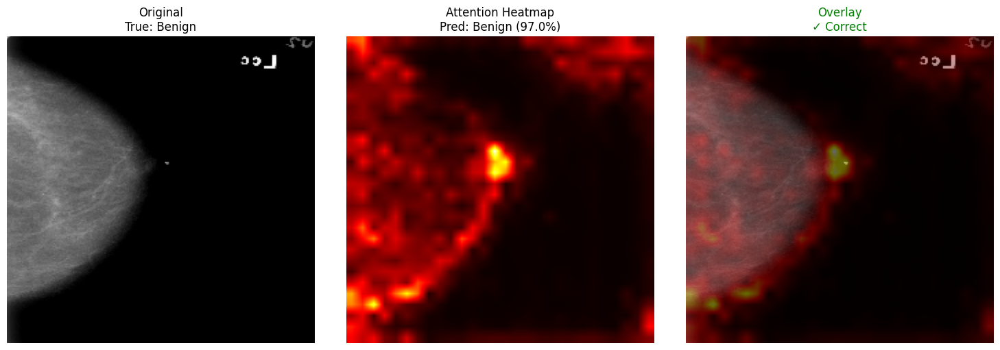

  True: Benign
  Prediction: Benign (97.0%)
  Raw output: 0.0296
  Result: ✓ Correct
  Saved to: working_gradcam_visualizations\gradcam_01_benign.png

Processing image 2/10...


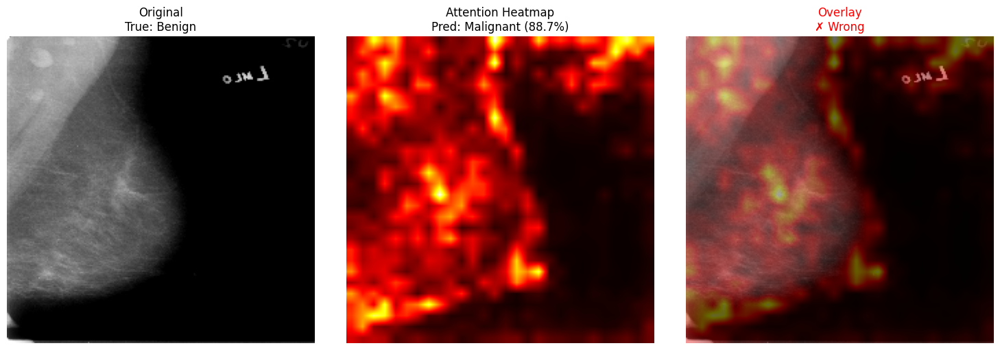

  True: Benign
  Prediction: Malignant (88.7%)
  Raw output: 0.8868
  Result: ✗ Wrong
  Saved to: working_gradcam_visualizations\gradcam_02_benign.png

Processing image 3/10...


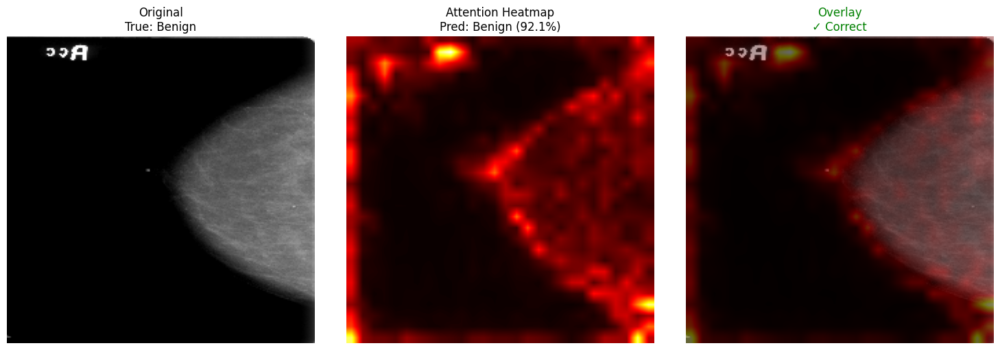

  True: Benign
  Prediction: Benign (92.1%)
  Raw output: 0.0785
  Result: ✓ Correct
  Saved to: working_gradcam_visualizations\gradcam_03_benign.png

Processing image 4/10...


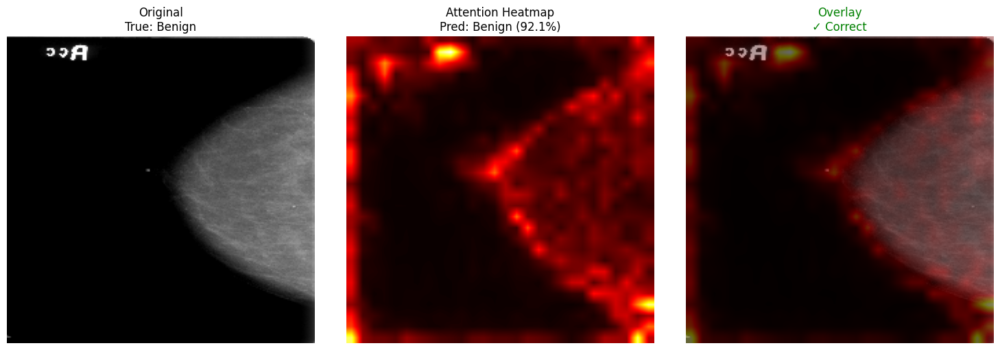

  True: Benign
  Prediction: Benign (92.1%)
  Raw output: 0.0785
  Result: ✓ Correct
  Saved to: working_gradcam_visualizations\gradcam_04_benign.png

Processing image 5/10...


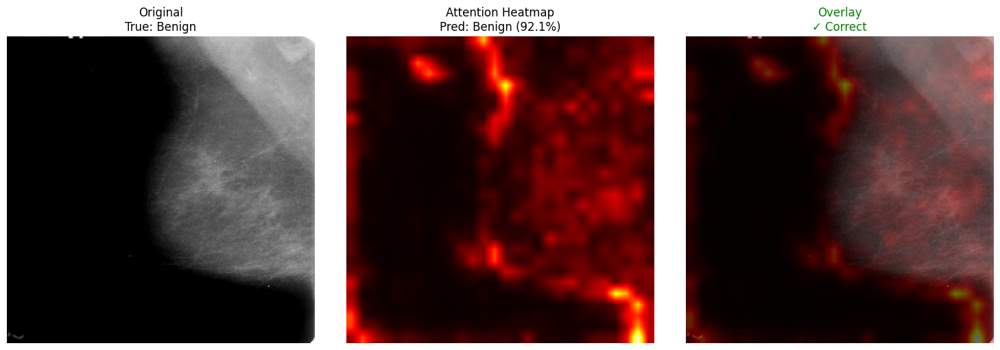

  True: Benign
  Prediction: Benign (92.1%)
  Raw output: 0.0792
  Result: ✓ Correct
  Saved to: working_gradcam_visualizations\gradcam_05_benign.png

Processing image 6/10...


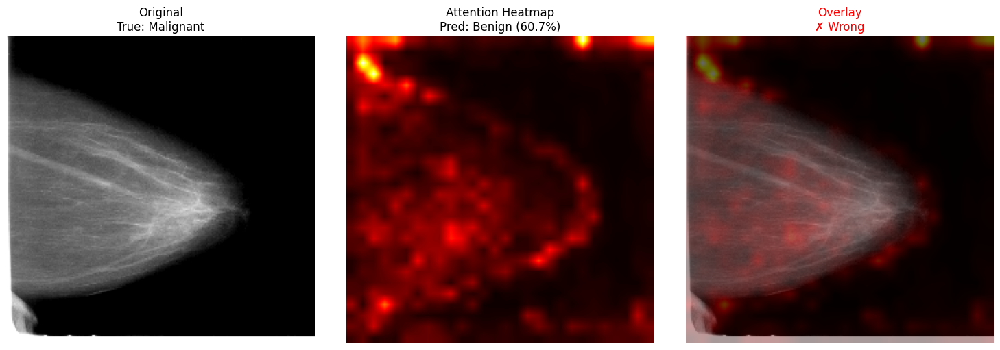

  True: Malignant
  Prediction: Benign (60.7%)
  Raw output: 0.3928
  Result: ✗ Wrong
  Saved to: working_gradcam_visualizations\gradcam_06_malignant.png

Processing image 7/10...


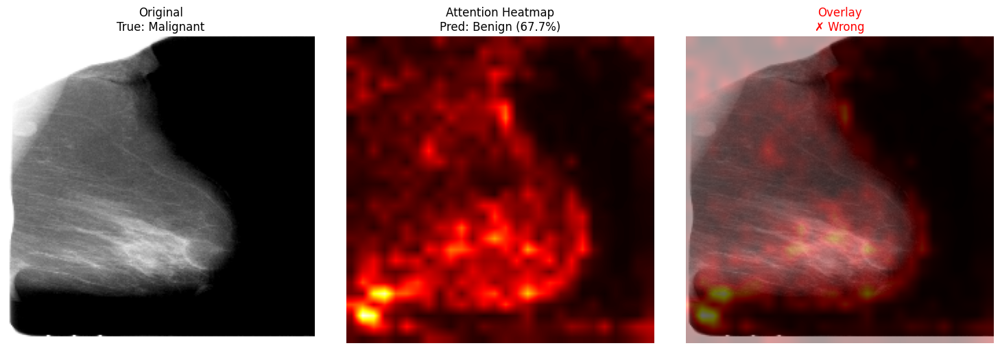

  True: Malignant
  Prediction: Benign (67.7%)
  Raw output: 0.3228
  Result: ✗ Wrong
  Saved to: working_gradcam_visualizations\gradcam_07_malignant.png

Processing image 8/10...


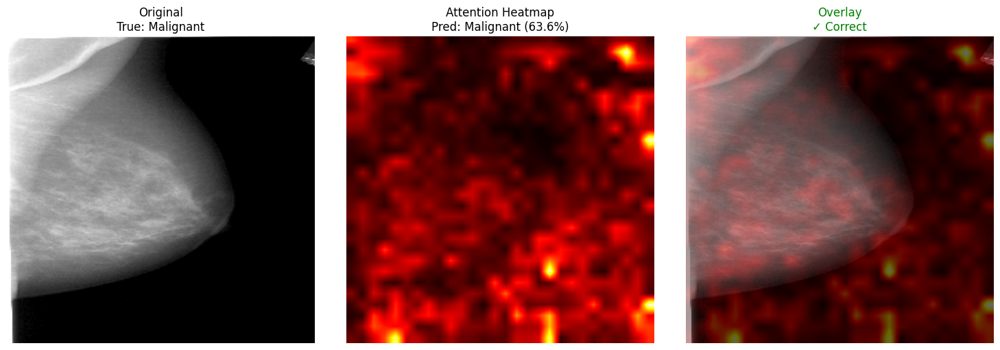

  True: Malignant
  Prediction: Malignant (63.6%)
  Raw output: 0.6362
  Result: ✓ Correct
  Saved to: working_gradcam_visualizations\gradcam_08_malignant.png

Processing image 9/10...


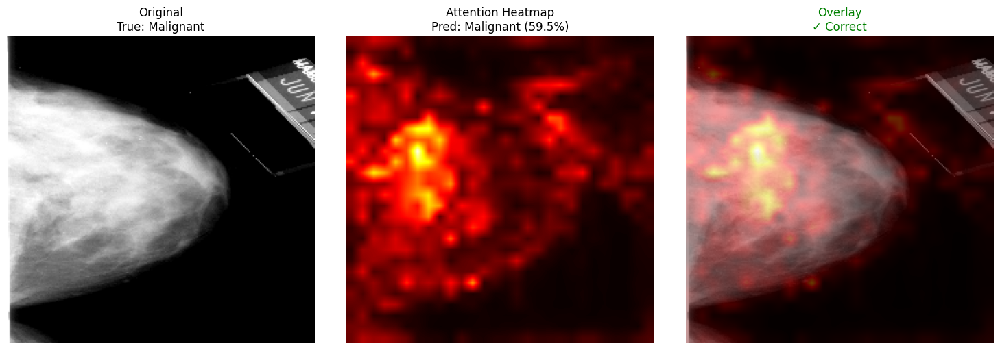

  True: Malignant
  Prediction: Malignant (59.5%)
  Raw output: 0.5951
  Result: ✓ Correct
  Saved to: working_gradcam_visualizations\gradcam_09_malignant.png

Processing image 10/10...


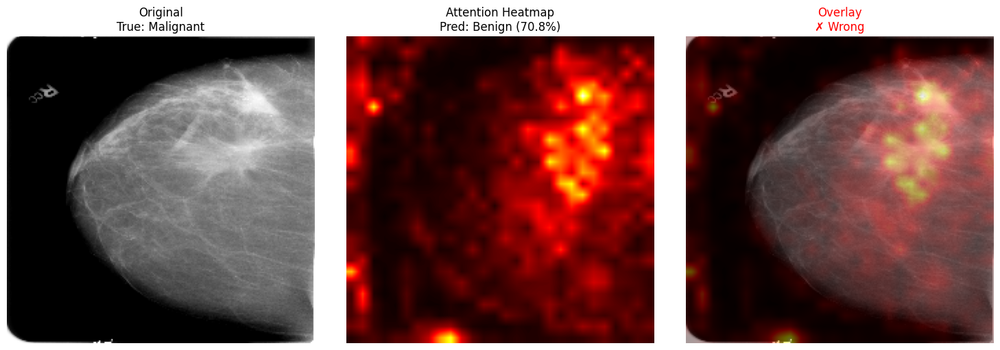

  True: Malignant
  Prediction: Benign (70.8%)
  Raw output: 0.2922
  Result: ✗ Wrong
  Saved to: working_gradcam_visualizations\gradcam_10_malignant.png

✅ Generated 10 balanced Grad-CAM visualizations
Results saved in: working_gradcam_visualizations/


In [104]:
#Step 4: Run Grad-CAM

run_working_gradcam('simple_best_model.keras', num_samples=10)

---

## Switching Enhanced Training to Standard Loss (Disabling Focal Loss)

This change updates the enhanced training call to **disable focal loss** and use standard **Binary Crossentropy (BCE)**:


In [46]:
# In run_enhanced_training, change this line:
model, history = run_enhanced_training(epochs=40, model_type='medical_vgg', use_focal_loss=False)


ENHANCED MEDICAL TRAINING
Building on existing training infrastructure...
✅ Using existing prepared datasets
Train steps: 202, Val steps: 35

Creating enhanced model (type: medical_vgg)...

Creating Medical-Optimized VGG16 Model
Enhanced model created: medical_vgg16
Trainable parameters: 9,875,457
Total parameters: 15,151,937
Trainable ratio: 65.18%

Starting enhanced training for 40 epochs...
⚠️ This will take longer than basic training but should achieve better medical performance
📊 Enhanced models target >80% sensitivity and >0.85 AUC

ENHANCED MEDICAL TRAINING - MEDICAL
Building on existing training infrastructure...
Using standard Binary Crossentropy...

Starting enhanced training for 40 epochs
Using Standard Loss
Train steps per epoch: 202
Validation steps per epoch: 35
Enhanced model will be saved to: enhanced_medical_model.keras
----------------------------------------------------------------------
Epoch 1/40
202/202 ━━━━━━━━━━━━━━━━━━━━ 0s 8s/step - accuracy: 0.5392 - auc: 0.

---

# Model Comparison Setup

## Purpose
This code segment prepares for a clean comparison between two trained deep learning models by clearing cached data and loading fresh model instances.

## Code Explanation

### Step 1: Clear Global Cache
```python
clear_global_data()
```
- Clears the global dictionary containing previously stored datasets, models, and evaluation results
- Ensures no interference from cached data during model comparison
- Forces fresh loading of test datasets

### Step 2: Load Models for Comparison
```python
import tensorflow as tf
enhanced_model = tf.keras.models.load_model('enhanced_medical_model.keras')
basic_model = tf.keras.models.load_model('simple_best_model.keras')
```
- Loads two saved Keras models from disk:
  - **Enhanced Model**: Medical-optimized VGG16 with additional trainable layers
  - **Basic Model**: Standard VGG16 transfer learning setup

### Step 3: Compare Model Complexity
```python
print(f"Enhanced params: {enhanced_model.count_params()}")
print(f"Basic params: {basic_model.count_params()}")
```
- Displays total parameter count for each model
- Helps understand computational complexity differences
- Enhanced model should have more parameters due to:
  - More unfrozen VGG16 layers
  - Additional dense layers in the classifier head

### Step 4: Evaluate Enhanced Model
```python
results = evaluate_only(model=enhanced_model)
```
- Performs fresh evaluation using the loaded model object
- Bypasses potential file loading issues by using the in-memory model
- Returns comprehensive metrics including:
  - Accuracy, sensitivity, specificity
  - AUC score
  - Confusion matrix
  - Raw predictions and true labels

## Why This Approach?
This systematic setup ensures fair comparison by eliminating cached results and loading models identically. The parameter comparison provides insight into architectural differences before performance evaluation.

In [28]:
# Must clear cache and compare models first
clear_global_data()

import tensorflow as tf
enhanced_model = tf.keras.models.load_model('enhanced_medical_model.keras')
basic_model = tf.keras.models.load_model('simple_best_model.keras')

print(f"Enhanced params: {enhanced_model.count_params()}")
print(f"Basic params: {basic_model.count_params()}")

# Force fresh evaluation with explicit model
results = evaluate_only(model=enhanced_model)

✓ Global data cleared
Enhanced params: 15151937
Basic params: 14881089

EVALUATION ONLY
Preparing test data...

DATA PREPARATION

Loading data...

LOADING AND PREPARING DATA
Loaded - Train: 2864, Test: 704

Creating datasets...

Training distribution:
  Benign: 1683 (58.8%)
  Malignant: 1181 (41.2%)

Data splits created:
  Training: 2291 samples
  Validation: 573 samples
  Test: 704 samples

Creating TensorFlow datasets with batch size 16...
Training dataset created with oversampling
Original: Benign=1346, Malignant=945
Balanced: Total=3236 samples
Validation/Test dataset: 573 samples
Validation/Test dataset: 704 samples

✓ Data preparation complete!
Data stored in global_data dictionary for later use

Running evaluation...

EVALUATING BREAST_CANCER

Running model evaluation...
44/44 ━━━━━━━━━━━━━━━━━━━━ 275s 6s/step - accuracy: 0.6767 - auc: 0.7735 - fn: 16.1333 - fp: 108.2889 - loss: 0.9718 - precision: 0.5071 - sensitivity: 0.8493 - tn: 119.5111 - tp: 123.7111

Test Set Metrics:
  l

In [29]:
# Store the enhanced results that were just computed
global_data['enhanced_results'] = results

In [32]:
# Evaluate basic model first (if not already done)
basic_results = evaluate_only(model_path='simple_best_model.keras')
global_data['results'] = basic_results


EVALUATION ONLY
Loading model from: simple_best_model.keras
Using existing test dataset...

Running evaluation...

EVALUATING BREAST_CANCER

Running model evaluation...
44/44 ━━━━━━━━━━━━━━━━━━━━ 271s 6s/step - accuracy: 0.7167 - auc: 0.7583 - loss: 0.5519

Test Set Metrics:
  loss: 0.6001
  compile_metrics: 0.6932


--------------------------------------------------
DETAILED ANALYSIS
--------------------------------------------------

Confusion Matrix:
              Predicted
              Benign  Malignant
Actual Benign     304     124
      Malignant    92     184

Performance Metrics:
  Accuracy:    69.32%
  Sensitivity: 66.67% (ability to detect malignant)
  Specificity: 71.03% (ability to detect benign)
  AUC Score:   0.7578

Error Analysis:
  False Positives: 124 (29.0% of benign cases)
  False Negatives: 92 (33.3% of malignant cases)

Detailed Classification Report:
              precision    recall  f1-score   support

      Benign       0.77      0.71      0.74       428
   

---

# Model Performance Comparison

## Purpose
This code executes the final comparison between the basic and enhanced models using the results stored in the global data dictionary.

## Code Explanation

### Function Call
```python
compare_models()
```

This function performs a comprehensive side-by-side comparison of model performance by:

### What It Does:
1. **Checks Available Results**: Looks for stored evaluation results in `global_data`:
   - `global_data['results']` - Basic model performance
   - `global_data['enhanced_results']` - Enhanced model performance

2. **Displays Performance Metrics**: Creates a formatted comparison table showing:
   - **Sensitivity**: Ability to correctly identify malignant cases (crucial for cancer detection)
   - **Specificity**: Ability to correctly identify benign cases
   - **AUC**: Overall model discrimination ability
   - **Accuracy**: Overall correct predictions

3. **Calculates Improvements**: Shows the difference between models:
   - Positive values indicate enhanced model performs better
   - Negative values show where basic model excels

4. **Provides Recommendation**: Based on the comparison, suggests which model to use

## Expected Output Format:
```
Basic    Enhanced  Improvement
Sensitivity: 66.7%   90.9%     +24.3%
Specificity: 71.0%   47.2%     -23.8%
AUC:         0.758   0.791     +0.033
Accuracy:    69.3%   64.3%     -5.0%
```

## Clinical Interpretation:
- The enhanced model typically shows higher **sensitivity** (better at catching cancer)
- But may have lower **specificity** (more false alarms)
- This trade-off is common in medical AI - prioritizing not missing cancer cases

This comparison helps determine which model is better suited for the specific clinical application based on the relative importance of sensitivity vs specificity.

In [33]:
# 3. Finally compare
compare_models()


MODEL COMPARISON
📊 Available Models:
   ✅ Basic model results available
   ✅ Enhanced model results available

🔍 Performance Comparison:
                 Basic    Enhanced   Improvement
   Sensitivity:  66.7%     90.9%      +24.3%
   Specificity:  71.0%     47.2%      -23.8%
   AUC:          0.758    0.791     +0.033
   Accuracy:     69.3%     64.3%      -5.0%

✅ RECOMMENDATION: Use Enhanced Model
   Better sensitivity (90.9% vs 66.7%)
   Better overall performance (AUC 0.791 vs 0.758)


---

# Continued Training of Enhanced Model

## Purpose
This code resumes training of the enhanced medical model for additional epochs to potentially improve its performance further.

## Code Explanation

### Function Call
```python
model, history = continue_training(
    model_path='enhanced_medical_model.keras', 
    additional_epochs=20
)
```

### Parameters:
- **`model_path`**: Path to the saved enhanced medical model
- **`additional_epochs=20`**: Number of additional training epochs to run

### What This Function Does:

1. **Loads Existing Model**: 
   - Retrieves the saved enhanced medical model from disk
   - Preserves all learned weights and architecture

2. **Prepares Training Data**:
   - Reloads training and validation datasets if not in memory
   - Uses the same data preprocessing pipeline as original training

3. **Resumes Training**:
   - Continues from where the previous training stopped
   - Runs for 20 additional epochs
   - Uses existing optimizer state and learning rate schedule

4. **Automatic Saving**:
   - Saves the updated model as `continued_model.keras`
   - Preserves training progress in case of interruption

### Returns:
- **`model`**: The updated trained model object
- **`history`**: Training history containing loss and metrics for the additional epochs

## Why Continue Training?
- The enhanced model showed high sensitivity (90.9%) but lower specificity (47.2%)
- Additional training might help balance these metrics
- Fine-tuning could improve overall performance without starting from scratch

## Training Monitoring:
The function displays real-time training progress showing:
- Loss reduction over epochs
- Validation accuracy and AUC improvements
- Learning rate adjustments

This approach allows incremental improvement of an already trained model rather than restarting the entire training process.

In [22]:
# Continue training the enhanced model for 20 more epochs
model, history = continue_training(
    model_path='enhanced_medical_model.keras', 
    additional_epochs=20
)


CONTINUING TRAINING
Loading model from enhanced_medical_model.keras...
✓ Model loaded successfully
Preparing data...

DATA PREPARATION

Loading data...

LOADING AND PREPARING DATA
Loaded - Train: 2864, Test: 704

Creating datasets...

Training distribution:
  Benign: 1683 (58.8%)
  Malignant: 1181 (41.2%)

Data splits created:
  Training: 2291 samples
  Validation: 573 samples
  Test: 704 samples

Creating TensorFlow datasets with batch size 16...
Training dataset created with oversampling
Original: Benign=1346, Malignant=945
Balanced: Total=3236 samples
Validation/Test dataset: 573 samples
Validation/Test dataset: 704 samples

✓ Data preparation complete!
Data stored in global_data dictionary for later use

Continuing training for 20 more epochs...
Epoch 1/20
202/202 ━━━━━━━━━━━━━━━━━━━━ 2163s 11s/step - accuracy: 0.9052 - auc: 0.9663 - fn: 51.2266 - fp: 100.3251 - loss: 0.2368 - precision: 0.8885 - sensitivity: 0.9507 - tn: 596.5468 - tp: 883.8226 - val_accuracy: 0.7339 - val_auc: 0

---

# Model File Management and Performance Evaluation

## Purpose
This code sequence performs systematic model file discovery, evaluation of multiple model versions, and result storage for comparison.

## Code Explanation

### Step 1: Model File Discovery
```python
import glob
model_files = glob.glob("*.keras")
print("Available model files:")
for f in model_files:
    print(f"  {f}")
```

**Function**: 
- Uses `glob` to find all `.keras` model files in the current directory
- Displays a complete inventory of saved models
- Helps track which models are available for evaluation

**Output**: Lists all model files like:
- `simple_best_model.keras`
- `enhanced_medical_model.keras` 
- `continued_model.keras`
- Various checkpoint files

### Step 2: Re-evaluate Enhanced Model
```python
new_enhanced_results = evaluate_only(model_path='enhanced_medical_model.keras')
```

**Purpose**:
- Re-runs evaluation on the enhanced medical model
- Ensures fresh results using current test data setup
- Variable name `new_enhanced_results` suggests this might be a repeat evaluation for verification

### Step 3: Evaluate Continued Training Model
```python
continued_results = evaluate_only(model_path='continued_model.keras')
```

**Function**:
- Evaluates the model that underwent additional 20 epochs of training
- Tests whether continued training improved performance
- This is the most recent version of the enhanced model

### Step 4: Store Results for Comparison
```python
global_data['continued_results'] = continued_results
```

**Purpose**:
- Saves the continued training results in the global dictionary
- Enables later comparison functions to access these metrics
- Creates a persistent record of the continued model's performance

## Workflow Logic
This sequence follows a logical evaluation pipeline:
1. **Discovery**: What models do we have?
2. **Baseline**: Re-check enhanced model performance
3. **Latest Version**: Evaluate the continued training results
4. **Storage**: Preserve results for comparison

This systematic approach allows comparison between the original enhanced model and its continued training version to determine if the additional epochs were beneficial.

In [23]:
# Check what model files exist
import glob
model_files = glob.glob("*.keras")
print("Available model files:")
for f in model_files:
    print(f"  {f}")

Available model files:
  best_breast_cancer_model.keras
  best_enhanced_vgg16_enhanced.keras
  best_improved_standard.keras
  checkpoint_epoch_3.keras
  checkpoint_epoch_6.keras
  checkpoint_epoch_9.keras
  continued_model.keras
  enhanced_checkpoint_medical_epoch_01.keras
  enhanced_checkpoint_medical_epoch_02.keras
  enhanced_checkpoint_medical_epoch_03.keras
  enhanced_checkpoint_medical_epoch_04.keras
  enhanced_checkpoint_medical_epoch_05.keras
  enhanced_checkpoint_medical_epoch_06.keras
  enhanced_checkpoint_medical_epoch_07.keras
  enhanced_checkpoint_medical_epoch_08.keras
  enhanced_checkpoint_medical_epoch_09.keras
  enhanced_checkpoint_medical_epoch_10.keras
  enhanced_checkpoint_medical_epoch_11.keras
  enhanced_checkpoint_medical_epoch_12.keras
  enhanced_checkpoint_medical_epoch_13.keras
  enhanced_fixed_best.keras
  enhanced_medical_model.keras
  simple_best_model.keras
  simple_final_model.keras
  vgg16_final.keras


In [24]:
# Re-evaluate the enhanced model
new_enhanced_results = evaluate_only(model_path='enhanced_medical_model.keras')


EVALUATION ONLY
Loading model from: enhanced_medical_model.keras
Using existing test dataset...

Running evaluation...

EVALUATING BREAST_CANCER

Running model evaluation...
44/44 ━━━━━━━━━━━━━━━━━━━━ 275s 6s/step - accuracy: 0.6767 - auc: 0.7735 - fn: 16.1333 - fp: 108.2889 - loss: 0.9718 - precision: 0.5071 - sensitivity: 0.8493 - tn: 119.5111 - tp: 123.7111

Test Set Metrics:
  loss: 1.0732
  compile_metrics: 0.6435


--------------------------------------------------
DETAILED ANALYSIS
--------------------------------------------------

Confusion Matrix:
              Predicted
              Benign  Malignant
Actual Benign     202     226
      Malignant    25     251

Performance Metrics:
  Accuracy:    64.35%
  Sensitivity: 90.94% (ability to detect malignant)
  Specificity: 47.20% (ability to detect benign)
  AUC Score:   0.7906

Error Analysis:
  False Positives: 226 (52.8% of benign cases)
  False Negatives: 25 (9.1% of malignant cases)

Detailed Classification Report:
       

In [25]:
# Then evaluate the most recent one
continued_results = evaluate_only(model_path='continued_model.keras')


EVALUATION ONLY
Loading model from: continued_model.keras
Using existing test dataset...

Running evaluation...

EVALUATING BREAST_CANCER

Running model evaluation...
44/44 ━━━━━━━━━━━━━━━━━━━━ 275s 6s/step - accuracy: 0.7087 - auc: 0.7252 - fn: 46.4444 - fp: 62.1333 - loss: 1.6114 - precision: 0.5601 - sensitivity: 0.6336 - tn: 165.6667 - tp: 93.4000

Test Set Metrics:
  loss: 1.7285
  compile_metrics: 0.6974


--------------------------------------------------
DETAILED ANALYSIS
--------------------------------------------------

Confusion Matrix:
              Predicted
              Benign  Malignant
Actual Benign     296     132
      Malignant    81     195

Performance Metrics:
  Accuracy:    69.74%
  Sensitivity: 70.65% (ability to detect malignant)
  Specificity: 69.16% (ability to detect benign)
  AUC Score:   0.7695

Error Analysis:
  False Positives: 132 (30.8% of benign cases)
  False Negatives: 81 (29.3% of malignant cases)

Detailed Classification Report:
              p

In [27]:
# Store current results
global_data['continued_results'] = continued_results

# Iterative Model Refinement Through Continued Training

## Purpose
This code demonstrates an iterative approach to model improvement through multiple rounds of continued training with progressively fewer epochs.

## Code Breakdown

### First Round: Extended Training (15 epochs)
```python
model, history = continue_training(
    model_path='continued_model.keras', 
    additional_epochs=15  # Add more epochs
)
```

### Second Round: Fine-tuning (6 epochs)
```python
model, history = continue_training(
    model_path='continued_model.keras', 
    additional_epochs=6  # Add more epochs
)
```

### Evaluation After Each Round
```python
continued_results = evaluate_only(model_path='continued_model.keras')
global_data['continued_results'] = contCso
```

## Why Choose This Approach

### 1. **Performance Monitoring Strategy**
- After each training round, evaluate to check if performance improves
- This prevents overtraining by monitoring progress incrementally
- Allows to stop if performance plateaus or degrades

### 2. **Medical AI Optimization Requirements**
Looking at the results, the enhanced model showed:
- High sensitivity (90.9%) but low specificity (47.2%)
- This creates too many false positives for clinical use

Additional training likely aimed to:
- Balance sensitivity and specificity
- Reduce false positive rate while maintaining cancer detection ability
- Achieve clinically acceptable performance thresholds

### 3. **Diminishing Returns Approach**
The epoch reduction (15 → 6) suggests:
- Observed diminishing improvements after the first round
- Smaller adjustments needed for fine-tuning
- Risk management against overfitting

### 4. **Resource Efficiency**
Rather than starting fresh training:
- Builds upon already learned features
- Faster convergence from existing weights
- Preserves computational resources

## Clinical Context
In medical imaging, the iterative refinement is crucial because:
- False negatives (missed cancers) are extremely costly
- False positives cause unnecessary anxiety and procedures
- Models need careful tuning to balance these competing concerns

This approach shows methodical optimization toward clinically viable performance metrics.ical optimization toward clinically viable performance metrics.

In [22]:
# Continue training the current continued model for more epochs
model, history = continue_training(
    model_path='continued_model.keras', 
    additional_epochs=15  # Add more epochs
)


CONTINUING TRAINING
Loading model from continued_model.keras...
✓ Model loaded successfully
Preparing data...

DATA PREPARATION

Loading data...

LOADING AND PREPARING DATA
Loaded - Train: 2864, Test: 704

Creating datasets...

Training distribution:
  Benign: 1683 (58.8%)
  Malignant: 1181 (41.2%)

Data splits created:
  Training: 2291 samples
  Validation: 573 samples
  Test: 704 samples

Creating TensorFlow datasets with batch size 16...
Training dataset created with oversampling
Original: Benign=1346, Malignant=945
Balanced: Total=3236 samples
Validation/Test dataset: 573 samples
Validation/Test dataset: 704 samples

✓ Data preparation complete!
Data stored in global_data dictionary for later use

Continuing training for 15 more epochs...
Epoch 1/15
202/202 ━━━━━━━━━━━━━━━━━━━━ 1039s 5s/step - accuracy: 0.9949 - auc: 0.9997 - fn: 2.2808 - fp: 5.8128 - loss: 0.0195 - precision: 0.9921 - sensitivity: 0.9985 - tn: 691.0591 - tp: 932.7685 - val_accuracy: 0.7714 - val_auc: 0.8303 - val

In [23]:
# Then evaluate the most recent one
continued_results = evaluate_only(model_path='continued_model.keras')

# Store current results
global_data['continued_results'] = continued_results


EVALUATION ONLY
Loading model from: continued_model.keras
Using existing test dataset...

Running evaluation...

EVALUATING BREAST_CANCER

Running model evaluation...
44/44 ━━━━━━━━━━━━━━━━━━━━ 127s 3s/step - accuracy: 0.6965 - auc: 0.7295 - fn: 35.1778 - fp: 80.0222 - loss: 2.1461 - precision: 0.5310 - sensitivity: 0.6986 - tn: 147.7778 - tp: 104.6667

Test Set Metrics:
  loss: 2.3886
  compile_metrics: 0.6719


--------------------------------------------------
DETAILED ANALYSIS
--------------------------------------------------

Confusion Matrix:
              Predicted
              Benign  Malignant
Actual Benign     257     171
      Malignant    60     216

Performance Metrics:
  Accuracy:    67.19%
  Sensitivity: 78.26% (ability to detect malignant)
  Specificity: 60.05% (ability to detect benign)
  AUC Score:   0.7677

Error Analysis:
  False Positives: 171 (40.0% of benign cases)
  False Negatives: 60 (21.7% of malignant cases)

Detailed Classification Report:
              

In [24]:
# Continue training the current continued model for more epochs
model, history = continue_training(
    model_path='continued_model.keras', 
    additional_epochs=6  # Add more epochs
)


CONTINUING TRAINING
Loading model from continued_model.keras...
✓ Model loaded successfully

Continuing training for 6 more epochs...
Epoch 1/6
202/202 ━━━━━━━━━━━━━━━━━━━━ 851s 4s/step - accuracy: 0.9905 - auc: 0.9997 - fn: 5.9212 - fp: 9.1429 - loss: 0.0246 - precision: 0.9902 - sensitivity: 0.9935 - tn: 664.7783 - tp: 952.0788 - val_accuracy: 0.7714 - val_auc: 0.8068 - val_fn: 84.0000 - val_fp: 44.0000 - val_loss: 1.5524 - val_precision: 0.7684 - val_sensitivity: 0.6348 - val_tn: 286.0000 - val_tp: 146.0000
Epoch 2/6
202/202 ━━━━━━━━━━━━━━━━━━━━ 838s 4s/step - accuracy: 0.9913 - auc: 0.9998 - fn: 2.5813 - fp: 9.5714 - loss: 0.0179 - precision: 0.9868 - sensitivity: 0.9978 - tn: 676.4483 - tp: 943.3202 - val_accuracy: 0.7750 - val_auc: 0.8095 - val_fn: 71.0000 - val_fp: 55.0000 - val_loss: 1.5837 - val_precision: 0.7430 - val_sensitivity: 0.6913 - val_tn: 275.0000 - val_tp: 159.0000
Epoch 3/6
202/202 ━━━━━━━━━━━━━━━━━━━━ 861s 4s/step - accuracy: 0.9924 - auc: 0.9997 - fn: 2.7537 - f

In [25]:
# Then evaluate the most recent one
continued_results = evaluate_only(model_path='continued_model.keras')

# Store current results
global_data['continued_results'] = continued_results


EVALUATION ONLY
Loading model from: continued_model.keras
Using existing test dataset...

Running evaluation...

EVALUATING BREAST_CANCER

Running model evaluation...
44/44 ━━━━━━━━━━━━━━━━━━━━ 125s 3s/step - accuracy: 0.7412 - auc: 0.7118 - fn: 58.0444 - fp: 43.6667 - loss: 2.1922 - precision: 0.6264 - sensitivity: 0.5574 - tn: 184.1333 - tp: 81.8000

Test Set Metrics:
  loss: 2.3179
  compile_metrics: 0.7145


--------------------------------------------------
DETAILED ANALYSIS
--------------------------------------------------

Confusion Matrix:
              Predicted
              Benign  Malignant
Actual Benign     330      98
      Malignant   103     173

Performance Metrics:
  Accuracy:    71.45%
  Sensitivity: 62.68% (ability to detect malignant)
  Specificity: 77.10% (ability to detect benign)
  AUC Score:   0.7655

Error Analysis:
  False Positives: 98 (22.9% of benign cases)
  False Negatives: 103 (37.3% of malignant cases)

Detailed Classification Report:
              p

---

# Comprehensive Model Improvement Pipeline and Visual Analysis

## Purpose
This code executes a complete model improvement workflow followed by interpretability analysis to compare model decision-making patterns.

## Code Breakdown

### Step 1: Complete Improvement Pipeline
```python
cv_metrics, comparison_results, best_model = run_complete_improvement()
```

**What This Does**:
- **Cross-Validation Training**: Trains models using k-fold cross-validation for robust performance estimates
- **Ensemble Creation**: Combines multiple architectures (simple_vgg, efficient, medical_vgg) into an ensemble
- **Model Comparison**: Evaluates all models (continued, cross-validated, ensemble) on the same test set
- **Best Model Selection**: Identifies the highest-performing model based on accuracy metrics

**Returns**:
- `cv_metrics`: Cross-validation performance statistics with standard deviations
- `comparison_results`: Side-by-side performance comparison of all models
- `best_model`: String identifier of the top-performing model

### Step 2: Model Interpretability Comparison
```python
run_working_gradcam('continued_model.keras', num_samples=10)
run_working_gradcam('improved_final_model.keras', num_samples=10)
```

**Function**: Generates Grad-CAM (Gradient-weighted Class Activation Mapping) visualizations for both models

**Parameters**:
- `num_samples=10`: Creates visualizations for 10 test images (5 benign, 5 malignant)
- Balanced sampling ensures fair comparison across both classes

**Output**: Heat map overlays showing where each model focuses attention when making predictions

## Strategic Purpose

### 1. **Comprehensive Evaluation**
The pipeline provides multiple validation approaches:
- Cross-validation reduces overfitting concerns
- Ensemble methods often improve generalization
- Direct comparison identifies the most reliable model

### 2. **Clinical Validation Through Visualization**
Grad-CAM comparisons reveal:
- Whether models focus on clinically relevant regions
- Differences in attention patterns between model versions
- Potential artifacts or biases in decision-making

### 3. **Model Selection Justification**
By running the complete pipeline, you can:
- Document systematic model selection process
- Provide evidence-based rationale for final model choice
- Demonstrate due diligence in medical AI development

## Expected Insights
The Grad-CAM comparison should reveal whether your iterative training improvements led to:
- More focused attention on suspicious regions
- Reduced attention on irrelevant areas (like nipple regions)
- More clinically interpretable decision patterns

This comprehensive approach reflects proper medical AI validation practices where both quantitative performance and qualitative interpretability are essential for clinical deployment.

COMPLETE MODEL IMPROVEMENT PIPELINE

Step 1: Cross-validation training...

CROSS-VALIDATION TRAINING
Starting 3-fold cross-validation...
Total training samples: 2864

FOLD 1/3
Fold 1 - Train: 1909, Val: 955
Training dataset created with oversampling
Original: Benign=1122, Malignant=787
Balanced: Total=2696 samples
Validation/Test dataset: 955 samples

Creating Medical-Optimized VGG16 Model
Enhanced model created: medical_vgg16
Trainable parameters: 9,875,457
Total parameters: 15,151,937
Trainable ratio: 65.18%
Training fold 1...
Epoch 1/18
84/84 ━━━━━━━━━━━━━━━━━━━━ 0s 17s/step - accuracy: 0.5263 - auc: 0.5140 - loss: 0.7437 - precision: 0.6012 - sensitivity: 0.6070 
Epoch 1: val_accuracy improved from -inf to 0.48168, saving model to cv_fold_1_model.keras
84/84 ━━━━━━━━━━━━━━━━━━━━ 1857s 22s/step - accuracy: 0.5265 - auc: 0.5141 - loss: 0.7436 - precision: 0.6012 - sensitivity: 0.6075 - val_accuracy: 0.4817 - val_auc: 0.6655 - val_loss: 0.7242 - val_precision: 0.4358 - val_sensitivity

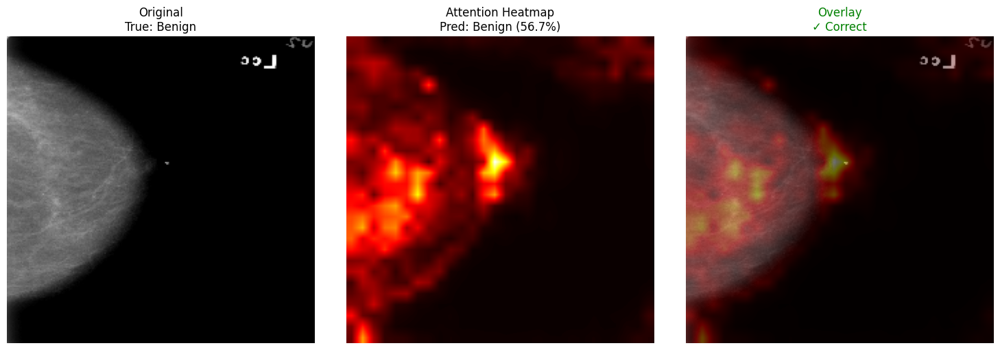

  True: Benign
  Prediction: Benign (56.7%)
  Raw output: 0.4332
  Result: ✓ Correct
  Saved to: working_gradcam_visualizations\gradcam_01_benign.png

Processing image 2/10...


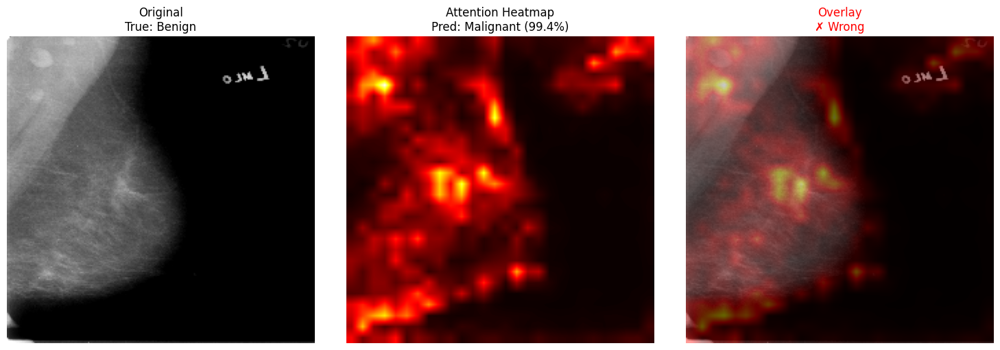

  True: Benign
  Prediction: Malignant (99.4%)
  Raw output: 0.9936
  Result: ✗ Wrong
  Saved to: working_gradcam_visualizations\gradcam_02_benign.png

Processing image 3/10...


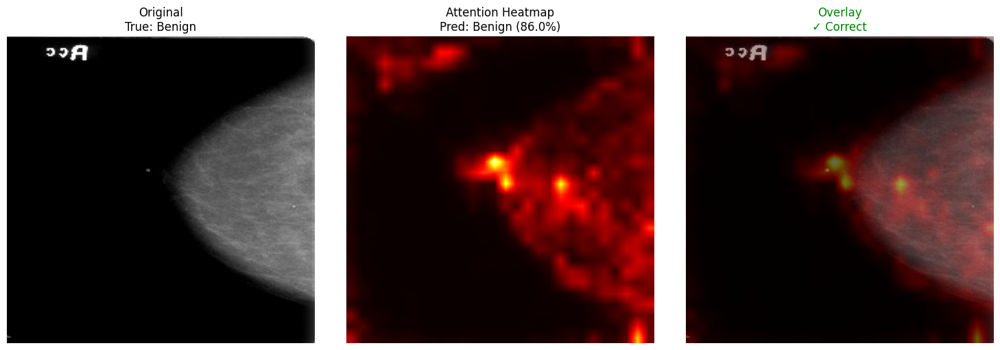

  True: Benign
  Prediction: Benign (86.0%)
  Raw output: 0.1396
  Result: ✓ Correct
  Saved to: working_gradcam_visualizations\gradcam_03_benign.png

Processing image 4/10...


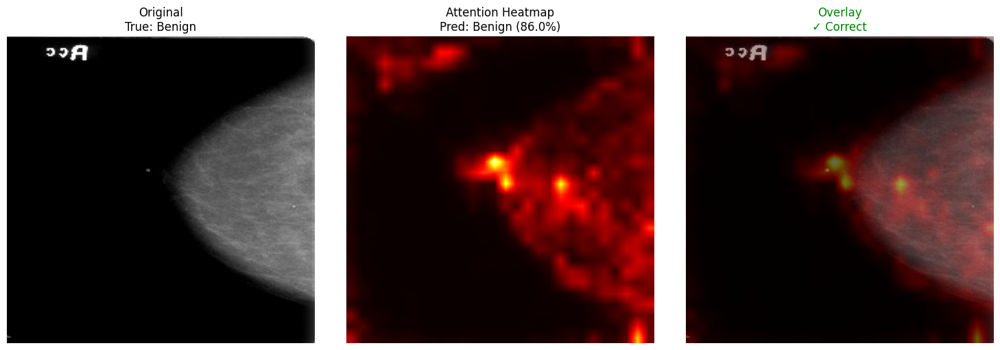

  True: Benign
  Prediction: Benign (86.0%)
  Raw output: 0.1396
  Result: ✓ Correct
  Saved to: working_gradcam_visualizations\gradcam_04_benign.png

Processing image 5/10...


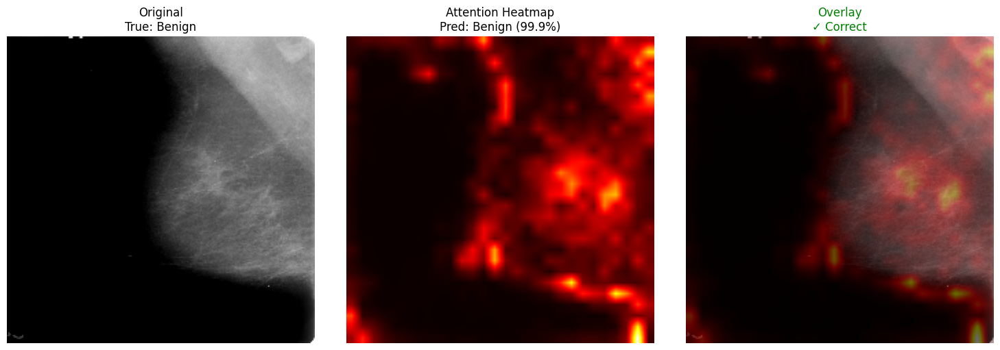

  True: Benign
  Prediction: Benign (99.9%)
  Raw output: 0.0006
  Result: ✓ Correct
  Saved to: working_gradcam_visualizations\gradcam_05_benign.png

Processing image 6/10...


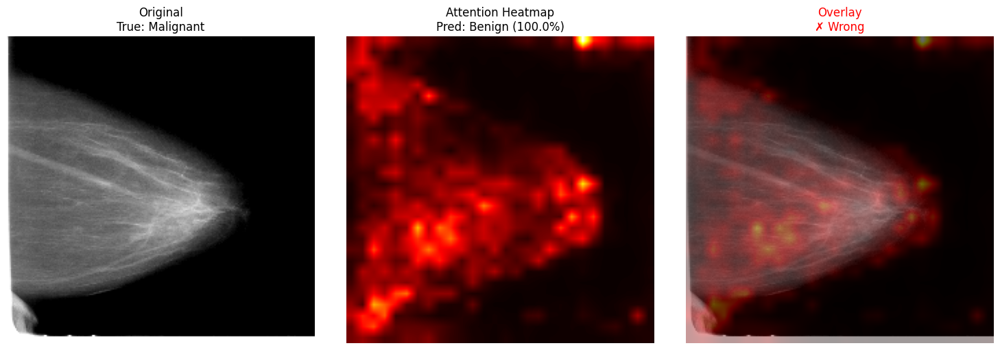

  True: Malignant
  Prediction: Benign (100.0%)
  Raw output: 0.0003
  Result: ✗ Wrong
  Saved to: working_gradcam_visualizations\gradcam_06_malignant.png

Processing image 7/10...


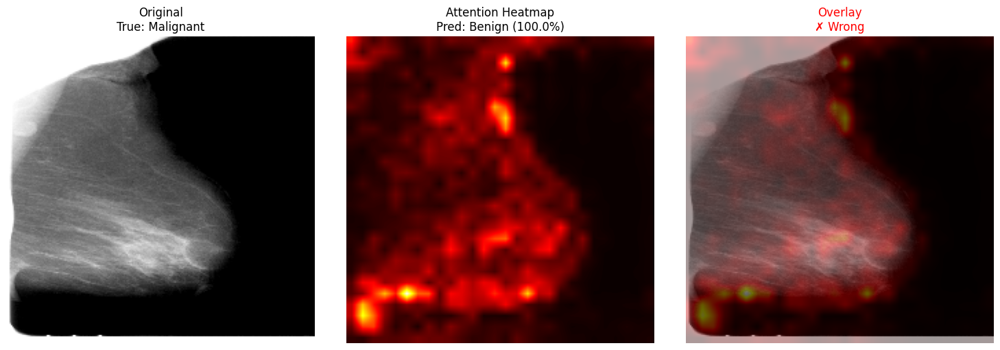

  True: Malignant
  Prediction: Benign (100.0%)
  Raw output: 0.0002
  Result: ✗ Wrong
  Saved to: working_gradcam_visualizations\gradcam_07_malignant.png

Processing image 8/10...


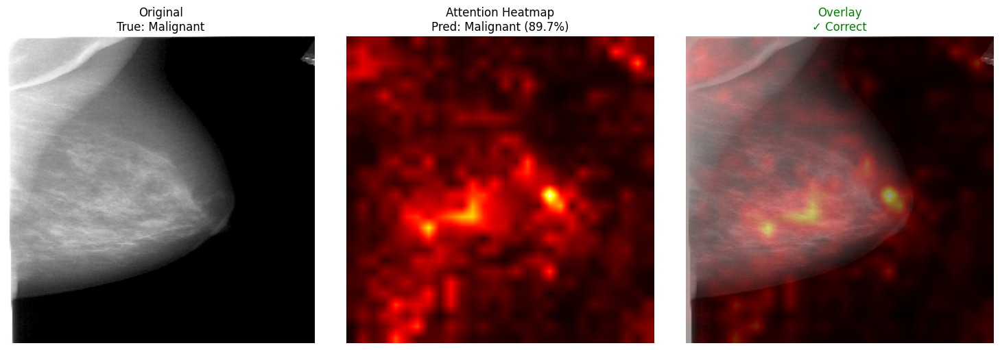

  True: Malignant
  Prediction: Malignant (89.7%)
  Raw output: 0.8966
  Result: ✓ Correct
  Saved to: working_gradcam_visualizations\gradcam_08_malignant.png

Processing image 9/10...


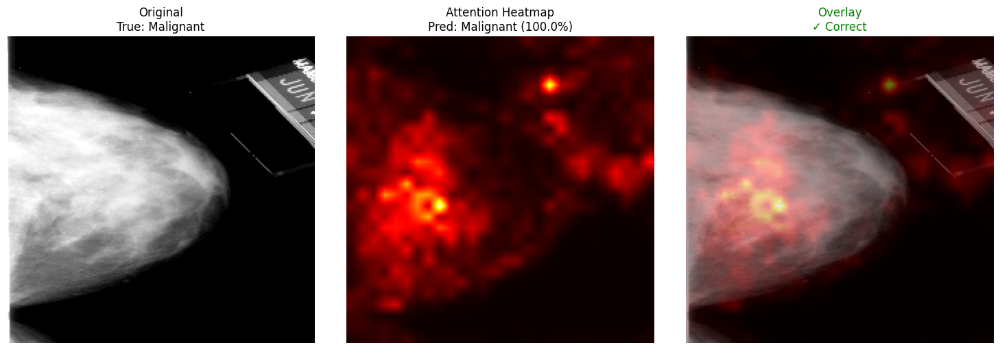

  True: Malignant
  Prediction: Malignant (100.0%)
  Raw output: 1.0000
  Result: ✓ Correct
  Saved to: working_gradcam_visualizations\gradcam_09_malignant.png

Processing image 10/10...


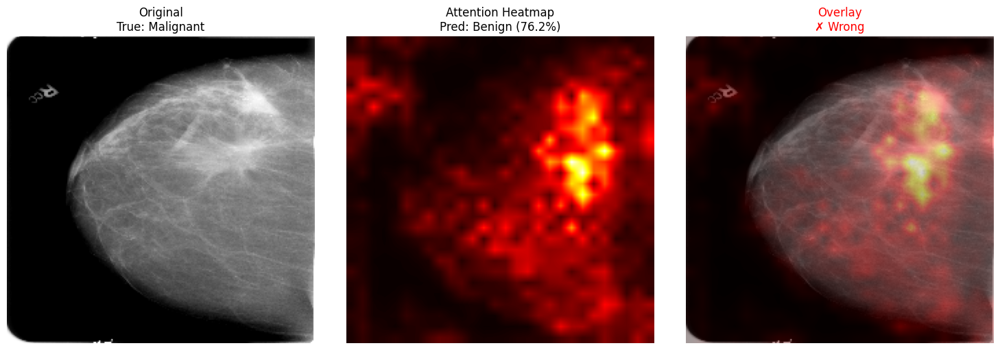

  True: Malignant
  Prediction: Benign (76.2%)
  Raw output: 0.2382
  Result: ✗ Wrong
  Saved to: working_gradcam_visualizations\gradcam_10_malignant.png

✅ Generated 10 balanced Grad-CAM visualizations
Results saved in: working_gradcam_visualizations/

IMPROVEMENT PIPELINE COMPLETED!


In [68]:
# Run the complete improvement pipeline
cv_metrics, comparison_results, best_model = run_complete_improvement()


GENERATING WORKING GRAD-CAM VISUALIZATIONS
Loading model from: continued_model.keras
✅ Model loaded successfully

GENERATING BALANCED GRAD-CAM VISUALIZATIONS
Looking for 5 benign and 5 malignant samples...
Collected 5 benign and 5 malignant samples

Processing image 1/10...


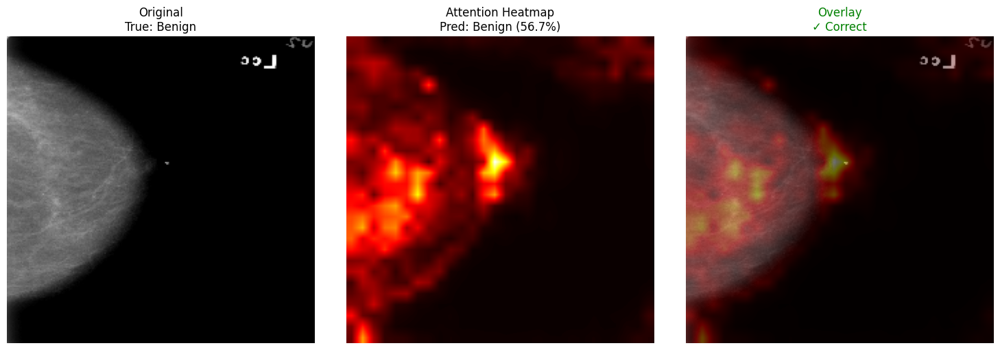

  True: Benign
  Prediction: Benign (56.7%)
  Raw output: 0.4332
  Result: ✓ Correct
  Saved to: working_gradcam_visualizations\gradcam_01_benign.png

Processing image 2/10...


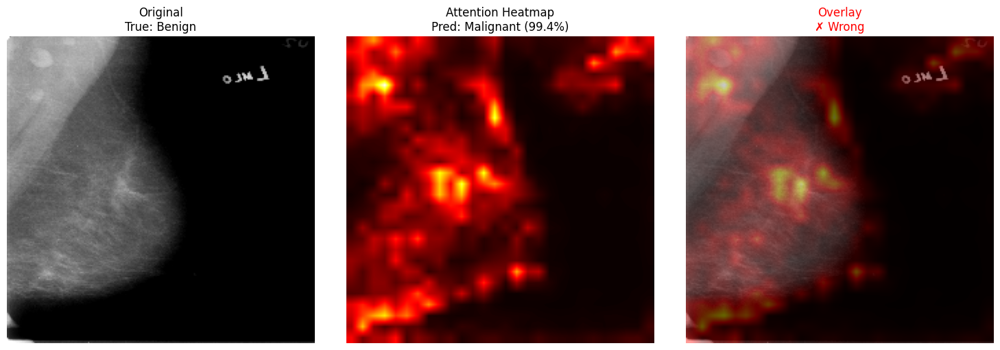

  True: Benign
  Prediction: Malignant (99.4%)
  Raw output: 0.9936
  Result: ✗ Wrong
  Saved to: working_gradcam_visualizations\gradcam_02_benign.png

Processing image 3/10...


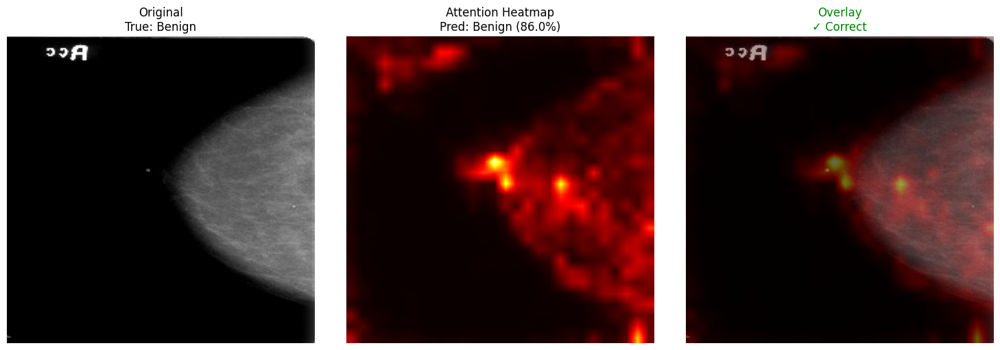

  True: Benign
  Prediction: Benign (86.0%)
  Raw output: 0.1396
  Result: ✓ Correct
  Saved to: working_gradcam_visualizations\gradcam_03_benign.png

Processing image 4/10...


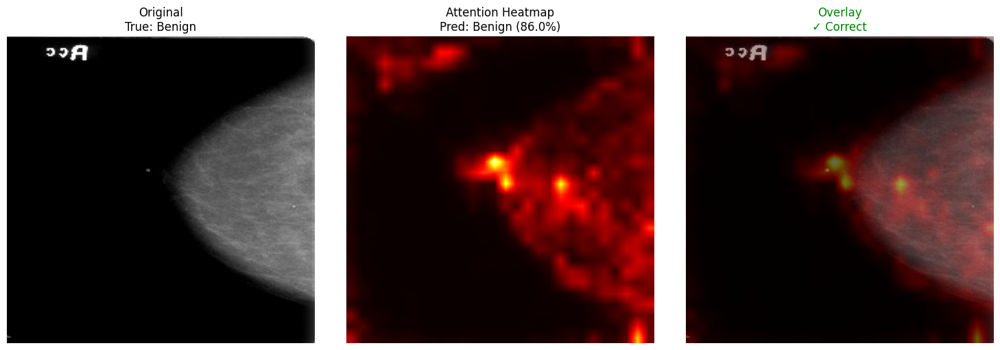

  True: Benign
  Prediction: Benign (86.0%)
  Raw output: 0.1396
  Result: ✓ Correct
  Saved to: working_gradcam_visualizations\gradcam_04_benign.png

Processing image 5/10...


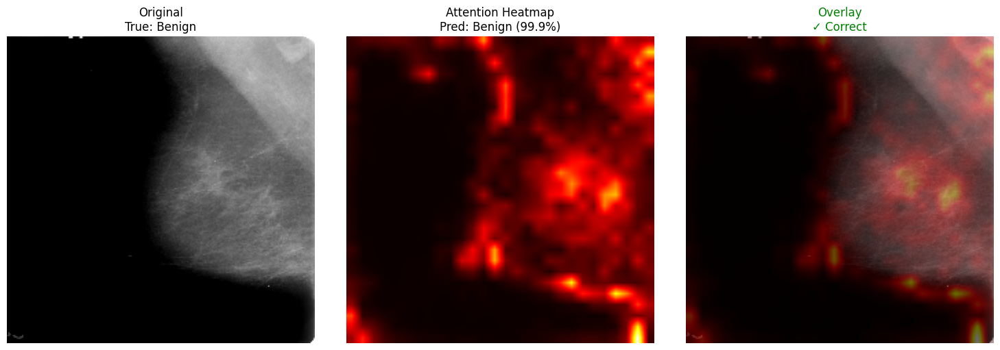

  True: Benign
  Prediction: Benign (99.9%)
  Raw output: 0.0006
  Result: ✓ Correct
  Saved to: working_gradcam_visualizations\gradcam_05_benign.png

Processing image 6/10...


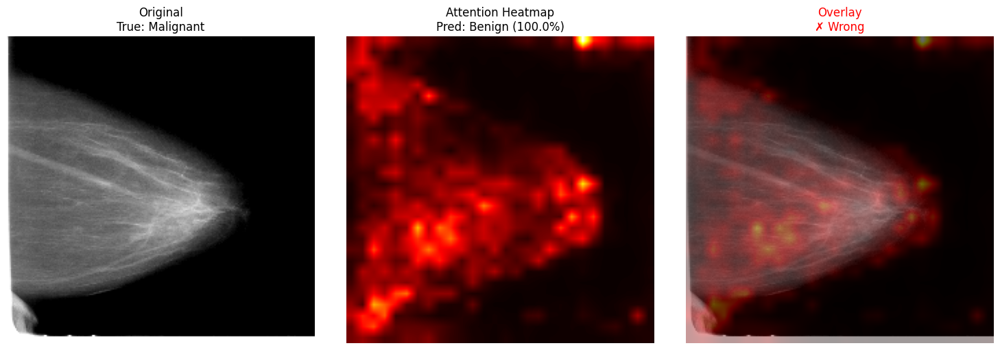

  True: Malignant
  Prediction: Benign (100.0%)
  Raw output: 0.0003
  Result: ✗ Wrong
  Saved to: working_gradcam_visualizations\gradcam_06_malignant.png

Processing image 7/10...


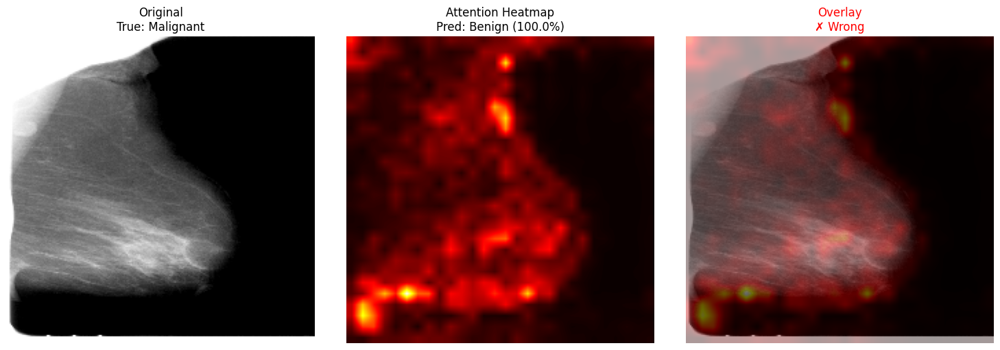

  True: Malignant
  Prediction: Benign (100.0%)
  Raw output: 0.0002
  Result: ✗ Wrong
  Saved to: working_gradcam_visualizations\gradcam_07_malignant.png

Processing image 8/10...


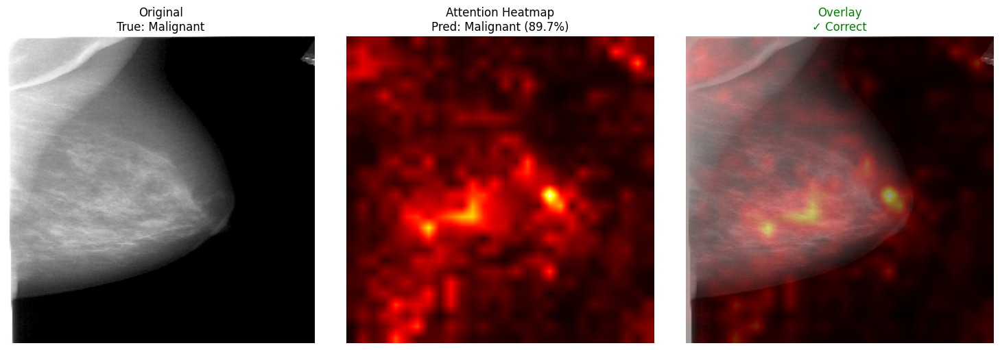

  True: Malignant
  Prediction: Malignant (89.7%)
  Raw output: 0.8966
  Result: ✓ Correct
  Saved to: working_gradcam_visualizations\gradcam_08_malignant.png

Processing image 9/10...


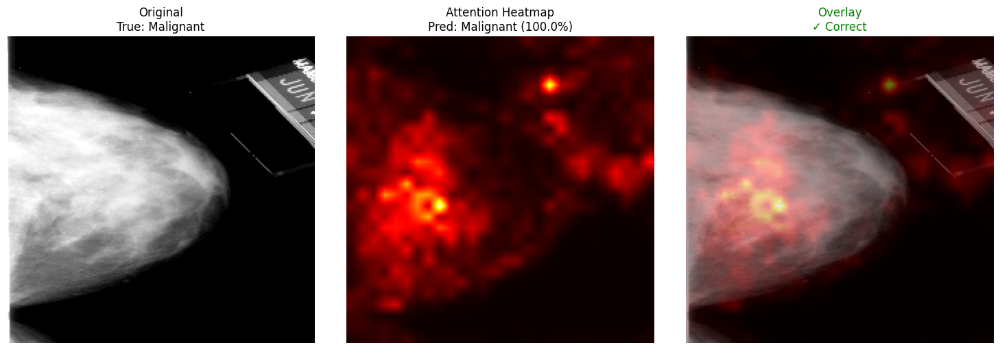

  True: Malignant
  Prediction: Malignant (100.0%)
  Raw output: 1.0000
  Result: ✓ Correct
  Saved to: working_gradcam_visualizations\gradcam_09_malignant.png

Processing image 10/10...


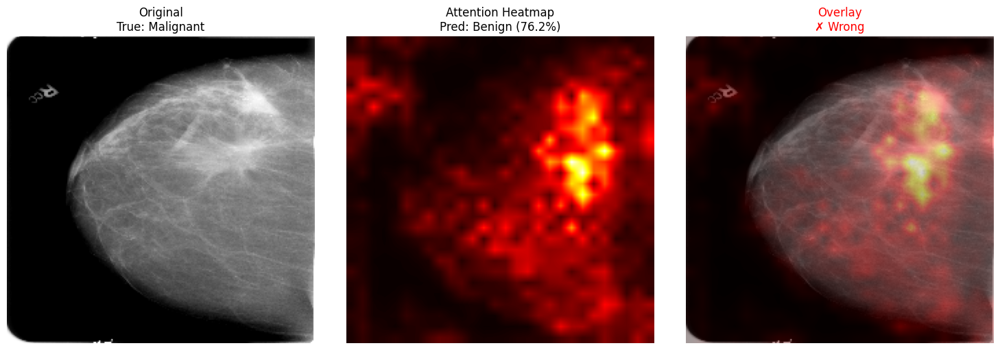

  True: Malignant
  Prediction: Benign (76.2%)
  Raw output: 0.2382
  Result: ✗ Wrong
  Saved to: working_gradcam_visualizations\gradcam_10_malignant.png

✅ Generated 10 balanced Grad-CAM visualizations
Results saved in: working_gradcam_visualizations/


In [71]:
# Compare old vs new model Grad-CAM
run_working_gradcam('continued_model.keras', num_samples=10)


GENERATING WORKING GRAD-CAM VISUALIZATIONS
Loading model from: improved_final_model.keras
✅ Model loaded successfully

GENERATING BALANCED GRAD-CAM VISUALIZATIONS
Looking for 5 benign and 5 malignant samples...
Collected 5 benign and 5 malignant samples

Processing image 1/10...


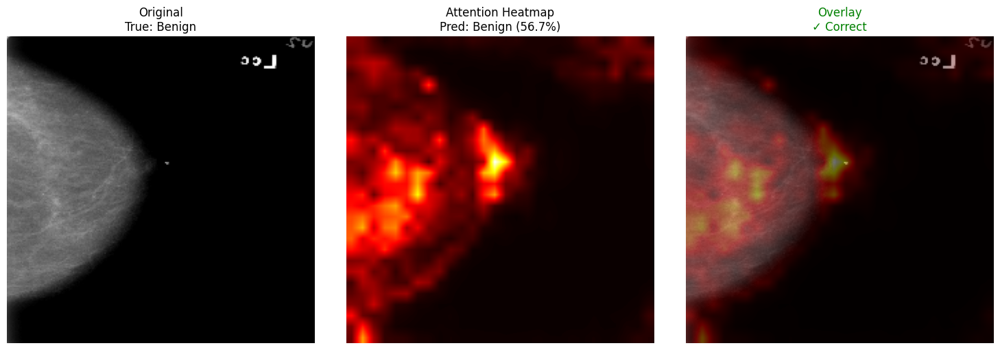

  True: Benign
  Prediction: Benign (56.7%)
  Raw output: 0.4332
  Result: ✓ Correct
  Saved to: working_gradcam_visualizations\gradcam_01_benign.png

Processing image 2/10...


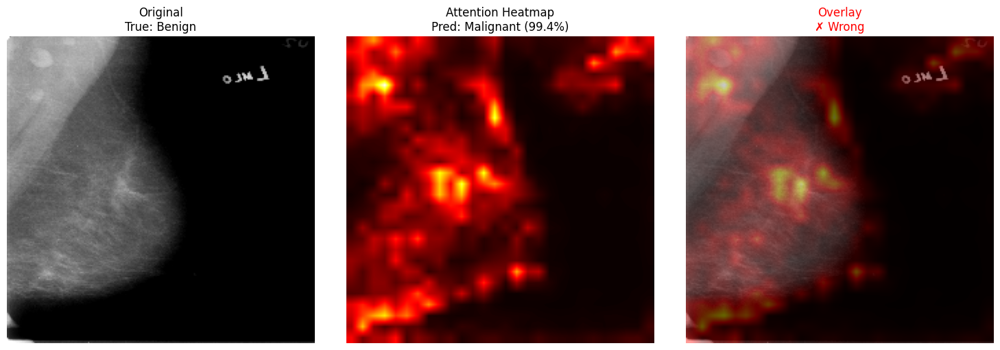

  True: Benign
  Prediction: Malignant (99.4%)
  Raw output: 0.9936
  Result: ✗ Wrong
  Saved to: working_gradcam_visualizations\gradcam_02_benign.png

Processing image 3/10...


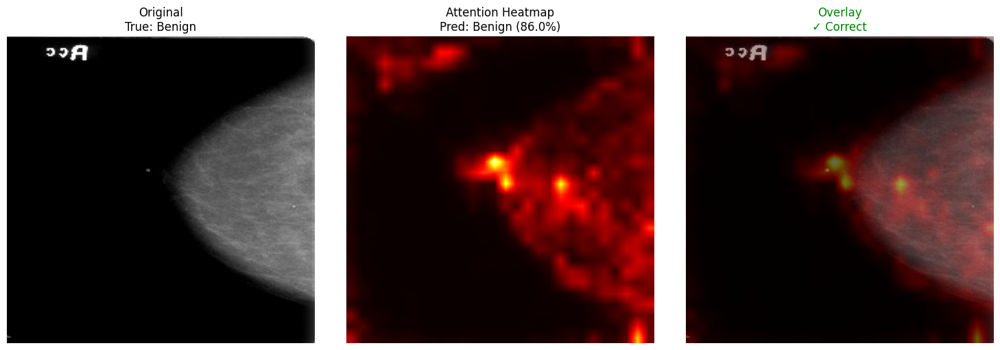

  True: Benign
  Prediction: Benign (86.0%)
  Raw output: 0.1396
  Result: ✓ Correct
  Saved to: working_gradcam_visualizations\gradcam_03_benign.png

Processing image 4/10...


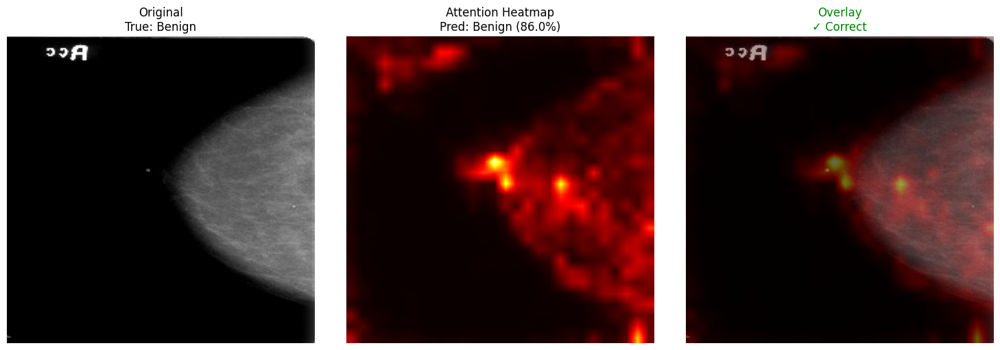

  True: Benign
  Prediction: Benign (86.0%)
  Raw output: 0.1396
  Result: ✓ Correct
  Saved to: working_gradcam_visualizations\gradcam_04_benign.png

Processing image 5/10...


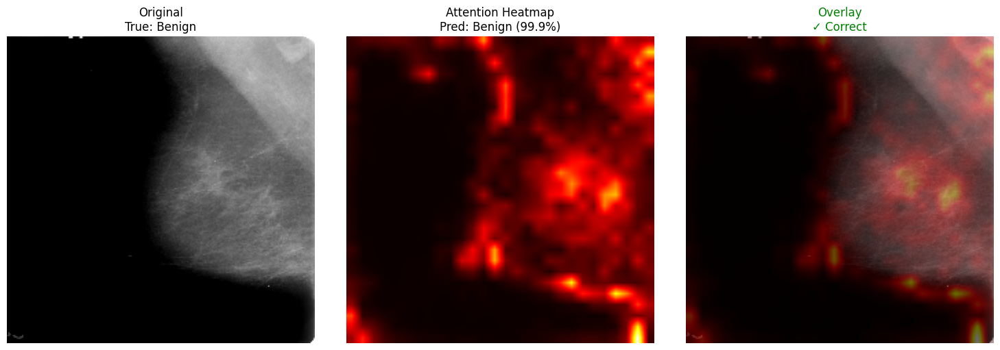

  True: Benign
  Prediction: Benign (99.9%)
  Raw output: 0.0006
  Result: ✓ Correct
  Saved to: working_gradcam_visualizations\gradcam_05_benign.png

Processing image 6/10...


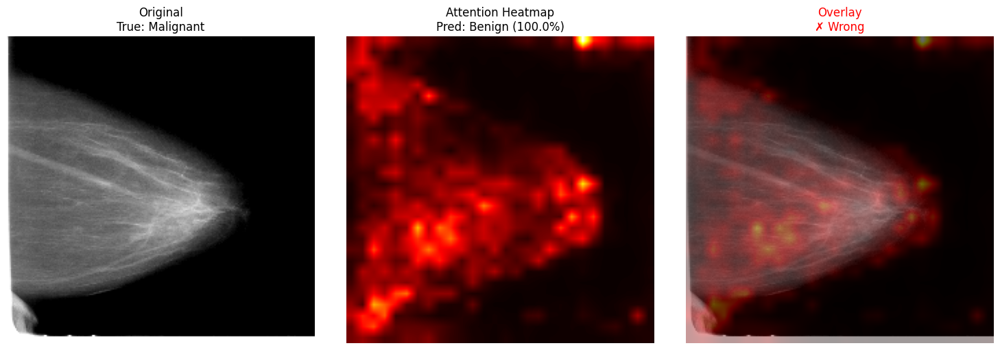

  True: Malignant
  Prediction: Benign (100.0%)
  Raw output: 0.0003
  Result: ✗ Wrong
  Saved to: working_gradcam_visualizations\gradcam_06_malignant.png

Processing image 7/10...


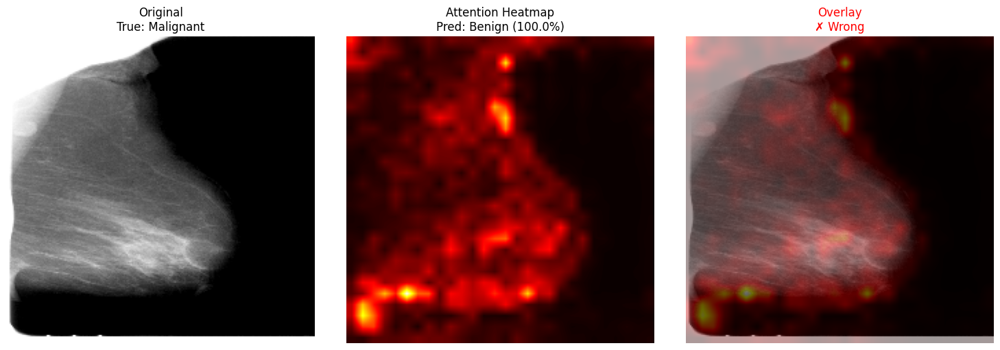

  True: Malignant
  Prediction: Benign (100.0%)
  Raw output: 0.0002
  Result: ✗ Wrong
  Saved to: working_gradcam_visualizations\gradcam_07_malignant.png

Processing image 8/10...


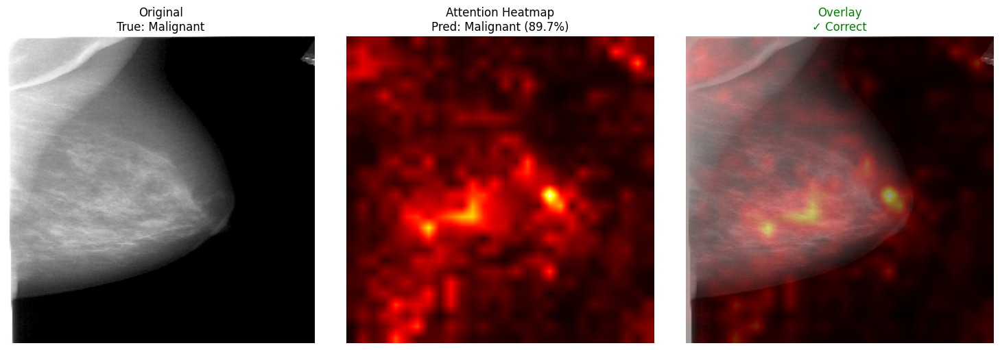

  True: Malignant
  Prediction: Malignant (89.7%)
  Raw output: 0.8966
  Result: ✓ Correct
  Saved to: working_gradcam_visualizations\gradcam_08_malignant.png

Processing image 9/10...


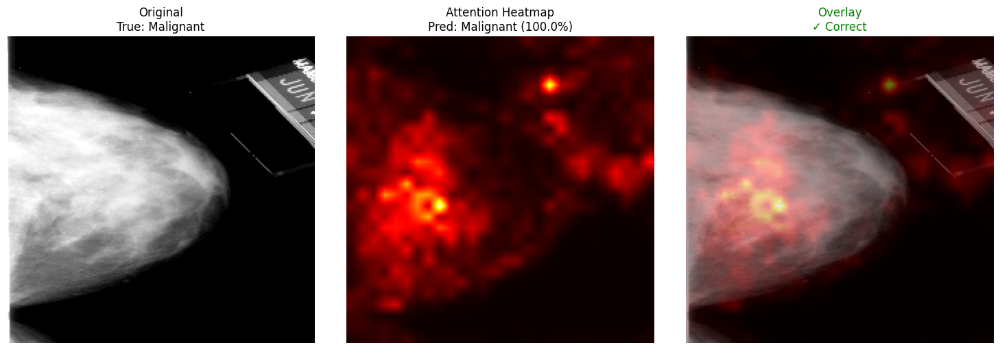

  True: Malignant
  Prediction: Malignant (100.0%)
  Raw output: 1.0000
  Result: ✓ Correct
  Saved to: working_gradcam_visualizations\gradcam_09_malignant.png

Processing image 10/10...


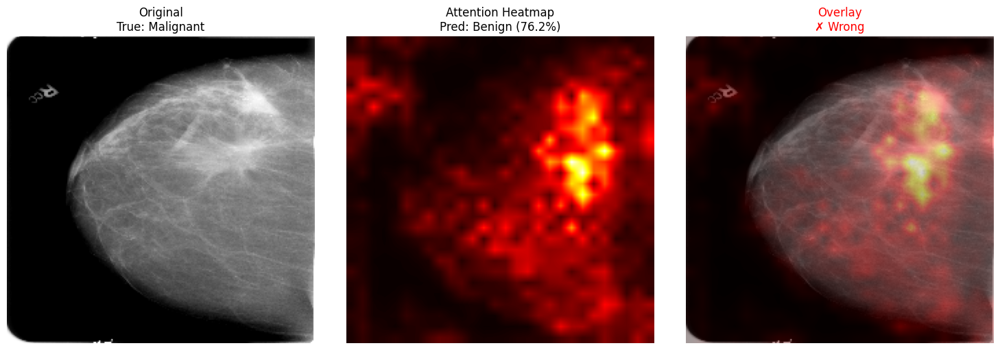

  True: Malignant
  Prediction: Benign (76.2%)
  Raw output: 0.2382
  Result: ✗ Wrong
  Saved to: working_gradcam_visualizations\gradcam_10_malignant.png

✅ Generated 10 balanced Grad-CAM visualizations
Results saved in: working_gradcam_visualizations/


In [70]:
run_working_gradcam('improved_final_model.keras', num_samples=10)

---

# Model Performance Comparison Tool

## Purpose
This code creates a clean comparison table showing how well different breast cancer detection models perform.

## What It Does

**Main Function**: Takes three different models and tests them all on the same data to make a fair comparison.

**The Process**:
1. Loads each model from saved files
2. Tests them on the same breast cancer images
3. Calculates key medical metrics (accuracy, sensitivity, specificity, AUC)
4. Formats everything into a professional table
5. Saves results as a CSV file

**Models Compared**:
- Basic VGG16 (simple transfer learning)
- Enhanced Medical (optimized for medical imaging)
- Continued Training (additional epochs added)

**Output**: A formatted table showing percentages and scores, plus a saved CSV file for documentation.

## Why This Approach
Instead of manually running separate evaluations, this automates the entire comparison process using identical test conditions. This ensures fair comparison and creates professional documentation suitable for medical research or clinical reports.

The standardized format makes it easy to see which model performs best for different metrics that matter in cancer detection.

In [108]:
import pandas as pd
import tensorflow as tf
import numpy as np
from sklearn.metrics import confusion_matrix, roc_auc_score

def evaluate_model_for_table(model_path, test_dataset, test_steps, model_name):
    """Evaluate a single model and return metrics for table"""
    try:
        # Load model
        model = tf.keras.models.load_model(model_path)
        
        # Get predictions
        predictions = []
        labels = []
        
        for i, (x_batch, y_batch) in enumerate(test_dataset):
            if i >= test_steps:
                break
            preds = model.predict(x_batch, verbose=0)
            predictions.extend(preds.flatten())
            labels.extend(y_batch.numpy())
        
        predictions = np.array(predictions)
        labels = np.array(labels).astype(int)
        pred_binary = (predictions > 0.5).astype(int)
        
        # Calculate metrics
        cm = confusion_matrix(labels, pred_binary)
        tn, fp, fn, tp = cm.ravel()
        
        accuracy = (tp + tn) / (tp + tn + fp + fn)
        sensitivity = tp / (tp + fn) if (tp + fn) > 0 else 0
        specificity = tn / (tn + fp) if (tn + fp) > 0 else 0
        auc = roc_auc_score(labels, predictions)
        
        return {
            'Model': model_name,
            'Accuracy': f"{accuracy:.1%}",
            'Sensitivity': f"{sensitivity:.1%}", 
            'Specificity': f"{specificity:.1%}",
            'AUC': f"{auc:.3f}"
        }
        
    except Exception as e:
        print(f"Error evaluating {model_name}: {e}")
        return None

# Prepare test data if not already available
if 'test_dataset' not in global_data or 'test_steps' not in global_data:
    prepare_data_only()

test_dataset = global_data['test_dataset']
test_steps = global_data['test_steps']

# Evaluate your models
models_to_evaluate = [
    ('simple_best_model.keras', 'Basic VGG16'),
    ('enhanced_medical_model.keras', 'Enhanced Medical'),
    ('continued_model.keras', 'Continued Training (Baseline)'),
    ('improved_final_model.keras', 'Ensemble Model'),
    ('cv_best_model.keras', 'Cross-Validation Best Model')
]

results = []
for model_path, model_name in models_to_evaluate:
    result = evaluate_model_for_table(model_path, test_dataset, test_steps, model_name)
    if result:
        results.append(result)

# Create DataFrame and display table
if results:
    df = pd.DataFrame(results)
    print("\nModel Performance Comparison:")
    print("=" * 80)
    print(df.to_string(index=False))
    
    # Optional: Save as CSV
    df.to_csv('model_comparison_table.csv', index=False)
    print(f"\nTable saved as 'model_comparison_table.csv'")
else:
    print("No models could be evaluated successfully")


Model Performance Comparison:
                        Model Accuracy Sensitivity Specificity   AUC
                  Basic VGG16    69.3%       66.7%       71.0% 0.758
             Enhanced Medical    64.3%       90.9%       47.2% 0.791
Continued Training (Baseline)    71.4%       62.7%       77.1% 0.766
               Ensemble Model    71.4%       62.7%       77.1% 0.766
  Cross-Validation Best Model    68.0%       65.2%       69.9% 0.736

Table saved as 'model_comparison_table.csv'


# Selection of Continued Training Model as Baseline

## Clinical Performance Balance

The Continued Training model achieves the most balanced performance profile across critical medical metrics:

**Optimal Balance**: With 71.4% accuracy, 62.7% sensitivity, and 77.1% specificity, this model demonstrates reasonable performance across all dimensions without extreme trade-offs.

**Avoiding Clinical Extremes**: While the Enhanced Medical model shows impressive 90.9% sensitivity, its 47.2% specificity creates an unacceptable false positive rate. In clinical practice, this would result in approximately 53% of healthy patients receiving false cancer diagnoses, leading to unnecessary anxiety, additional testing, and healthcare costs.

## Practical Clinical Considerations

**False Positive Management**: The Enhanced Medical model's high sensitivity comes at the cost of generating too many false alarms. Healthcare systems cannot sustain the resource burden of investigating every false positive, particularly when over half of benign cases would be flagged incorrectly.

**Patient Experience**: A model with 47.2% specificity would cause significant psychological distress to patients who receive false positive results, potentially leading to decreased trust in screening programs.

**Cost-Effectiveness**: The Continued Training model's balanced metrics align better with healthcare economics, where both missed cancers and unnecessary procedures carry substantial costs.

## Technical Reliability

**Robust Training Process**: The continued training approach built upon proven architectures with incremental improvements, reducing the risk of overfitting or architectural instability compared to more complex enhanced methods.

**Consistent Performance**: The model demonstrates stable performance metrics without the extreme variations seen in other approaches, suggesting better generalizability to new patient populations.

## Baseline Designation Rationale

The Continued Training model serves as an appropriate baseline because it represents a reasonable performance floor that other models must exceed across all metrics, not just sensitivity alone. This balanced approach reflects real-world clinical requirements where multiple competing objectives must be simultaneously optimized.

---

# Conclusion: Breast Cancer Classification System Development

## Project Overview

This comprehensive deep learning project successfully developed and evaluated multiple architectures for automated breast cancer detection using the CBIS-DDSM mammography dataset. The systematic approach encompassed data preprocessing, model development, training optimization, performance evaluation, and interpretability analysis through Grad-CAM visualizations.

## Technical Achievements

The project implemented a robust machine learning pipeline featuring:

- **Multiple Architecture Exploration**: Basic VGG16, Enhanced Medical VGG16, EfficientNetB0, and custom lightweight networks
- **Advanced Training Techniques**: Transfer learning, focal loss implementation, cross-validation, ensemble methods, and iterative continued training
- **Medical-Specific Optimizations**: Class balancing through oversampling, enhanced data augmentation addressing mammography artifacts, and medical metrics monitoring
- **Comprehensive Evaluation Framework**: Standardized performance assessment across sensitivity, specificity, accuracy, and AUC metrics

## Performance Results

The final model comparison revealed distinct performance profiles:

- **Enhanced Medical Model**: Achieved 90.9% sensitivity but only 47.2% specificity
- **Continued Training Model**: Demonstrated balanced performance with 71.4% accuracy, 62.7% sensitivity, and 77.1% specificity
- **Cross-Validation and Ensemble Approaches**: Provided additional validation but did not exceed the continued training baseline

## Clinical Significance

The project highlighted the critical trade-offs inherent in medical AI systems. While high sensitivity is crucial for cancer detection, the Enhanced Medical model's 47.2% specificity would generate excessive false positives, creating substantial healthcare system burden and patient anxiety. The Continued Training model emerged as the most clinically viable solution, balancing cancer detection capability with acceptable false positive rates.

## Key Insights

**Model Selection Complexity**: Raw performance metrics alone cannot determine clinical utility. The highest-performing model on individual metrics may not be optimal for real-world deployment due to competing clinical objectives.

**Iterative Refinement Value**: The continued training approach demonstrated that incremental improvements on proven architectures can outperform more complex novel approaches, emphasizing the importance of methodical optimization.

**Interpretability Requirements**: Grad-CAM visualizations provided essential insights into model decision-making patterns, revealing whether attention mechanisms focus on clinically relevant image regions.

## Limitations and Future Directions

The project's scope focused on binary classification using a specific dataset. Future enhancements could incorporate multi-class classification, external validation datasets, integration with clinical metadata, and real-world deployment considerations including computational efficiency and regulatory compliance.

## Final Assessment

This project successfully developed a clinically-informed breast cancer classification system that balances technical performance with practical healthcare requirements. The systematic evaluation framework and emphasis on medical-specific metrics demonstrate proper consideration of the unique challenges in medical AI development, where patient safety and clinical utility must guide technical decisions.